## Problem statement

In this competition, you will build Regression models which accurately predict the popularity of new articles (the number of times it w will be shared online) based on ~60 features provided to you.

**Importance of online news**

The consumption of online news is expediting day by day due to the extensive adoption of smartphones and the rise of social networks. Note that online news content comprises various key properties. For example, it is easily produced and small in size; its lifespan is short and the cost is low. Such Qualities make news content more effective to be consumed on social sharing platforms. More interestingly, this sort of content can capture the eye of a signiﬁcant amount of Internet users within a brief period of your time. As a result, the main target on the analysis of online news content like predicting the recognition of stories articles, demonstrating the decay of interest over time to know the world of online news has greatly increased since it has so many practical meanings.

**Why news popularity prediction?**

There are multiple areas of applications for online news popularity prediction. Some of these benefits include gaining better insights into the audience consuming online news content. Consequently, it increases the ability of news organizations to deliver more relevant and appealing content in a proactive manner as well as the company can allocate resources more wisely to prepare stories over their life cycle. Moreover, prediction of news content is also beneﬁcial for trend forecasting, understanding the collective human behavior, advertisers to propose more proﬁtable monetization techniques, and readers to ﬁlter the huge amount of information quickly and efﬁciently.

# Step 1: Reading and Understanding the Data

###   Importing Necessary Libraries

In [1]:
#Data Structures
import pandas as pd
import numpy as np
import re
import os
import xgboost as xgb


### For installing missingno library, type this command in terminal
#pip install missingno

import missingno as msno
pd.set_option('display.max_columns', None)

#Sklearn
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.feature_selection import RFECV
from sklearn.feature_selection import RFE

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor


# from nltk.corpus import stopwords
# nltk.download('stopwords')
# from nltk.tokenize import word_tokenize

from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.manifold import TSNE
from sklearn.pipeline import Pipeline

from sklearn.metrics import confusion_matrix, precision_score, recall_score
from statsmodels.stats.outliers_influence import variance_inflation_factor

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

from sklearn.neighbors import LocalOutlierFactor


from sklearn import tree
import graphviz 
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text
from sklearn import metrics


#Others
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

### Import Datasets

In [2]:
data = pd.read_csv("train.csv")
unseen = pd.read_csv("test.csv")
sample = pd.read_csv("sample.csv")
data_dict = pd.read_csv("data_dictionary.csv")

print(data.shape)
print(unseen.shape)
print(sample.shape)
print(data_dict.shape)

(29733, 61)
(9911, 60)
(9911, 2)
(61, 3)


In [3]:
data.head()

,id,url,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,0,http://mashable.com/2013/03/15/build-arduino-p...,8.0,211.0,0.629808,1.0,0.800000,6.0,3.0,0.0,0.0,4.606635,8.0,0.0,0.0,0.0,0.0,1.0,0.0,217.0,2300.0,797.714286,0.0,617900.0,115912.500000,0.000000,5103.042553,2568.648709,2000.0,2000.0,2000.00,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.025025,0.025047,0.025012,0.025377,0.899540,0.647421,0.182837,0.033175,0.004739,0.875000,0.125000,0.413435,0.100000,0.6,-0.100000,NaN,-0.100000,1.000000,0.600000,0.500000,0.600000,36700
1,1,http://mashable.com/2013/09/04/edible-bar-codes/,12.0,416.0,0.603535,1.0,0.663580,22.0,7.0,1.0,16.0,5.004808,7.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,768.0,259.400000,0.0,NaN,169071.428571,0.000000,3339.790199,2112.665837,658.0,13700.0,4477.25,0.0,0.0,1.0,0.0,NaN,0.0,0.0,0.0,0.170984,0.029080,0.028572,0.742792,0.028572,0.449248,0.148915,0.038462,NaN,0.800000,0.200000,0.324716,0.033333,1.0,-0.228621,-0.5000,-0.071429,0.000000,0.000000,0.500000,0.000000,24200
2,2,http://mashable.com/2014/06/20/non-player-char...,7.0,229.0,0.638393,1.0,0.746479,9.0,4.0,1.0,1.0,4.829694,8.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,1100.0,472.625000,4800.0,843300.0,204837.500000,1575.400000,3562.101631,2589.125480,4800.0,NaN,4800.00,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.025046,0.025041,0.025001,0.025000,0.899912,0.353209,0.116600,0.034934,0.021834,NaN,0.384615,0.354545,0.050000,1.0,-0.260833,-0.5000,-0.166667,0.000000,0.000000,0.500000,0.000000,945
3,3,http://mashable.com/2014/08/06/food-art-vine-c...,9.0,473.0,0.542373,1.0,0.752809,7.0,0.0,1.0,1.0,4.634249,7.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,447.0,150.400000,0.0,843300.0,229728.571429,0.000000,3504.933802,NaN,0.0,0.0,0.00,0.0,0.0,1.0,0.0,NaN,0.0,0.0,0.0,0.028580,0.028581,0.028577,0.166853,0.747408,0.548957,0.254370,0.065539,0.010571,0.861111,0.138889,0.356253,0.136364,0.7,-0.167500,-0.2500,-0.100000,0.000000,0.000000,0.500000,0.000000,844
4,4,http://mashable.com/2014/12/17/blackberry-clas...,13.0,1097.0,0.505213,1.0,0.676343,10.0,4.0,14.0,0.0,4.678213,4.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,1200.0,299.250000,33100.0,843300.0,381925.000000,2822.635182,5418.750000,3668.285640,1400.0,2300.0,2000.00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.050004,0.052276,0.050148,0.797536,0.050036,0.436525,0.156793,0.041021,0.010027,0.803571,0.196429,0.366255,0.033333,1.0,-0.193182,-0.3125,-0.100000,0.383333,0.166667,0.116667,0.166667,551


In [4]:
data = data.set_index('id')

In [5]:
data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29733 entries, 0 to 29732
Data columns (total 60 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   url                            29733 non-null  object 
 1   n_tokens_title                 29733 non-null  float64
 2   n_tokens_content               29733 non-null  float64
 3   n_unique_tokens                29733 non-null  float64
 4   n_non_stop_words               29733 non-null  float64
 5   n_non_stop_unique_tokens       29733 non-null  float64
 6   num_hrefs                      28921 non-null  float64
 7   num_self_hrefs                 25200 non-null  float64
 8   num_imgs                       24326 non-null  float64
 9   num_videos                     29146 non-null  float64
 10  average_token_length           29733 non-null  float64
 11  num_keywords                   29269 non-null  float64
 12  data_channel_is_lifestyle      29733 non-null 

### Remove columns which are not useful for modelling

In [6]:
data.drop(['url'], axis=1, inplace=True)

In [7]:
data.head()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,8.0,211.0,0.629808,1.0,0.800000,6.0,3.0,0.0,0.0,4.606635,8.0,0.0,0.0,0.0,0.0,1.0,0.0,217.0,2300.0,797.714286,0.0,617900.0,115912.500000,0.000000,5103.042553,2568.648709,2000.0,2000.0,2000.00,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.025025,0.025047,0.025012,0.025377,0.899540,0.647421,0.182837,0.033175,0.004739,0.875000,0.125000,0.413435,0.100000,0.6,-0.100000,NaN,-0.100000,1.000000,0.600000,0.500000,0.600000,36700
1,12.0,416.0,0.603535,1.0,0.663580,22.0,7.0,1.0,16.0,5.004808,7.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,768.0,259.400000,0.0,NaN,169071.428571,0.000000,3339.790199,2112.665837,658.0,13700.0,4477.25,0.0,0.0,1.0,0.0,NaN,0.0,0.0,0.0,0.170984,0.029080,0.028572,0.742792,0.028572,0.449248,0.148915,0.038462,NaN,0.800000,0.200000,0.324716,0.033333,1.0,-0.228621,-0.5000,-0.071429,0.000000,0.000000,0.500000,0.000000,24200
2,7.0,229.0,0.638393,1.0,0.746479,9.0,4.0,1.0,1.0,4.829694,8.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,1100.0,472.625000,4800.0,843300.0,204837.500000,1575.400000,3562.101631,2589.125480,4800.0,NaN,4800.00,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.025046,0.025041,0.025001,0.025000,0.899912,0.353209,0.116600,0.034934,0.021834,NaN,0.384615,0.354545,0.050000,1.0,-0.260833,-0.5000,-0.166667,0.000000,0.000000,0.500000,0.000000,945
3,9.0,473.0,0.542373,1.0,0.752809,7.0,0.0,1.0,1.0,4.634249,7.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,447.0,150.400000,0.0,843300.0,229728.571429,0.000000,3504.933802,NaN,0.0,0.0,0.00,0.0,0.0,1.0,0.0,NaN,0.0,0.0,0.0,0.028580,0.028581,0.028577,0.166853,0.747408,0.548957,0.254370,0.065539,0.010571,0.861111,0.138889,0.356253,0.136364,0.7,-0.167500,-0.2500,-0.100000,0.000000,0.000000,0.500000,0.000000,844
4,13.0,1097.0,0.505213,1.0,0.676343,10.0,4.0,14.0,0.0,4.678213,4.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,1200.0,299.250000,33100.0,843300.0,381925.000000,2822.635182,5418.750000,3668.285640,1400.0,2300.0,2000.00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.050004,0.052276,0.050148,0.797536,0.050036,0.436525,0.156793,0.041021,0.010027,0.803571,0.196429,0.366255,0.033333,1.0,-0.193182,-0.3125,-0.100000,0.383333,0.166667,0.116667,0.166667,551


# Step 2: Data Preparation

Lets analyse the features that are given to us. As detailed in the Data section of the competition page, the features provided come from different sources and have been categorized into various types. Some of these are coming directly from other NLP (Natural language processing) models. Let's print and try to categorize the variable names for better analysis.

In [8]:
for i in data_dict.iterrows():
    print(i[1]['column'],':',i[1]['description'])

url : URL of the article (non-predictive)
timedelta : Days between the article publication and the dataset acquisition (non-predictive)
ntokenstitle : Number of words in the title
ntokenscontent : Number of words in the content
nuniquetokens : Rate of unique words in the content
nnonstop_words : Rate of non-stop words in the content
nnonstopuniquetokens : Rate of unique non-stop words in the content
num_hrefs : Number of links
numselfhrefs : Number of links to other articles published by Mashable
num_imgs : Number of images
num_videos : Number of videos
averagetokenlength : Average length of the words in the content
numkeywords : Number of keywords in the metadata
datachannelislifestyle : Is data channel 'Lifestyle'?
datachannelis_entertainment : Is data channel 'Entertainment'?
datachannelis_bus : Is data channel 'Business'?
datachannelis_socmed : Is data channel 'Social Media'?
datachannelis_tech : Is data channel 'Tech'?
datachannelis_world : Is data channel 'World'?
kwminmin : Wors

In [9]:
word_features = ['n_tokens_title', 
                 'n_tokens_content', 
                 'n_unique_tokens', 
                 'n_non_stop_words', 
                 'n_non_stop_unique_tokens', 
                 'average_token_length']

media_features = ['num_imgs', 'num_videos']

temporal_features = ['weekday_is_monday', 
                     'weekday_is_tuesday', 
                     'weekday_is_wednesday',
                     'weekday_is_thursday',
                     'weekday_is_friday',
                     'weekday_is_saturday',
                     'weekday_is_sunday',
                     'is_weekend']

channel_features = ['data_channel_is_lifestyle', 'data_channel_is_entertainment', 
                    'data_channel_is_bus', 'data_channel_is_socmed', 
                    'data_channel_is_tech', 'data_channel_is_world']

keyword_features = ['kw_min_min', 'kw_max_min', 'kw_avg_min',
                    'kw_min_max', 'kw_max_max', 'kw_avg_max', 
                    'kw_min_avg', 'kw_max_avg', 'kw_avg_avg',
                    'num_keywords']


reference_features = ['num_hrefs',
                      'num_self_hrefs',
                      'self_reference_min_shares',
                      'self_reference_max_shares',
                      'self_reference_avg_sharess']

topic_features = ['LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04']

subjectivity_features = ['global_subjectivity', 'title_subjectivity', 'abs_title_subjectivity']

sentiment_features = ['global_sentiment_polarity', 'global_rate_positive_words',
                      'global_rate_negative_words', 'rate_positive_words',
                      'rate_negative_words', 'avg_positive_polarity',
                      'min_positive_polarity', 'max_positive_polarity',
                      'avg_negative_polarity', 'min_negative_polarity',
                      'max_negative_polarity', 'title_sentiment_polarity',
                      'abs_title_sentiment_polarity']

# ids = ['id']

# others = ['url']

target = ['shares']

In [10]:
features = [*word_features, *media_features, 
            *temporal_features, *channel_features, 
            *keyword_features, *reference_features, 
            *topic_features, *subjectivity_features, 
            *sentiment_features, *target]

len(features), len(data.columns)

(59, 59)

### Splitting the Train Data into Training and Validation Sets

In [11]:
X = data.loc[:, data.columns != 'shares']
y = data[target]

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=100)

[i.shape for i in [X_train, X_test, y_train, y_test]]

[(23786, 58), (5947, 58), (23786, 1), (5947, 1)]

In [13]:
X_train.head()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12722,11.0,434.0,0.537559,1.0,0.650909,13.0,5.0,1.0,1.0,4.465438,5.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,549.0,119.000000,20800.0,843300.0,311200.000000,1940.056391,3449.327025,2790.597387,1300.0,19900.0,6150.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.040003,0.041853,0.257899,0.620245,0.040000,NaN,0.223466,0.048387,0.009217,0.840000,0.160000,0.352386,0.050000,0.8,-0.285764,-0.40,-0.155556,0.90,0.40,0.4,0.40
19161,10.0,285.0,0.620438,1.0,0.691011,15.0,4.0,10.0,0.0,4.364912,7.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,678.0,308.857143,4100.0,843300.0,332785.714286,1499.250000,8669.153846,5229.927616,13900.0,31500.0,22700.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.028572,0.028666,0.028572,0.885620,0.028572,0.643750,0.025000,0.028070,0.017544,0.615385,NaN,0.425000,0.100000,0.5,-0.537500,-0.70,-0.187500,1.00,0.50,0.5,0.50
17705,11.0,572.0,0.576710,1.0,0.754821,16.0,0.0,1.0,0.0,4.854895,8.0,0.0,0.0,1.0,0.0,0.0,0.0,4.0,318.0,126.714286,0.0,843300.0,322375.000000,0.000000,4444.181688,2383.172875,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.584860,0.339585,0.025001,0.025537,0.025017,0.363235,0.134066,0.036713,0.008741,0.807692,0.192308,0.343856,0.062500,1.0,-0.321667,-0.75,-0.125000,0.54,0.16,NaN,0.16
3394,12.0,233.0,0.602620,1.0,0.804348,4.0,NaN,NaN,0.0,4.695279,6.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,551.0,143.000000,0.0,843300.0,298616.666667,0.000000,4317.313514,2591.901385,1800.0,1800.0,1800.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.033482,0.033340,0.034033,0.033356,0.865789,0.308586,0.043224,0.017167,0.017167,0.500000,0.500000,0.402841,0.136364,0.7,-0.208333,-0.25,-0.166667,0.00,0.00,0.5,0.00
1416,8.0,586.0,0.535714,1.0,0.694286,8.0,3.0,11.0,0.0,4.510239,7.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,369.0,114.400000,0.0,843300.0,164528.571429,0.000000,3581.760784,NaN,2500.0,2500.0,2500.0,0.0,0.0,1.0,0.0,NaN,0.0,0.0,0.0,0.028578,0.171545,0.589345,0.028575,0.181956,0.419458,0.205988,0.058020,0.008532,0.871795,0.128205,0.401208,0.033333,1.0,-0.198333,-0.50,-0.100000,0.00,0.00,0.5,0.00


In [14]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23786 entries, 12722 to 5640
Data columns (total 58 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   n_tokens_title                 23786 non-null  float64
 1   n_tokens_content               23786 non-null  float64
 2   n_unique_tokens                23786 non-null  float64
 3   n_non_stop_words               23786 non-null  float64
 4   n_non_stop_unique_tokens       23786 non-null  float64
 5   num_hrefs                      23131 non-null  float64
 6   num_self_hrefs                 20152 non-null  float64
 7   num_imgs                       19468 non-null  float64
 8   num_videos                     23309 non-null  float64
 9   average_token_length           23786 non-null  float64
 10  num_keywords                   23417 non-null  float64
 11  data_channel_is_lifestyle      23786 non-null  float64
 12  data_channel_is_entertainment  23786 non-nu

In [15]:
X_train.describe()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity
count,23786.000000,23786.000000,23786.000000,23786.000000,23786.000000,23131.000000,20152.000000,19468.000000,23309.000000,23786.000000,23417.000000,23786.000000,23786.000000,23786.000000,23786.000000,23786.000000,23786.000000,22902.000000,23406.000000,23717.000000,23676.000000,22569.000000,23692.000000,23547.000000,23243.000000,23031.000000,23556.000000,22374.000000,23527.000000,22995.000000,23189.000000,22544.000000,23552.000000,23096.000000,23710.000000,22584.000000,22051.000000,23786.000000,23786.000000,23786.000000,23786.000000,23786.000000,21999.000000,23506.000000,23114.000000,23063.000000,23309.000000,23304.000000,22821.000000,23440.000000,23661.000000,23634.000000,23152.000000,23221.000000,23682.000000,23575.000000,23158.000000,22597.000000
mean,10.411629,544.782225,0.560482,1.013663,0.700950,10.840560,3.285282,4.465122,1.272556,4.546123,7.224666,0.052174,0.176196,0.157866,0.057387,0.186202,0.214664,25.739149,1147.128228,310.116216,13590.525173,753810.253002,259655.238813,1118.334046,5637.369106,3136.156573,3974.024483,10402.381817,6422.613617,0.167689,0.185648,0.188077,0.184740,0.143531,0.062590,0.067039,0.129427,0.185164,0.140239,0.217885,0.223023,0.233647,0.443413,0.118702,0.039590,0.016648,0.681464,0.288507,0.353148,0.095536,0.755693,-0.258892,-0.521370,-0.106629,0.281945,0.070068,0.342397,0.155417
std,2.121878,462.636693,4.543878,6.752144,4.213024,11.342039,3.906943,8.252797,4.217423,0.847862,1.911287,0.222382,0.380995,0.364623,0.232585,0.389278,0.410598,69.212291,3661.075483,589.930497,58024.996895,212547.517775,135093.941826,1134.515998,6009.298658,1300.582569,18529.641843,40389.277614,23391.015551,0.373598,0.388831,0.390782,0.388095,0.350621,0.242228,0.250094,0.335680,0.264215,0.218400,0.283454,0.295242,0.289480,0.116487,0.096480,0.017382,0.010840,0.190171,0.155708,0.104814,0.071181,0.248145,0.127258,0.291156,0.093865,0.324153,0.265158,0.188724,0.225834
min,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.393750,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000
25%,9.000000,245.000000,0.471866,1.000000,0.627372,4.000000,1.000000,1.000000,0.000000,4.476950,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,444.000000,140.659000,0.000000,843300.000000,173233.333333,0.000000,3560.441280,2387.620370,629.000000,1000.000000,973.416667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.025053,0.025012,0.028571,0.028571,0.028574,0.396367,0.057629,0.028340,0.009639,0.600000,0.187500,0.305128,0.050000,0.600000,-0.327778,-0.700000,-0.125000,0.

### Remove Duplicates

In [16]:
X_train.drop_duplicates() #- remove duplicates

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12722,11.0,434.0,0.537559,1.0,0.650909,13.0,5.0,1.0,1.0,4.465438,5.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,549.0,119.000000,20800.0,843300.0,311200.000000,1940.056391,3449.327025,2790.597387,1300.0,19900.0,6150.00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.040003,0.041853,0.257899,0.620245,0.040000,NaN,0.223466,0.048387,0.009217,0.840000,0.160000,0.352386,0.050000,0.8,-0.285764,-0.400,-0.155556,0.90,0.40,0.4,0.40
19161,10.0,285.0,0.620438,1.0,0.691011,15.0,4.0,10.0,0.0,4.364912,7.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,678.0,308.857143,4100.0,843300.0,332785.714286,1499.250000,8669.153846,5229.927616,13900.0,31500.0,22700.00,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.028572,0.028666,0.028572,0.885620,0.028572,0.643750,0.025000,0.028070,0.017544,0.615385,NaN,0.425000,0.100000,0.5,-0.537500,-0.700,-0.187500,1.00,0.50,0.5,0.50
17705,11.0,572.0,0.576710,1.0,0.754821,16.0,0.0,1.0,0.0,4.854895,8.0,0.0,0.0,1.0,0.0,0.0,0.0,4.0,318.0,126.714286,0.0,843300.0,322375.000000,0.000000,4444.181688,2383.172875,0.0,0.0,0.00,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.584860,0.339585,0.025001,0.025537,0.025017,0.363235,0.134066,0.036713,0.008741,0.807692,0.192308,0.343856,0.062500,1.0,-0.321667,-0.750,-0.125000,0.54,0.16,NaN,0.16
3394,12.0,233.0,0.602620,1.0,0.804348,4.0,NaN,NaN,0.0,4.695279,6.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,551.0,143.000000,0.0,843300.0,298616.666667,0.000000,4317.313514,2591.901385,1800.0,1800.0,1800.00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.033482,0.033340,0.034033,0.033356,0.865789,0.308586,0.043224,0.017167,0.017167,0.500000,0.500000,0.402841,0.136364,0.7,-0.208333,-0.250,-0.166667,0.00,0.00,0.5,0.00
1416,8.0,586.0,0.535714,1.0,0.694286,8.0,3.0,11.0,0.0,4.510239,7.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,369.0,114.400000,0.0,843300.0,164528.571429,0.000000,3581.760784,NaN,2500.0,2500.0,2500.00,0.0,0.0,1.0,0.0,NaN,0.0,0.0,0.0,0.028578,0.171545,0.589345,0.028575,0.181956,0.419458,0.205988,0.058020,0.008532,0.871795,0.128205,0.401208,0.033333,1.0,-0.198333,-0.500,-0.100000,0.00,0.00,0.5,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12119,9.0,423.0,0.594458,1.0,0.757937,22.0,2.0,20.0,1.0,4.638298,6.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,339.0,163.666667,13900.0,NaN,441633.333333,3490.598812,7592.062928,5496.728060,4000.0,4000.0,4000.00,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.033334,0.033353,0.033334,0.866647,0.033333,0.632162,0.154361,0.052009,0.021277,0.709677,0.290323,0.422107,0.100000,1.0,-0.380556,-0.800,-0.125000,0.00,0.00,0.5,0.00
24423,11.0,578.0,0.522648,1.0,0.684507,11.0,0.0,1.0,0.0,4.970588,10.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,699.0,184.000000,0.0,843300.0,196669.900000,0.000000,4504.648000,2763.875362,0.0,0.0,0.00,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.020002,0.020002,0.632940,0.020001,0.307056,0.464454,0.088564,0.032872,0.029412,

In [17]:
X_train.shape

(23786, 58)

In [18]:
constant_columns = [col for col in X_train.columns if len(X_train[col].unique()) <=2] # to see even blank values in the constant columns
                                                                                #otherwise it should be equal to 1

In [19]:
constant_columns

['data_channel_is_lifestyle',
 'data_channel_is_entertainment',
 'data_channel_is_bus',
 'data_channel_is_socmed',
 'data_channel_is_tech',
 'data_channel_is_world']

In [20]:
constant_columns = [col for col in X_train.columns if len(X_train[col].unique()) <=1] # to see even blank values in the constant columns
                                                                                #otherwise it should be equal to 1

In [21]:
constant_columns

[]

### Missing Value Analysis

In [22]:
missing_data_percent = 100*X_train.isnull().sum()/(X_train.shape[0])
missing_data_percent[missing_data_percent>0].sort_values(ascending=False)

num_imgs                        18.153536
num_self_hrefs                  15.277895
global_subjectivity              7.512823
is_weekend                       7.294207
self_reference_max_shares        5.936265
weekday_is_wednesday             5.221559
kw_max_max                       5.116455
weekday_is_sunday                5.053393
abs_title_sentiment_polarity     4.998739
avg_positive_polarity            4.057008
kw_min_min                       3.716472
weekday_is_monday                3.325486
kw_avg_avg                       3.174136
global_rate_negative_words       3.039603
weekday_is_friday                2.900866
global_rate_positive_words       2.825191
num_hrefs                        2.753721
min_negative_polarity            2.665433
abs_title_subjectivity           2.640209
weekday_is_tuesday               2.509880
max_negative_polarity            2.375347
kw_max_avg                       2.282855
rate_negative_words              2.026402
rate_positive_words              2

In [23]:
missing_data_percent = 100*X_train.isnull().sum()/(X_train.shape[0])
impute_cols = list(missing_data_percent[missing_data_percent.gt(0)].index)

print(impute_cols)

['num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos', 'num_keywords', 'kw_min_min', 'kw_max_min', 'kw_avg_min', 'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg', 'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares', 'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'global_subjectivity', 'global_sentiment_polarity', 'global_rate_positive_words', 'global_rate_negative_words', 'rate_positive_words', 'rate_negative_words', 'avg_positive_polarity', 'min_positive_polarity', 'max_positive_polarity', 'avg_negative_polarity', 'min_negative_polarity', 'max_negative_polarity', 'title_subjectivity', 'title_sentiment_polarity', 'abs_title_subjectivity', 'abs_title_sentiment_polarity']


### Impute Missing Values

In [24]:
imp = SimpleImputer(strategy='median') 
                                       
X_train[impute_cols] = imp.fit_transform(X_train[impute_cols])

'''these are continous numerical columns not discrete columns,
 we can also impute by using box plots ''' 

'these are continous numerical columns not discrete columns,\n we can also impute by using box plots '

In [25]:
#Columns with missing percentage greater than 0%
missing_data_percent = 100*X_train.isnull().sum()/(X_train.shape[0])
missing_data_percent[missing_data_percent>0]

Series([], dtype: float64)

In [26]:
X_train.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23786 entries, 12722 to 5640
Data columns (total 58 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   n_tokens_title                 23786 non-null  float64
 1   n_tokens_content               23786 non-null  float64
 2   n_unique_tokens                23786 non-null  float64
 3   n_non_stop_words               23786 non-null  float64
 4   n_non_stop_unique_tokens       23786 non-null  float64
 5   num_hrefs                      23786 non-null  float64
 6   num_self_hrefs                 23786 non-null  float64
 7   num_imgs                       23786 non-null  float64
 8   num_videos                     23786 non-null  float64
 9   average_token_length           23786 non-null  float64
 10  num_keywords                   23786 non-null  float64
 11  data_channel_is_lifestyle      23786 non-null  float64
 12  data_channel_is_entertainment  23786 non-nu

In [27]:
# n_tokens_content represents Number of words in the content
# However its minimum value to be 0. Means that there are articles that do not have any content.
# Such records should be dropped as their related attributes add no meaning to our analysis

# find number of rows that contain 0 for n_tokens_content
num_of_nowords=X_train[X_train['n_tokens_content']==0].index
print('number of news items with no words',num_of_nowords.size)
print(num_of_nowords)

# Drop these items or rows with n_tokens_content = 0
y_train=y_train[X_train['n_tokens_content'] != 0]
X_train = X_train[X_train['n_tokens_content'] != 0]

number of news items with no words 716
Int64Index([14567, 15236,  9118, 22549, 16991, 12266,  3498, 16302,  2482,
            12988,
            ...
            12125, 19754,  6064, 19934, 29123, 19701, 17187,  5939,  7074,
            26475],
           dtype='int64', name='id', length=716)


In [28]:
X_train.shape

(23070, 58)

In [29]:
y_train.shape

(23070, 1)

In [30]:
X_train["n_non_stop_words"].describe()

count    23070.000000
mean         1.045124
std          6.853729
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max       1042.000000
Name: n_non_stop_words, dtype: float64

In [31]:
# Here, we will go ahead and drop the field of ' n_non_stop_words. It doesn't contain relaible information.
X_train.drop(labels=['n_non_stop_words'], axis = 1, inplace=True)

In [32]:
X_train.drop(['is_weekend'], axis=1,inplace=True) #As this info is already captured in sat and sunday columns

In [33]:
indicator_columns = ["weekday_is_monday","weekday_is_tuesday","weekday_is_wednesday","weekday_is_thursday",
                  "weekday_is_friday","weekday_is_saturday","weekday_is_sunday",                
                  "data_channel_is_lifestyle","data_channel_is_entertainment","data_channel_is_bus",
                  "data_channel_is_socmed","data_channel_is_tech","data_channel_is_world"]


In [34]:
numeric_columns = list(X_train.columns[~X_train.columns.isin(indicator_columns)])

In [35]:
numeric_columns

['n_tokens_title',
 'n_tokens_content',
 'n_unique_tokens',
 'n_non_stop_unique_tokens',
 'num_hrefs',
 'num_self_hrefs',
 'num_imgs',
 'num_videos',
 'average_token_length',
 'num_keywords',
 'kw_min_min',
 'kw_max_min',
 'kw_avg_min',
 'kw_min_max',
 'kw_max_max',
 'kw_avg_max',
 'kw_min_avg',
 'kw_max_avg',
 'kw_avg_avg',
 'self_reference_min_shares',
 'self_reference_max_shares',
 'self_reference_avg_sharess',
 'LDA_00',
 'LDA_01',
 'LDA_02',
 'LDA_03',
 'LDA_04',
 'global_subjectivity',
 'global_sentiment_polarity',
 'global_rate_positive_words',
 'global_rate_negative_words',
 'rate_positive_words',
 'rate_negative_words',
 'avg_positive_polarity',
 'min_positive_polarity',
 'max_positive_polarity',
 'avg_negative_polarity',
 'min_negative_polarity',
 'max_negative_polarity',
 'title_subjectivity',
 'title_sentiment_polarity',
 'abs_title_subjectivity',
 'abs_title_sentiment_polarity']

### Outliers treatment

In [36]:

clf = LocalOutlierFactor(n_neighbors=50, contamination='auto')
X_out = X_train[numeric_columns].values
out_pred = clf.fit_predict(X_out)

In [37]:
print(out_pred)

[1 1 1 ... 1 1 1]


In [38]:
print(pd.Series(out_pred).value_counts())

 1    21182
-1     1888
dtype: int64


In [39]:
X_train_out_removed = X_train.loc[out_pred==1,:]
print(X_train_out_removed.shape)

(21182, 56)


In [40]:
y_train=y_train.loc[out_pred==1]

In [41]:
y_train.shape

(21182, 1)

In [42]:
Q1 = X_train_out_removed[numeric_columns].quantile(0.25)
Q3 = X_train_out_removed[numeric_columns].quantile(0.75)
IQR = Q3 - Q1
lowerwhisker=(Q1 - 1.5 * IQR)
upperwhisker=(Q3 + 1.5 * IQR)

outlier_count = ((X_train_out_removed[numeric_columns] < (Q1 - 1.5 * IQR)) | (X_train_out_removed[numeric_columns] > (Q3 + 1.5 * IQR))).sum()
print(outlier_count)

n_tokens_title                    89
n_tokens_content                1040
n_unique_tokens                  270
n_non_stop_unique_tokens         373
num_hrefs                       1595
num_self_hrefs                  1241
num_imgs                        4378
num_videos                      1572
average_token_length             286
num_keywords                       0
kw_min_min                      2230
kw_max_min                      1722
kw_avg_min                       822
kw_min_max                      2619
kw_max_max                      4438
kw_avg_max                       436
kw_min_avg                         0
kw_max_avg                       966
kw_avg_avg                       916
self_reference_min_shares       2505
self_reference_max_shares       2259
self_reference_avg_sharess      2114
LDA_00                          2825
LDA_01                          3129
LDA_02                          1244
LDA_03                          2193
LDA_04                             0
g

No handles with labels found to put in legend.


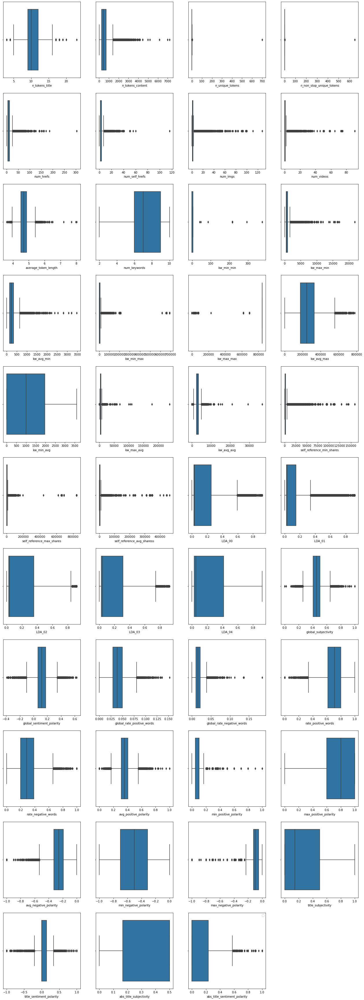

In [43]:

plt.figure(figsize=(22,80))
for i in (enumerate(numeric_columns)): ## i is tuple which has key and column name pairs
    plt.subplot(len(numeric_columns)//4 + 4,4,i[0]+1)
    sns.boxplot(X_train_out_removed[i[1]], orient='v')

plt.legend()
plt.show()  

In [44]:
#Treating outlier by clipping :  

for col in numeric_columns:
    percentiles = X_train_out_removed[col].quantile([0.01,0.99]).values
    X_train_out_removed[col][X_train_out_removed[col] <= percentiles[0]] = percentiles[0]
    X_train_out_removed[col][X_train_out_removed[col] >= percentiles[1]] = percentiles[1]

No handles with labels found to put in legend.


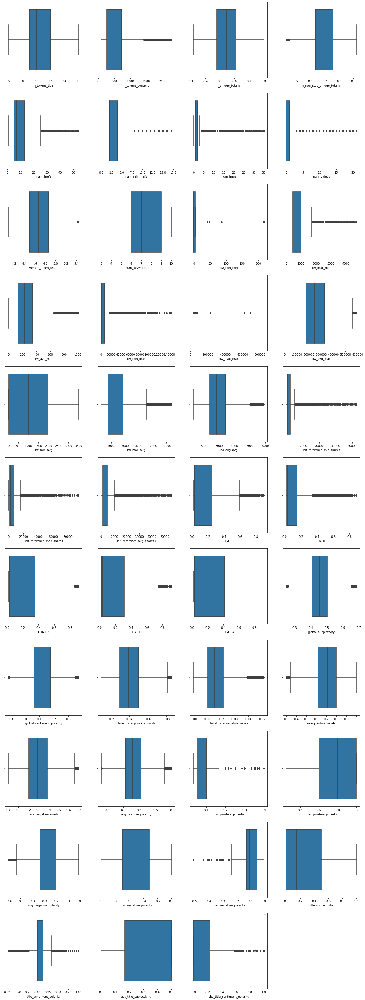

In [45]:
plt.figure(figsize=(22,80))
for i in (enumerate(numeric_columns)): ## i is tuple which has key and column name pairs
    plt.subplot(len(numeric_columns)//4 + 4,4,i[0]+1)
    sns.boxplot(X_train_out_removed[i[1]], orient='v')

plt.legend()
plt.show()  

In [46]:
low_shares = y_train['shares']<=10 

In [47]:
print(y_train.shape)
print(X_train_out_removed.shape)

(21182, 1)
(21182, 56)


In [48]:
y_train = y_train.loc[~low_shares,:]
X_train_out_removed = X_train_out_removed.loc[~low_shares,:]

In [49]:
print(y_train.shape)
print(X_train_out_removed.shape)

(21181, 1)
(21181, 56)


# Step 3: Exploratory Data Analysis 

In [50]:
eda_data = X_train_out_removed.copy()

In [51]:
eda_data['shares'] = y_train

In [52]:
eda_data['shares'].median()

1400.0

In [53]:
eda_data['popularity'] = np.where(eda_data['shares']<=1400,'Unpopular','Popular')

In [54]:
eda_data.head()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,popularity
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12722,11.0,434.0,0.537559,0.650909,13.0,5.0,1.0,1.0,4.465438,5.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,549.0,119.000000,20800.0,843300.0,311200.000000,1940.056391,3449.327025,2790.597387,1300.0,19900.0,6150.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.040003,0.041853,0.257899,0.620245,0.040000,0.453541,0.223466,0.048387,0.009217,0.840000,0.160000,0.352386,0.050000,0.8,-0.285764,-0.40,-0.155556,0.90,0.40,0.4,0.40,710,Unpopular
19161,10.0,285.0,0.620438,0.691011,15.0,4.0,10.0,0.0,4.364912,7.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,678.0,308.857143,4100.0,843300.0,332785.714286,1499.250000,8669.153846,5229.927616,13900.0,31500.0,22700.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.028572,0.028666,0.028572,0.885620,0.028572,0.643750,0.025000,0.028070,0.017544,0.615385,0.280800,0.425000,0.100000,0.5,-0.537500,-0.70,-0.187500,1.00,0.50,0.5,0.50,16600,Popular
17705,11.0,572.0,0.576710,0.754821,16.0,0.0,1.0,0.0,4.854895,8.0,0.0,0.0,1.0,0.0,0.0,0.0,4.0,318.0,126.714286,0.0,843300.0,322375.000000,0.000000,4444.181688,2383.172875,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.584860,0.339585,0.025001,0.025537,0.025017,0.363235,0.134066,0.036713,0.008741,0.807692,0.192308,0.343856,0.062500,1.0,-0.321667,-0.75,-0.125000,0.54,0.16,0.5,0.16,1300,Unpopular
3394,12.0,233.0,0.602620,0.804348,4.0,2.0,1.0,0.0,4.695279,6.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,551.0,143.000000,0.0,843300.0,298616.666667,0.000000,4317.313514,2591.901385,1800.0,1800.0,1800.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.033482,0.033340,0.034033,0.033356,0.865789,0.308586,0.043224,0.017167,0.017167,0.500000,0.500000,0.402841,0.136364,0.7,-0.208333,-0.25,-0.166667,0.00,0.00,0.5,0.00,1600,Popular
1416,8.0,586.0,0.535714,0.694286,8.0,3.0,11.0,0.0,4.510239,7.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,369.0,114.400000,0.0,843300.0,164528.571429,0.000000,3581.760784,2873.543299,2500.0,2500.0,2500.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.028578,0.171545,0.589345,0.028575,0.181956,0.419458,0.205988,0.058020,0.008532,0.871795,0.128205,0.401208,0.033333,1.0,-0.198333,-0.50,-0.100000,0.00,0.00,0.5,0.00,1300,Unpopular


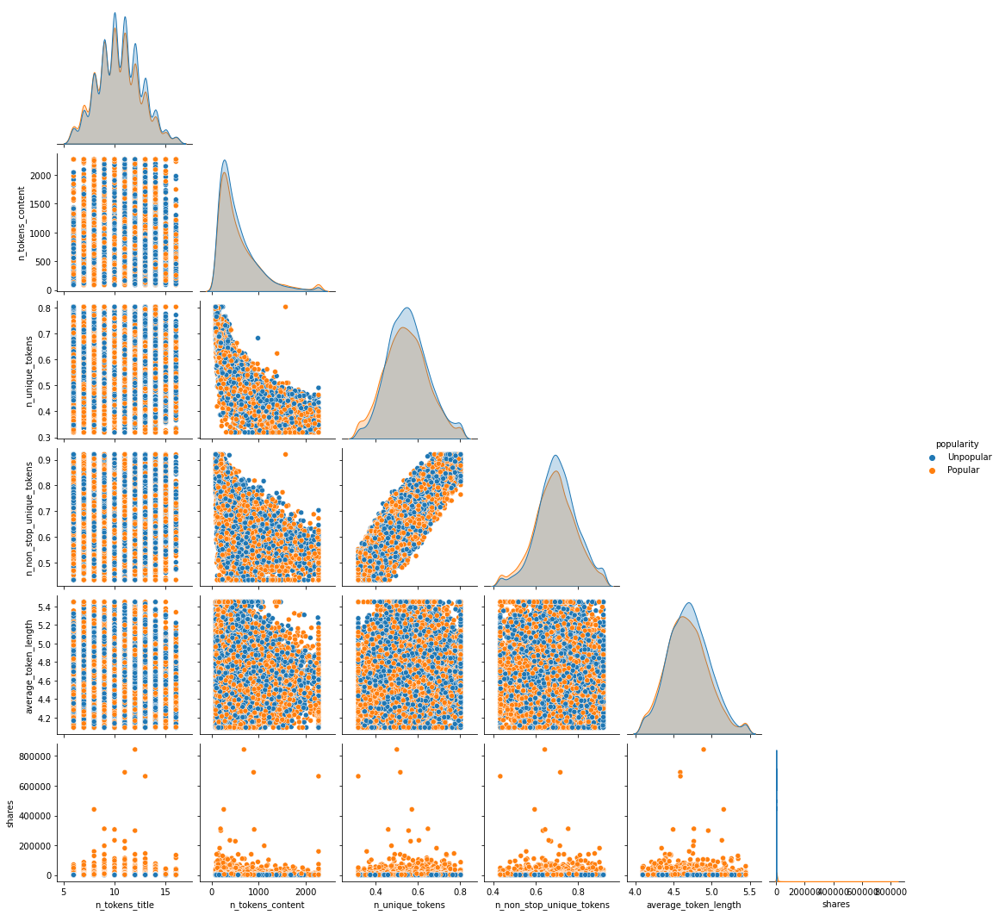

In [55]:
plot_cols =  ['n_tokens_title', 
                 'n_tokens_content', 
                 'n_unique_tokens',  
                 'n_non_stop_unique_tokens', 
                 'average_token_length','shares','popularity']

sns.pairplot(eda_data[plot_cols],corner=True,hue='popularity',diag_kind='kde')

plt.show()

- `n_unique_tokens` and `n_non_stop_unique_tokens` are positively correlated. 
- `shares` column has extremely high kurtosis and needs to be transformed before starting modelling 

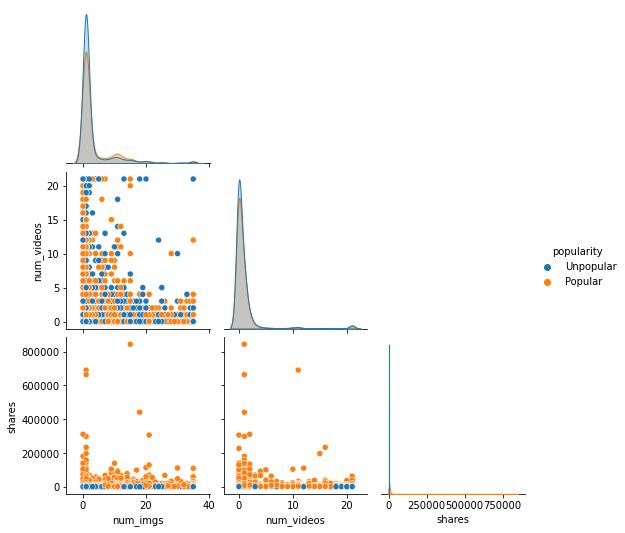

In [56]:
plot_cols_1 =  ['num_imgs', 'num_videos','shares','popularity']


sns.pairplot(eda_data[plot_cols_1],corner=True,hue='popularity',diag_kind='kde')

plt.show()

- Number of Images and videos in the article doenst seem to influence the shares of the article

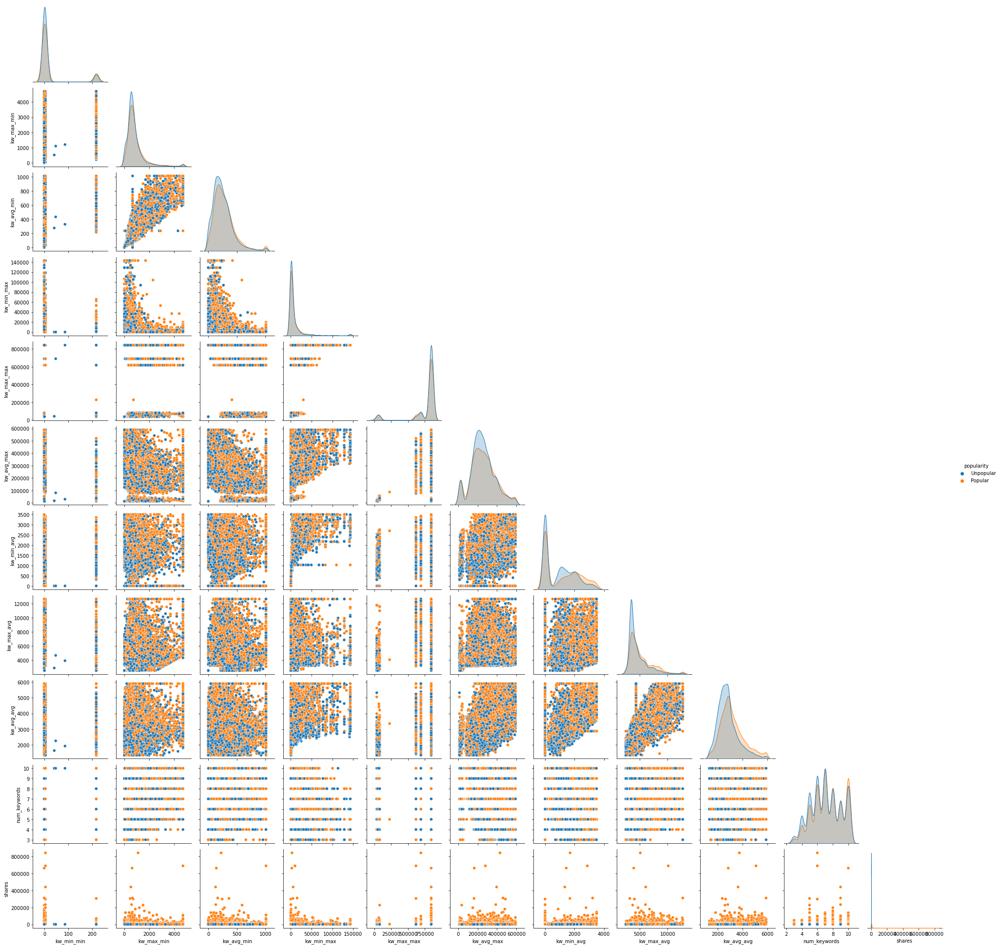

In [57]:
plot_cols_2 =  ['kw_min_min', 'kw_max_min', 'kw_avg_min',
                    'kw_min_max', 'kw_max_max', 'kw_avg_max', 
                    'kw_min_avg', 'kw_max_avg', 'kw_avg_avg',
                    'num_keywords','shares','popularity']


sns.pairplot(eda_data[plot_cols_2],corner=True,hue='popularity',diag_kind='kde')

plt.show()

- we can observe a slight correlation among the, min, max and avg in respective groups

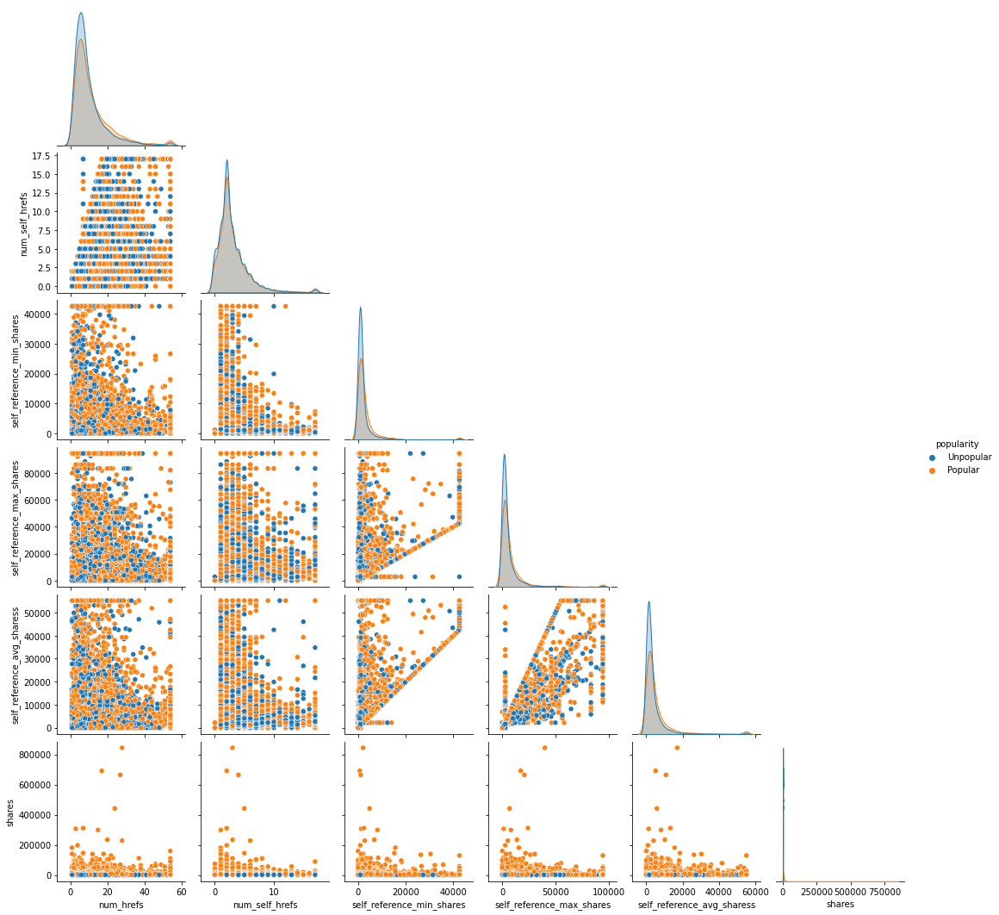

In [58]:
plot_cols_3=  ['num_hrefs',
                      'num_self_hrefs',
                      'self_reference_min_shares',
                      'self_reference_max_shares',
                      'self_reference_avg_sharess','shares','popularity']


sns.pairplot(eda_data[plot_cols_3],corner=True,hue='popularity',diag_kind='kde')

plt.show()

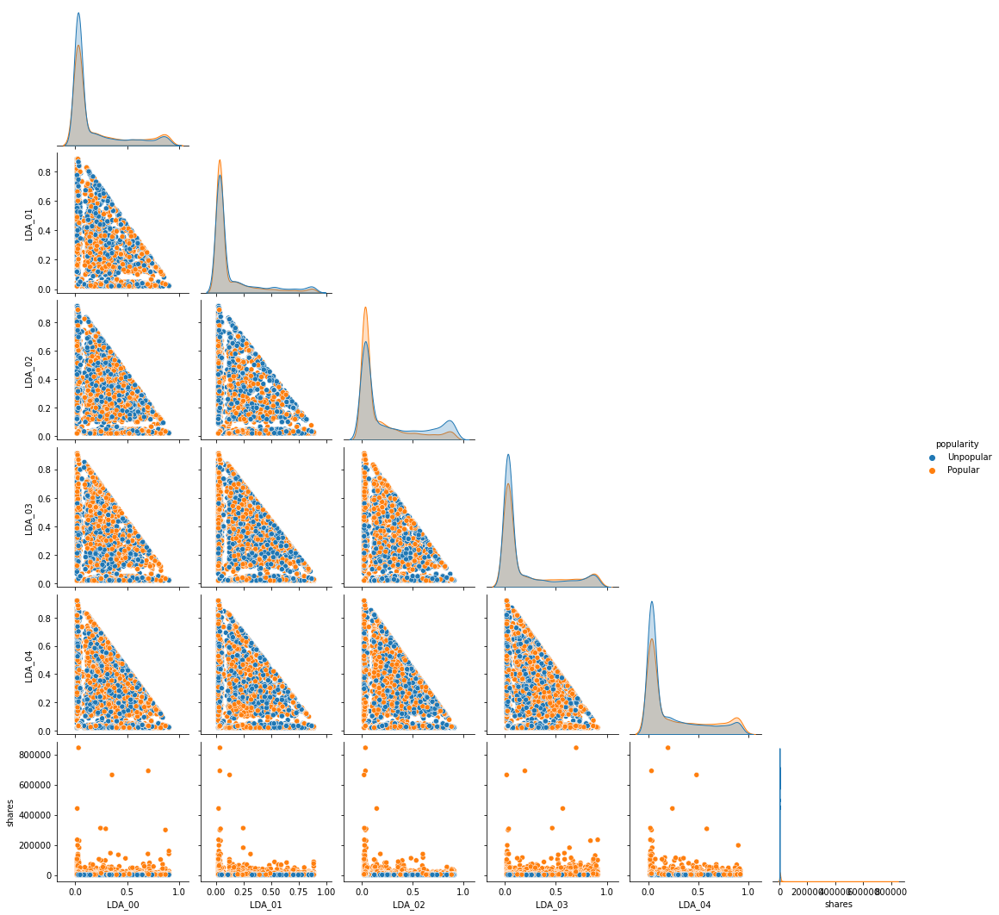

In [59]:
plot_cols_4=  ['LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04','shares','popularity']


sns.pairplot(eda_data[plot_cols_4],corner=True,hue='popularity',diag_kind='kde')

plt.show()

- there is no clear trend betwee LDA values and the number of shares

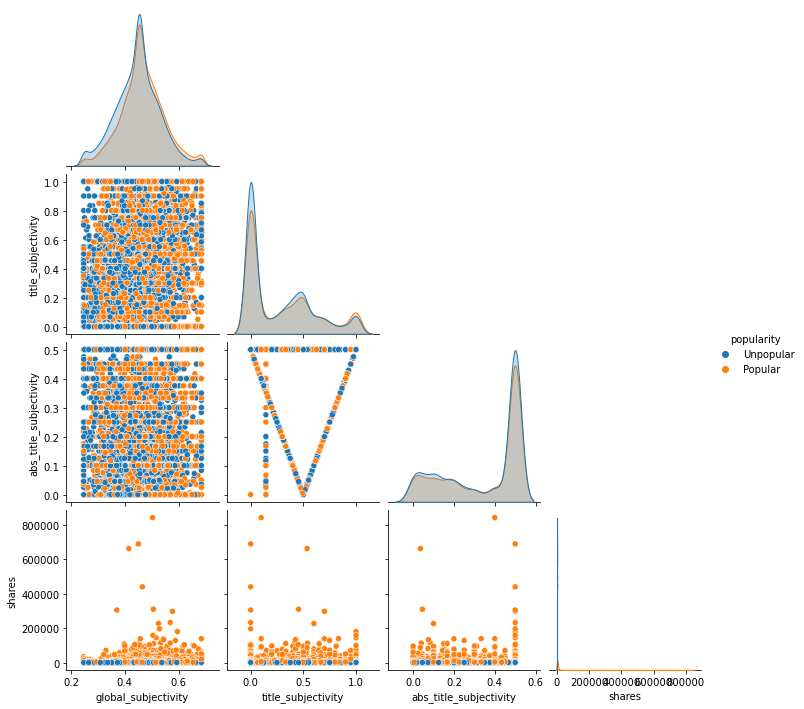

In [60]:
plot_cols_5=  ['global_subjectivity', 'title_subjectivity', 'abs_title_subjectivity','shares','popularity']


sns.pairplot(eda_data[plot_cols_5],corner=True,hue='popularity',diag_kind='kde')

plt.show()

- there seems to be a weird relation betwen title subjectivity and abs title subjectivity where the data is concentrated at a abs_title_subjectivity value of 0.5

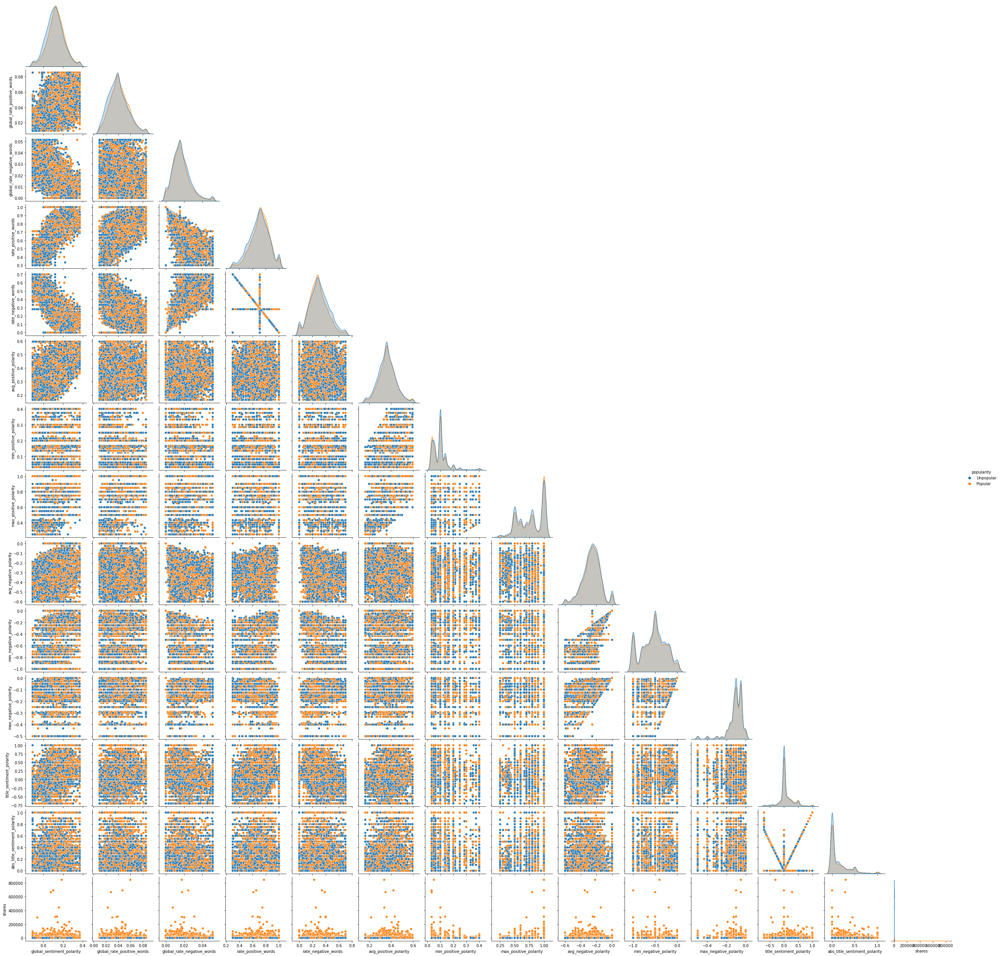

In [61]:
plot_cols_6=  ['global_sentiment_polarity', 'global_rate_positive_words',
                      'global_rate_negative_words', 'rate_positive_words',
                      'rate_negative_words', 'avg_positive_polarity',
                      'min_positive_polarity', 'max_positive_polarity',
                      'avg_negative_polarity', 'min_negative_polarity',
                      'max_negative_polarity', 'title_sentiment_polarity',
                      'abs_title_sentiment_polarity','shares','popularity']


sns.pairplot(eda_data[plot_cols_6],corner=True,hue='popularity',diag_kind='kde')

plt.show()

- From the above pairs plots we can observe a positive correlation among the variables athe top left corner of pair plot

In [62]:
# Merging the weekdays columns channels as one single column
publishdayMerge=eda_data[['weekday_is_monday','weekday_is_tuesday','weekday_is_wednesday', 
                      'weekday_is_thursday', 'weekday_is_friday','weekday_is_saturday' ,'weekday_is_sunday' ]]

In [63]:
temp_arr=[]
for r in list(range(publishdayMerge.shape[0])):
    day = 'missing'
    for c in list(range(publishdayMerge.shape[1])):
        if ((c==0) and (publishdayMerge.iloc[r,c])==1):
            day ='Monday'
        elif ((c==1) and (publishdayMerge.iloc[r,c])==1):
            day= 'Tuesday'
        elif ((c==2) and (publishdayMerge.iloc[r,c])==1):
            day = 'Wednesday'
        elif ((c==3) and (publishdayMerge.iloc[r,c])==1):
            day = 'Thursday'
        elif ((c==4) and (publishdayMerge.iloc[r,c])==1):
            day = 'Friday'
        elif ((c==5) and (publishdayMerge.iloc[r,c])==1):
            day = 'Saturday' 
        elif ((c==6) and (publishdayMerge.iloc[r,c])==1):
            day = 'Sunday'
    
 
    temp_arr.append(day)

In [64]:
temp_arr

['Thursday',
 'Saturday',
 'missing',
 'Wednesday',
 'Wednesday',
 'Wednesday',
 'Saturday',
 'Saturday',
 'Sunday',
 'Tuesday',
 'Wednesday',
 'Wednesday',
 'Thursday',
 'Sunday',
 'Wednesday',
 'Monday',
 'Tuesday',
 'Saturday',
 'Sunday',
 'Friday',
 'Wednesday',
 'Monday',
 'Tuesday',
 'Monday',
 'Wednesday',
 'Thursday',
 'Wednesday',
 'Sunday',
 'Wednesday',
 'Monday',
 'Wednesday',
 'Tuesday',
 'Monday',
 'Thursday',
 'Monday',
 'Monday',
 'Monday',
 'Friday',
 'Friday',
 'Tuesday',
 'Monday',
 'Sunday',
 'Monday',
 'Saturday',
 'Tuesday',
 'Sunday',
 'Thursday',
 'Tuesday',
 'Sunday',
 'Monday',
 'Wednesday',
 'Tuesday',
 'Tuesday',
 'Tuesday',
 'Friday',
 'Sunday',
 'Tuesday',
 'Friday',
 'Wednesday',
 'Friday',
 'Tuesday',
 'Saturday',
 'Tuesday',
 'Monday',
 'Tuesday',
 'Thursday',
 'Thursday',
 'Wednesday',
 'Thursday',
 'Wednesday',
 'Wednesday',
 'Tuesday',
 'Saturday',
 'Tuesday',
 'Sunday',
 'Tuesday',
 'Monday',
 'Monday',
 'Tuesday',
 'Wednesday',
 'Wednesday',
 'Mond

In [65]:
eda_data["merged_week_days"]=temp_arr

In [66]:
# Merging the weekdays columns channels as one single column
channelMerge=eda_data[['data_channel_is_lifestyle', 'data_channel_is_entertainment', 
                    'data_channel_is_bus', 'data_channel_is_socmed', 
                    'data_channel_is_tech', 'data_channel_is_world']]

In [67]:
temp_arr_1=[]
for r in list(range(channelMerge.shape[0])):
    channel = 'missing'
    for c in list(range(channelMerge.shape[1])):
        if ((c==0) and (channelMerge.iloc[r,c])==1):
            channel ='lifestyle'
        elif ((c==1) and (channelMerge.iloc[r,c])==1):
            channel= 'entertainment'
        elif ((c==2) and (channelMerge.iloc[r,c])==1):
            channel = 'bus'
        elif ((c==3) and (channelMerge.iloc[r,c])==1):
            channel = 'socmed'
        elif ((c==4) and (channelMerge.iloc[r,c])==1):
            channel = 'tech'
        elif ((c==5) and (channelMerge.iloc[r,c])==1):
            channel = 'world' 
  
    temp_arr_1.append(channel)

In [68]:
eda_data["merged_channel"]=temp_arr_1

### Univariate Categorical Analysis

In [69]:
def barPerc(df,xVar,ax):
    '''
    barPerc(): Add percentage for hues to bar plots
    args:
        df: pandas dataframe
        xVar: (string) X variable 
        ax: Axes object (for Seaborn Countplot/Bar plot or
                         pandas bar plot)
    '''
    # 1. how many X categories
    ##   check for NaN and remove
    numX=len([x for x in df[xVar].unique() if x==x])

    # 2. The bars are created in hue order, organize them
    bars = ax.patches
    ## 2a. For each X variable
    for ind in range(numX):
        ## 2b. Get every hue bar
        ##     ex. 8 X categories, 4 hues =>
        ##    [0, 8, 16, 24] are hue bars for 1st X category
        hueBars=bars[ind:][::numX]
        ## 2c. Get the total height (for percentages)
        total = sum([x.get_height() for x in hueBars])

        # 3. Print the percentage on the bars
        for bar in hueBars:
            ax.text(bar.get_x() + bar.get_width()/2.,
                    bar.get_height(),
                    f'{bar.get_height()/total:.0%}',
                    ha="center",va="bottom")

In [70]:
def percentage(col,target):
    chk = eda_data.loc[:,[col,target]]
    chk[target] = chk[target].replace({'Popular': 1, "Unpopular": 0})
    rate = round(chk.groupby(col)[target].mean()*100,2)
    rate.sort_index()
    return rate

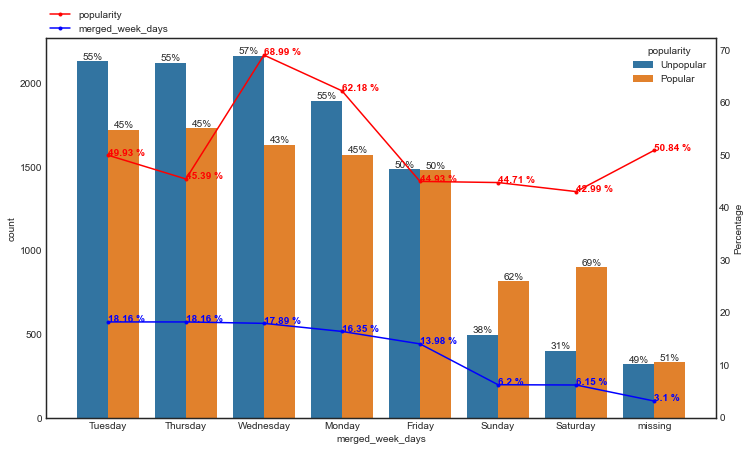

In [71]:
column = "merged_week_days"
plt.style.use('seaborn-white')
plt.figure(figsize=[12,7])
ax1=sns.countplot(column,hue='popularity',data=eda_data,  order = eda_data[column].value_counts().index)
barPerc(eda_data,column,ax1)
ax2 = ax1.twinx()
attr_rate =percentage(column,'popularity')
attr_rate.plot.line(style='.-', color='red', ax=ax2)
for index,data in enumerate(attr_rate.values):
    plt.text(x=index , y =data ,  color='red', fontweight='bold', s=f"{data} %" )

prop = round(eda_data[column].value_counts(normalize=True)*100,2)
prop.sort_index()
prop.plot.line(style='.-', color='blue', ax=ax2)
for index,data in enumerate(prop.values):
    plt.text(x=index , y =data ,  color='blue', fontweight='bold', s=f"{data} %" )
#ax1.legend(loc=[1,1])
ax2.legend(loc=[0,1])
ax2.set_ylabel("Percentage")
ax2.grid(False)


- Surprisingly, during the weekend articles do not receive much popularity, however the articles generally tend to be popular if published during weekends

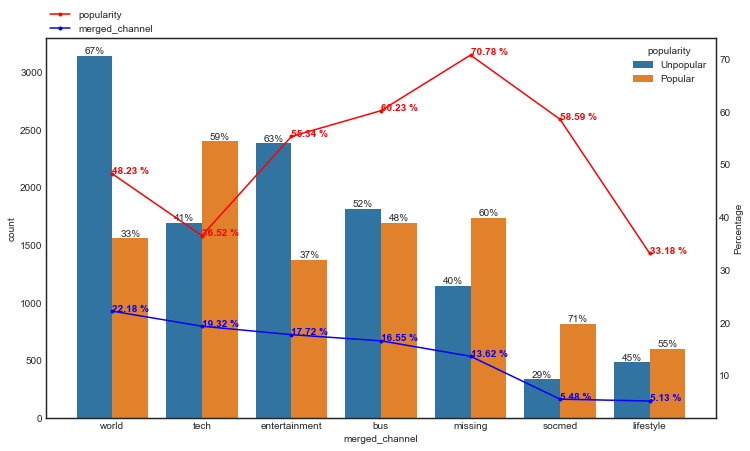

In [72]:
column = "merged_channel"
plt.style.use('seaborn-white')
plt.figure(figsize=[12,7])
ax1=sns.countplot(column,hue='popularity',data=eda_data,  order = eda_data[column].value_counts().index)
barPerc(eda_data,column,ax1)
ax2 = ax1.twinx()
attr_rate =percentage(column,'popularity')
attr_rate.plot.line(style='.-', color='red', ax=ax2)
for index,data in enumerate(attr_rate.values):
    plt.text(x=index , y =data ,  color='red', fontweight='bold', s=f"{data} %" )

prop = round(eda_data[column].value_counts(normalize=True)*100,2)
prop.sort_index()
prop.plot.line(style='.-', color='blue', ax=ax2)
for index,data in enumerate(prop.values):
    plt.text(x=index , y =data ,  color='blue', fontweight='bold', s=f"{data} %" )
#ax1.legend(loc=[1,1])
ax2.legend(loc=[0,1])
ax2.set_ylabel("Percentage")
ax2.grid(False)

- The articles belonging to socmed and lifestyle are low in number compared to other channels. 

<AxesSubplot:>

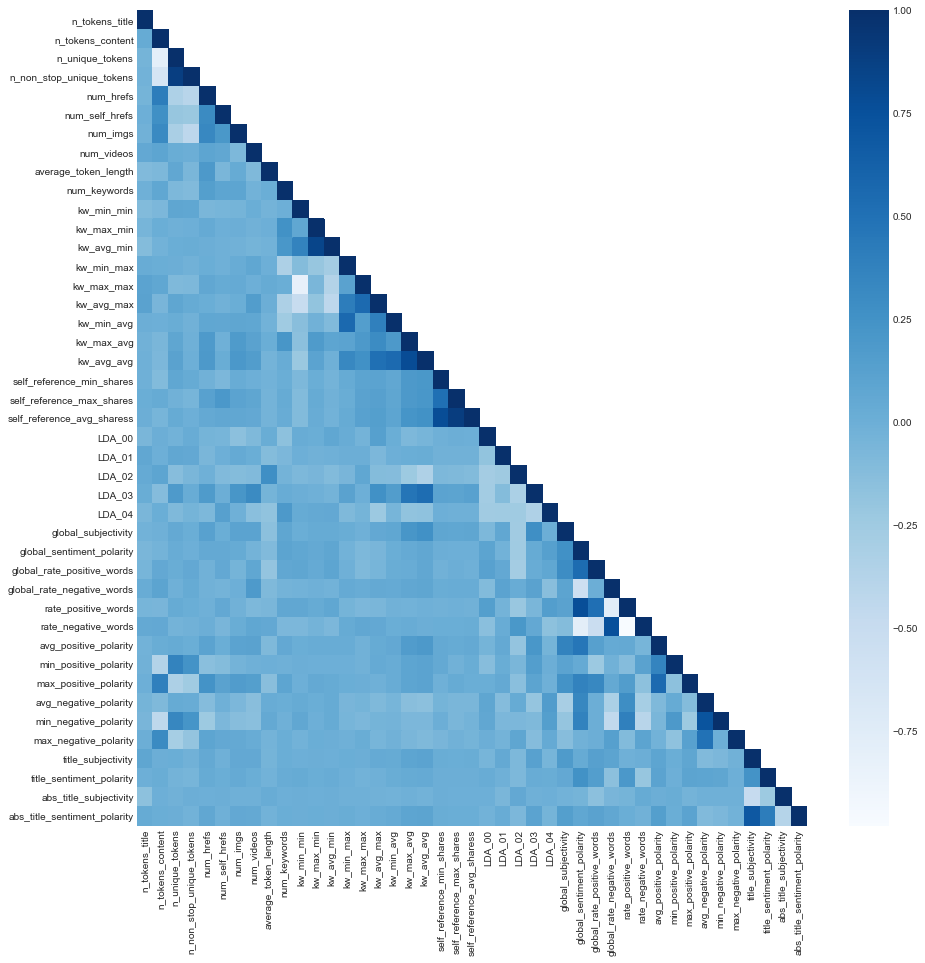

In [73]:
cor=eda_data[numeric_columns].corr()
#sns.heatmap(cor)
plt.figure(figsize=(15,15))
df_lt = cor.where(np.tril(np.ones(cor.shape)).astype(np.bool))
sns.heatmap(df_lt,cmap='Blues')

In [74]:
import numpy as np

# Create correlation matrix
corr_matrix = eda_data[numeric_columns].corr().abs() #creates 160*160 matrix by coverting -ve correlations to +ve values
#print(corr_matrix)
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

print(to_drop)
# Drop features 
#df.drop(to_drop, axis=1, inplace=True)

['rate_negative_words']


In [75]:
X_train_out_removed.drop(to_drop, axis=1, inplace=True)

In [76]:
X_train_out_removed.shape

(21181, 55)

# Step 4: Scaling Train Data

In [77]:
pt = PowerTransformer(method='yeo-johnson', standardize=True,) 

In [78]:
final_columns = list(X_train_out_removed.columns)
scale_num_cols= [col for col in final_columns if col in numeric_columns]
print(scale_num_cols)

['n_tokens_title', 'n_tokens_content', 'n_unique_tokens', 'n_non_stop_unique_tokens', 'num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length', 'num_keywords', 'kw_min_min', 'kw_max_min', 'kw_avg_min', 'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg', 'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares', 'self_reference_avg_sharess', 'LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity', 'global_sentiment_polarity', 'global_rate_positive_words', 'global_rate_negative_words', 'rate_positive_words', 'avg_positive_polarity', 'min_positive_polarity', 'max_positive_polarity', 'avg_negative_polarity', 'min_negative_polarity', 'max_negative_polarity', 'title_subjectivity', 'title_sentiment_polarity', 'abs_title_subjectivity', 'abs_title_sentiment_polarity']


No handles with labels found to put in legend.


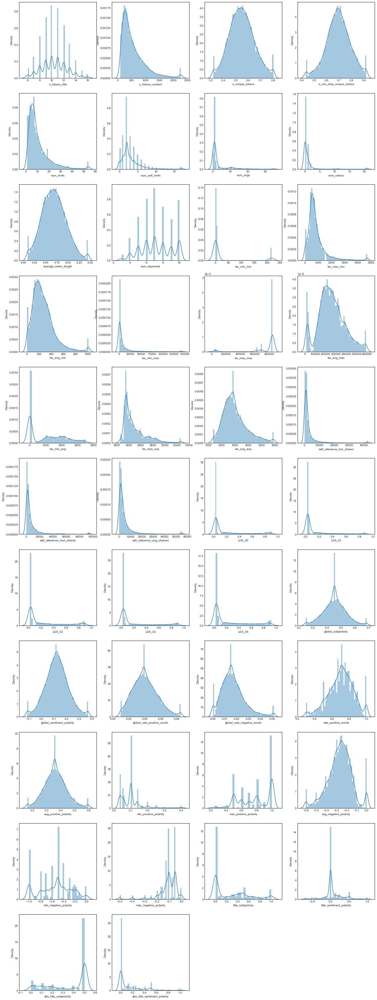

In [79]:
plt.figure(figsize=(22,80))
for i in (enumerate(scale_num_cols)): ## i is tuple which has key and column name pairs
    plt.subplot(len(scale_num_cols)//4 + 4,4,i[0]+1)
    sns.distplot(X_train_out_removed[i[1]],hist=True)

plt.legend()
plt.show()  

In [80]:
X_train_out_scaled=X_train_out_removed.copy()

In [81]:
X_train_out_scaled[scale_num_cols] = pt.fit_transform(X_train_out_removed[scale_num_cols])                 

No handles with labels found to put in legend.


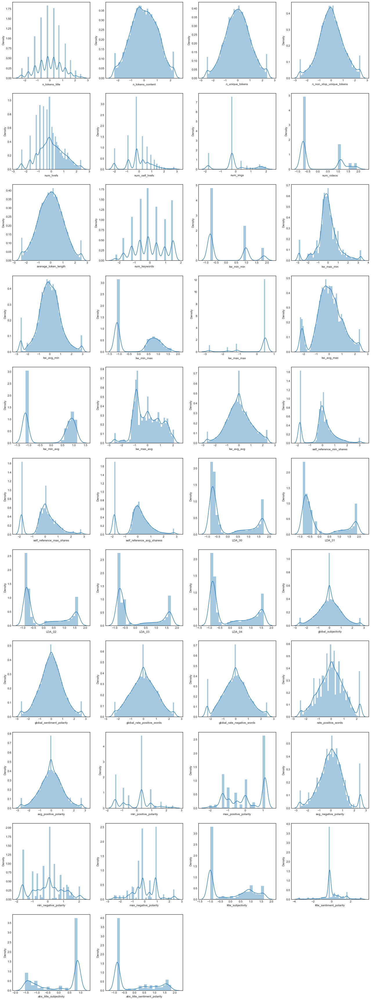

In [82]:
plt.figure(figsize=(22,80))
for i in (enumerate(scale_num_cols)): ## i is tuple which has key and column name pairs
    plt.subplot(len(scale_num_cols)//4 + 4,4,i[0]+1)
    sns.distplot(X_train_out_scaled[i[1]],hist=True)

plt.legend()
plt.show()  

<AxesSubplot:ylabel='Density'>

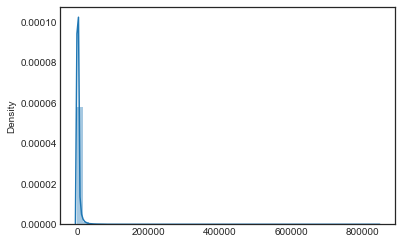

In [83]:
sns.distplot(y_train,hist=True)

<AxesSubplot:ylabel='Density'>

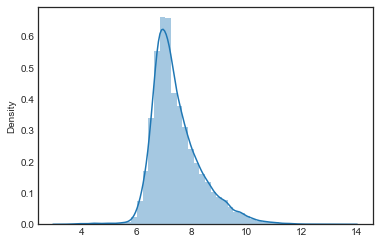

In [84]:
sns.distplot(np.log(y_train),hist=True)

In [85]:
y_train_scaled=np.log(y_train)

In [86]:
yt= PowerTransformer(method='yeo-johnson', standardize=True,) 

In [87]:
y_train_scaled_new= yt.fit_transform(y_train)   

<AxesSubplot:ylabel='Density'>

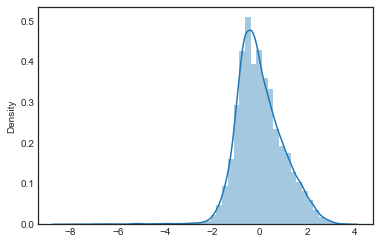

In [88]:
sns.distplot(y_train_scaled_new,hist=True)

# Step 5: Building Regression models on Train Data

### Feature selection

### Method 1:

In [89]:
from sklearn.feature_selection import RFE,RFECV
from sklearn.linear_model import LinearRegression

In [90]:
#Create a linear regression estimator 

linreg = LinearRegression()

#Use RFECV to pick best features, using Stratified Kfold
rfecv =   RFECV(linreg, cv=5, scoring='neg_mean_squared_error',verbose = 1,n_jobs=-1)

In [91]:

selector = rfecv.fit(X_train_out_scaled, y_train_scaled)
selector.support_

Fitting estimator with 55 features.
Fitting estimator with 54 features.
Fitting estimator with 53 features.
Fitting estimator with 52 features.
Fitting estimator with 51 features.
Fitting estimator with 50 features.
Fitting estimator with 49 features.
Fitting estimator with 48 features.
Fitting estimator with 47 features.
Fitting estimator with 46 features.
Fitting estimator with 45 features.
Fitting estimator with 44 features.
Fitting estimator with 43 features.
Fitting estimator with 42 features.


array([False,  True,  True,  True,  True,  True, False,  True, False,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True, False, False, False, False,
       False,  True, False,  True, False, False,  True,  True,  True,
       False])

In [92]:
selector.ranking_

array([11,  1,  1,  1,  1,  1,  2,  1,  3,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, 12,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1, 13,  1,  4,  6,  7,  5, 15,  1, 10,  1, 14,  9,
        1,  1,  1,  8])

In [93]:
list(zip(X_train_out_scaled.columns,selector.support_,selector.ranking_))

[('n_tokens_title', False, 11),
 ('n_tokens_content', True, 1),
 ('n_unique_tokens', True, 1),
 ('n_non_stop_unique_tokens', True, 1),
 ('num_hrefs', True, 1),
 ('num_self_hrefs', True, 1),
 ('num_imgs', False, 2),
 ('num_videos', True, 1),
 ('average_token_length', False, 3),
 ('num_keywords', True, 1),
 ('data_channel_is_lifestyle', True, 1),
 ('data_channel_is_entertainment', True, 1),
 ('data_channel_is_bus', True, 1),
 ('data_channel_is_socmed', True, 1),
 ('data_channel_is_tech', True, 1),
 ('data_channel_is_world', True, 1),
 ('kw_min_min', True, 1),
 ('kw_max_min', True, 1),
 ('kw_avg_min', True, 1),
 ('kw_min_max', True, 1),
 ('kw_max_max', True, 1),
 ('kw_avg_max', True, 1),
 ('kw_min_avg', True, 1),
 ('kw_max_avg', True, 1),
 ('kw_avg_avg', True, 1),
 ('self_reference_min_shares', True, 1),
 ('self_reference_max_shares', True, 1),
 ('self_reference_avg_sharess', True, 1),
 ('weekday_is_monday', False, 12),
 ('weekday_is_tuesday', True, 1),
 ('weekday_is_wednesday', True, 1),

In [94]:
print("Optimal number of features from RFECV :")
print(selector.n_features_)

Optimal number of features from RFECV :
41


### Method 2: Feature selection  using RFE cross val

In [95]:
cv_scores =[]
total_cols = len(X_train_out_scaled.columns)

In [96]:
for features in range(10,60,10):
    rfe = RFE(linreg, features)
    scores = cross_val_score(rfe, X_train_out_scaled, y_train_scaled,cv= 5) # consists of array of 5 values for 5 folds at each iteration
    cv_scores.append(scores)

In [97]:
cv_scores

[array([0.115309  , 0.1236929 , 0.09410054, 0.13154571, 0.11149958]),
 array([0.13017123, 0.13816172, 0.11241651, 0.14270851, 0.12685672]),
 array([0.13272126, 0.14381266, 0.11240642, 0.14641954, 0.13514515]),
 array([0.1355191 , 0.14630251, 0.11532368, 0.14972645, 0.13538602]),
 array([0.135324  , 0.14730729, 0.11596663, 0.14965223, 0.13448886])]

In [98]:
mean_cv_score =[]
for score in cv_scores:
    mean_cv_score.append(score.mean())

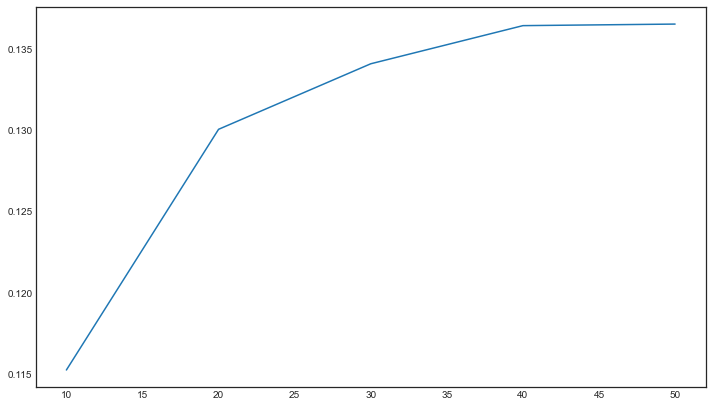

In [99]:
plt.figure(figsize=[12,7])
plt.plot(np.array(range(10,60,10)),mean_cv_score)

### Method 3: Feature Importance using DecisionTreeClassifier, RandomForestClassifier

<AxesSubplot:>

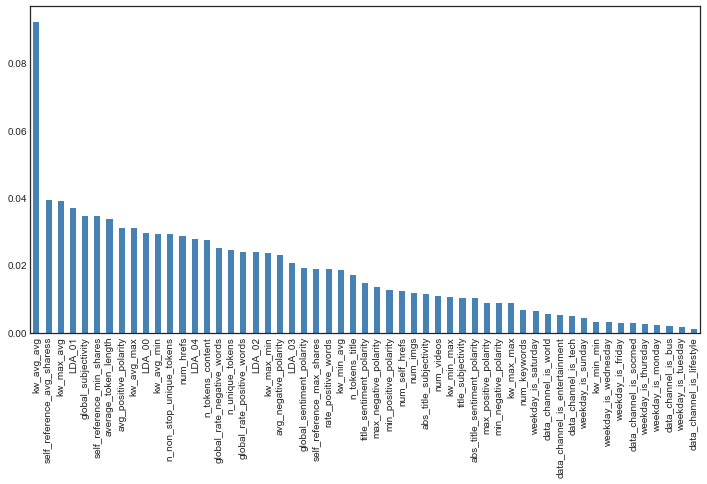

In [100]:
from sklearn.tree import DecisionTreeRegressor
reg = DecisionTreeRegressor()
reg.fit(X_train_out_scaled, y_train_scaled)

feat_imp = pd.Series(reg.feature_importances_, index=X_train_out_scaled.columns).sort_values(ascending=False)

feat_imp.plot.bar(color='steelblue', figsize=(12, 6))

<AxesSubplot:>

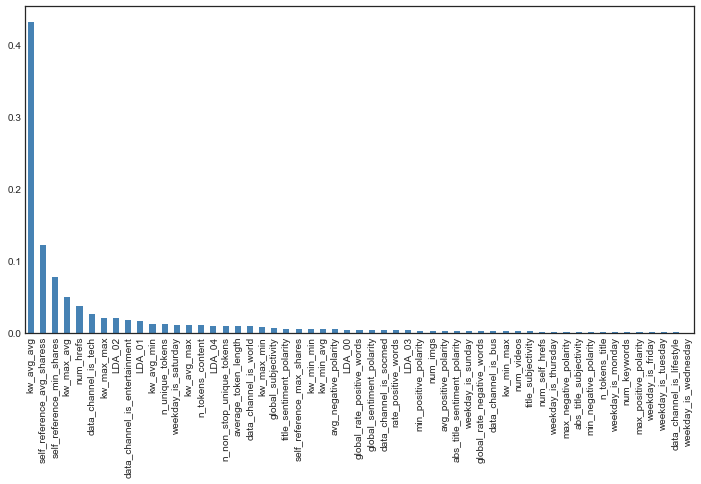

In [101]:
rand_reg = RandomForestRegressor(n_estimators = 100, max_depth=5)
rand_reg.fit(X_train_out_scaled, y_train_scaled)

rand_feat_imp = pd.Series(rand_reg.feature_importances_, index=X_train_out_scaled.columns).sort_values(ascending=False)

rand_feat_imp.plot.bar(color='steelblue', figsize=(12, 6))

### Final Feature selection for our model

In [102]:
final_number_features = 30
rfe = RFE(linreg, final_number_features)
rfe.fit(X_train_out_scaled, y_train_scaled_new)

RFE(estimator=LinearRegression(), n_features_to_select=30)

In [103]:
rfe.support_

array([False,  True,  True, False,  True,  True, False,  True, False,
       False,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
       False, False, False, False,  True, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False])

In [104]:
final_cols = list(X_train_out_scaled.columns[rfe.support_])
print(final_cols)

['n_tokens_content', 'n_unique_tokens', 'num_hrefs', 'num_self_hrefs', 'num_videos', 'data_channel_is_lifestyle', 'data_channel_is_entertainment', 'data_channel_is_socmed', 'data_channel_is_tech', 'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min', 'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares', 'self_reference_avg_sharess', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'LDA_00', 'global_subjectivity', 'min_positive_polarity']


In [105]:
import statsmodels.api as sm

In [106]:
X_train_col=X_train_out_scaled[final_cols]

In [107]:
vif = pd.DataFrame()
X = X_train_col
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif 

,Features,VIF
20,self_reference_avg_sharess,24.46
13,kw_min_max,23.96
16,kw_min_avg,22.93
19,self_reference_max_shares,14.14
12,kw_avg_min,8.52
11,kw_max_min,6.70
0,n_tokens_content,6.12
18,self_reference_min_shares,6.08
1,n_unique_tokens,5.12
15,kw_avg_max,3.00


In [108]:
X_train_col.drop('self_reference_avg_sharess',axis=1, inplace=True)
vif = pd.DataFrame()
X = X_train_col
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif 

,Features,VIF
13,kw_min_max,23.96
16,kw_min_avg,22.92
12,kw_avg_min,8.52
11,kw_max_min,6.70
0,n_tokens_content,6.12
1,n_unique_tokens,5.12
19,self_reference_max_shares,3.33
15,kw_avg_max,3.00
18,self_reference_min_shares,2.73
14,kw_max_max,2.67


In [109]:
X_train_col.drop('kw_min_max',axis=1, inplace=True)
vif = pd.DataFrame()
X = X_train_col
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,kw_avg_min,8.48
11,kw_max_min,6.66
0,n_tokens_content,6.12
1,n_unique_tokens,5.12
18,self_reference_max_shares,3.33
14,kw_avg_max,2.98
17,self_reference_min_shares,2.73
13,kw_max_max,2.66
16,kw_avg_avg,2.42
9,data_channel_is_world,2.20


In [110]:
X_train_col.drop('kw_avg_min',axis=1, inplace=True)
vif = pd.DataFrame()
X = X_train_col
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,n_tokens_content,6.11
1,n_unique_tokens,5.12
17,self_reference_max_shares,3.33
13,kw_avg_max,2.79
16,self_reference_min_shares,2.73
15,kw_avg_avg,2.41
12,kw_max_max,2.40
9,data_channel_is_world,2.19
10,kw_min_min,2.04
8,data_channel_is_tech,1.74


In [111]:
X_train_col.drop('n_tokens_content',axis=1, inplace=True)
vif = pd.DataFrame()
X = X_train_col
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
16,self_reference_max_shares,3.32
12,kw_avg_max,2.79
15,self_reference_min_shares,2.69
11,kw_max_max,2.40
14,kw_avg_avg,2.40
8,data_channel_is_world,2.17
9,kw_min_min,2.04
7,data_channel_is_tech,1.74
2,num_self_hrefs,1.62
5,data_channel_is_entertainment,1.57


In [112]:
# selecting columns only which are 'True' in rfecv.support_ i.e True columns were selected for creating a model


X_train_1=sm.add_constant(X_train_col)    # Adding constant
X_train_1.shape

(21181, 27)

### Model 1

In [113]:
lm_1 = sm.OLS(y_train_scaled,X_train_1).fit()
print(lm_1.summary())

                            OLS Regression Results                            
Dep. Variable:                 shares   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.136
Method:                 Least Squares   F-statistic:                     129.2
Date:                Mon, 09 Aug 2021   Prob (F-statistic):               0.00
Time:                        22:04:18   Log-Likelihood:                -26641.
No. Observations:               21181   AIC:                         5.334e+04
Df Residuals:                   21154   BIC:                         5.355e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [114]:
#Removing kw_max_min and building model
X_train_2=X_train_1.drop('kw_max_min', axis=1)   

### Model 2

In [115]:
lm_2 = sm.OLS(y_train_scaled,X_train_2).fit()
print(lm_2.summary())

                            OLS Regression Results                            
Dep. Variable:                 shares   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.136
Method:                 Least Squares   F-statistic:                     134.2
Date:                Mon, 09 Aug 2021   Prob (F-statistic):               0.00
Time:                        22:04:18   Log-Likelihood:                -26642.
No. Observations:               21181   AIC:                         5.334e+04
Df Residuals:                   21155   BIC:                         5.354e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [116]:
#Removing kw_max_min and building model
X_train_3=X_train_2.drop('kw_min_min', axis=1)   

### Model 3

In [117]:
lm_3 = sm.OLS(y_train_scaled,X_train_3).fit()
print(lm_3.summary())

                            OLS Regression Results                            
Dep. Variable:                 shares   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.136
Method:                 Least Squares   F-statistic:                     139.6
Date:                Mon, 09 Aug 2021   Prob (F-statistic):               0.00
Time:                        22:04:19   Log-Likelihood:                -26644.
No. Observations:               21181   AIC:                         5.334e+04
Df Residuals:                   21156   BIC:                         5.354e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const         

In [118]:
#Predict values
y_train_pred_scaled = lm_3.predict(X_train_3)

In [119]:
y_train_scaled_arr = y_train_scaled.values.ravel()
print(y_train_scaled_arr.shape)

(21181,)


In [120]:
res=y_train_scaled_arr- y_train_pred_scaled

In [121]:
res.head()

id
12722   -0.636178
19161    1.384146
17705   -0.054496
3394     0.048496
1416    -0.229519
dtype: float64

Text(0, 0.5, 'residual')

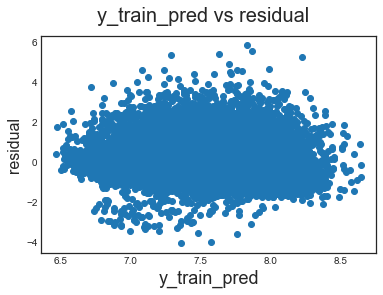

In [122]:
#CHECKING PREDICTED V/s RESIDUAL to check non linearity

fig = plt.figure()
plt.scatter(y_train_pred_scaled,res)
fig.suptitle('y_train_pred vs residual', fontsize=20)              # Plot heading 
plt.xlabel('y_train_pred', fontsize=18)                          # X-label
plt.ylabel('residual', fontsize=16) 

Text(0.5, 0, 'Errors')

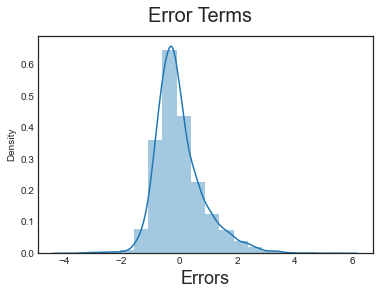

In [123]:
#Checking ASSUMPTION OF NORMALITY:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((res), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

### Q-Q Plot for errors 

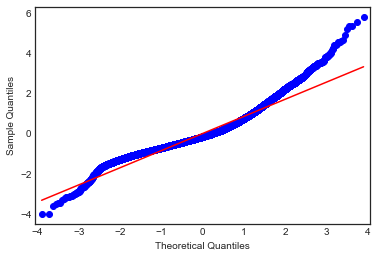

In [124]:
sm.qqplot(res,line='s')
plt.show()

In [125]:
residual_results=pd.DataFrame()

In [126]:
residual_results['Actual'] =y_train_scaled
residual_results['predicted'] = y_train_pred_scaled.values
residual_results['residual'] = residual_results['Actual'] - residual_results['predicted']
residual_results['shares']=y_train.values
residual_results['predicted_shares'] = np.exp(y_train_pred_scaled)

In [127]:
residual_results.head()

,Actual,predicted,residual,shares,predicted_shares
id,,,,,
12722,6.565265,7.201443,-0.636178,710,1341.364428
19161,9.717158,8.333012,1.384146,16600,4158.927173
17705,7.170120,7.224616,-0.054496,1300,1372.810953
3394,7.377759,7.329263,0.048496,1600,1524.258394
1416,7.170120,7.399638,-0.229519,1300,1635.392571


In [128]:
def regression_results(y_true, y_pred):

    # Regression metrics
    explained_variance=metrics.explained_variance_score(y_true, y_pred)
    mean_absolute_error=metrics.mean_absolute_error(y_true, y_pred) 
    mse=metrics.mean_squared_error(y_true, y_pred) 
    median_absolute_error=metrics.median_absolute_error(y_true, y_pred)
    r2=metrics.r2_score(y_true, y_pred)

    print('explained_variance: ', round(explained_variance,4))    
    print('r2: ', round(r2,4))
    print('MAE: ', round(mean_absolute_error,4))
    print('MSE: ', round(mse,4))
    print('RMSE: ', round(np.sqrt(mse),4))

In [129]:
regression_results(residual_results['shares'].values, residual_results['predicted_shares'].values)

explained_variance:  0.0109
r2:  -0.0033
MAE:  2298.3065
MSE:  150712461.5449
RMSE:  12276.5004


In [130]:
regression_results(residual_results['Actual'].values, residual_results['predicted'].values)

explained_variance:  0.1367
r2:  0.1367
MAE:  0.6296
MSE:  0.7247
RMSE:  0.8513


## Polynomial Regression

In [131]:
X_train_scaled_polynomial = X_train_out_scaled.copy()

In [132]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures

In [133]:
poly = PolynomialFeatures(2)
X_train_scaled_polynomial= poly.fit_transform(X_train_scaled_polynomial)
X_train_scaled_polynomial = pd.DataFrame(X_train_scaled_polynomial, columns = poly.get_feature_names(X_train_out_scaled.columns))

In [134]:
X_train_scaled_polynomial.head()

1  n_tokens_title  n_tokens_content  n_unique_tokens  \
0  1.0        0.307897          0.020769        -0.062047   
1  1.0       -0.168516         -0.575903         0.758840   
2  1.0        0.307897          0.407734         0.331729   
3  1.0        0.769500         -0.864764         0.586377   
4  1.0       -1.173807          0.441444        -0.080872   

   n_non_stop_unique_tokens  num_hrefs  num_self_hrefs  num_imgs  num_videos  \
0                 -0.473910   0.649921        0.960167 -0.240848    1.120768   
1                 -0.058632   0.831712        0.655137  1.537045   -0.726237   
2                  0.615030   0.913282       -2.015196 -0.240848   -0.726237   
3                  1.148686  -0.854991       -0.196743 -0.240848   -0.726237   
4                 -0.024445   0.027026        0.282513  1.583690   -0.726237   

   average_token_length  num_keywords  data_channel_is_lifestyle  \
0             -0.805169     -1.176221                        0.0   
1             -1.216139     -0.115924                        0.0   
2              0.652208      0.417042                        0.0   
3              0.079315     -0.647095                        0.0   
4             -0.626901     -0.115924                        0.0   

   data_channel_is_entertainment  data_channel_is_bus  data_channel_is_socmed  \
0                            1.0                  0.0                     0.0   
1                            0.0                  0.0                     0.0   
2                            0.0                  1.0                     0.0   
3                            0.0                  0.0                     0.0   
4                            0.0                  0.0                     0.0   

   data_channel_is_tech  data_channel_is_world  kw_min_min  kw_max_min  \
0                   0.0                    0.0   -0.784377   -0.252762   
1                   0.0                    0.0   -0.784377   -0.015855   
2                   0.0                    0.0    0.963845   -0.786123   
3                   1.0                    0.0   -0.784377   -0.248835   
4                   0.0                    1.0    0.963845   -0.651385   

   kw_avg_min  kw_min_max  kw_max_max  kw_avg_max  kw_min_avg  kw_max_avg  \
0   -0.758940    1.142535    0.487045    0.485251    0.905619   -0.928371   
1    0.420356    0.731342    0.487045    0.644647    0.809485    1.620547   
2   -0.697445   -1.105235    0.487045    0.568079   -1.137762    0.071097   
3   -0.573450   -1.105235    0.487045    0.391158   -1.137762   -0.028334   
4   -0.796555   -1.105235    0.487045   -0.681603   -1.137762   -0.759846   

   kw_avg_avg  self_reference_min_shares  self_reference_max_shares  \
0   -0.063429                   0.081395                   1.286707   
1    2.005814                   1.814249                   1.673839   
2   -0.610144                  -1.807479                  -1.826629   
3   -0.317921                   0.265985                  -0.187576   
4    0.036820                   0.467289                  -0.030886   

   self_reference_avg_sharess  weekday_is_monday  weekday_is_tuesday  \
0                    0.705531                0.0                 0.0   
1                    1.817964                0.0                 0.0   
2                   -1.816353                0.0                 0.0   
3                   -0.052714                0.0                 0.0   
4                    0.127431                0.0                 0.0   

   weekday_is_wednesday  weekday_is_thursday  weekday_is_friday  \
0                   0.0                  1.0                0.0   
1                   0.0                  0.0                0.0   
2                   0.0                  0.0                0.0   
3                   1.0                  0.0                0.0   
4                   1.0                  0.0                0.0   

   weekday_is_saturday  weekday_is_sunday    LDA_00    LDA_01    LDA_02  \
0              

In [135]:
params = {'alpha': [ 0.001, 0.01]}

lasso = Lasso()

# cross validation
lasso_model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs = -1,
                        verbose = 1)            

lasso_model_cv.fit(X_train_scaled_polynomial, y_train_scaled) 

Fitting 5 folds for each of 2 candidates, totalling 10 fits


GridSearchCV(cv=5, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': [0.001, 0.01]}, return_train_score=True,
             scoring='neg_mean_absolute_error', verbose=1)

In [136]:
# Printing the best hyperparameter alpha
print(lasso_model_cv.best_params_)

{'alpha': 0.01}


In [137]:
lasso_best = lasso_model_cv.best_estimator_

In [138]:
y_train_lasso_pred = lasso_best.predict(X_train_scaled_polynomial)

In [139]:
lasso_res=y_train_scaled_arr- y_train_lasso_pred
lasso_res[:5]

array([-0.76146573,  1.40984589,  0.02357833, -0.01399858, -0.21244792])

Text(0, 0.5, 'residual')

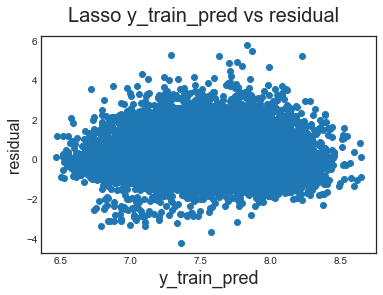

In [140]:
#CHECKING PREDICTED V/s RESIDUAL to check non linearity

fig = plt.figure()
plt.scatter(y_train_pred_scaled,lasso_res)
fig.suptitle('Lasso y_train_pred vs residual', fontsize=20)              # Plot heading 
plt.xlabel('y_train_pred', fontsize=18)                          # X-label
plt.ylabel('residual', fontsize=16) 

Text(0.5, 0, 'Errors')

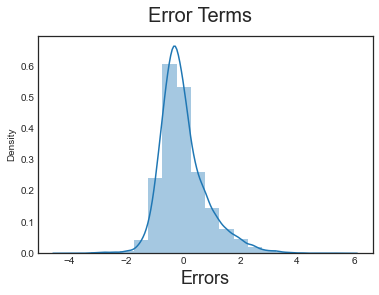

In [141]:
#Checking ASSUMPTION OF NORMALITY:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((lasso_res), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label



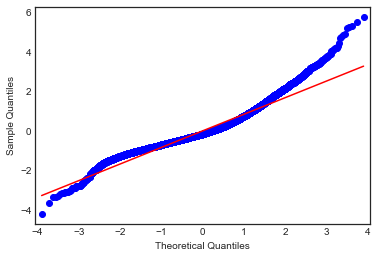

In [142]:
sm.qqplot(lasso_res,line='s')
plt.show()

In [143]:

lasso_residual_results=pd.DataFrame()
lasso_residual_results['Actual'] =y_train_scaled
lasso_residual_results['predicted'] = y_train_lasso_pred
lasso_residual_results['residual'] = residual_results['Actual'] - residual_results['predicted']
lasso_residual_results['shares']=y_train.values
lasso_residual_results['predicted_shares'] = np.exp(y_train_lasso_pred)

lasso_residual_results.head()


,Actual,predicted,residual,shares,predicted_shares
id,,,,,
12722,6.565265,7.326731,-0.636178,710,1520.402983
19161,9.717158,8.307312,1.384146,16600,4053.403127
17705,7.170120,7.146541,-0.054496,1300,1269.706703
3394,7.377759,7.391757,0.048496,1600,1622.555222
1416,7.170120,7.382567,-0.229519,1300,1607.712221


In [144]:
regression_results(lasso_residual_results['shares'].values, lasso_residual_results['predicted_shares'].values)


explained_variance:  0.0136
r2:  -0.0008
MAE:  2277.6392
MSE:  150340882.0844
RMSE:  12261.3573


In [145]:

regression_results(lasso_residual_results['Actual'].values, lasso_residual_results['predicted'].values)



explained_variance:  0.1631
r2:  0.1631
MAE:  0.6204
MSE:  0.7026
RMSE:  0.8382


Our model is not performing well on articles at tail end of the distribution. Hence we will split the dataset into different clusters and build models on top of these clusters.

## Models on Clusters

In [146]:
print(X_train_out_scaled.shape)
print(y_train_scaled.shape)


(21181, 55)
(21181, 1)


In [147]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

(21181, 2)


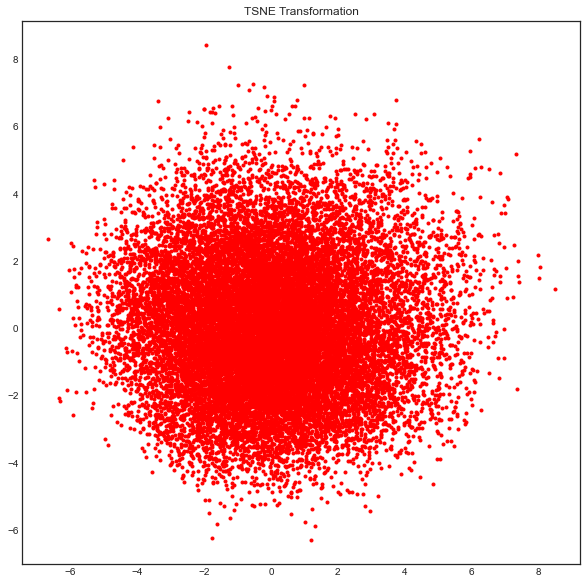

In [148]:
pca_for_clusters = PCA(n_components=2)
reduced_data = pca_for_clusters.fit_transform(X_train_out_scaled.iloc[:,:-2])
print(reduced_data.shape)

# plotting the clusters TSNE
plt.figure(figsize=(10,10))
plt.plot(reduced_data[:,0], reduced_data[:,1], 'r.')
plt.title('TSNE Transformation')
plt.show()

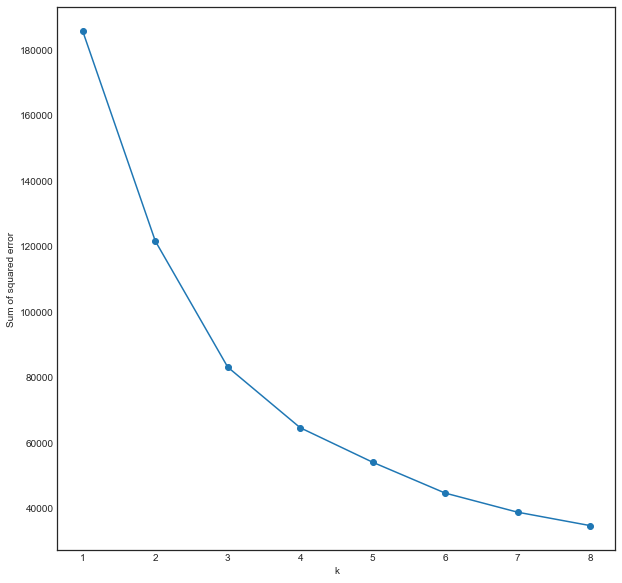

In [149]:
k=list(range(1,9))
ssd=[]
for i in k:
    kmeans=KMeans(n_clusters=i).fit(reduced_data)
    ssd.append(kmeans.inertia_)
    
plt.figure(figsize=(10,10))    
plt.plot(k,ssd,'o-')
plt.xlabel('k')
plt.ylabel('Sum of squared error')
plt.show()

In [150]:
# Predicts the clusters
kmeans=KMeans(init='k-means++',n_clusters=5)
kmeans.fit(reduced_data)
kmeans_preds=kmeans.predict(reduced_data)

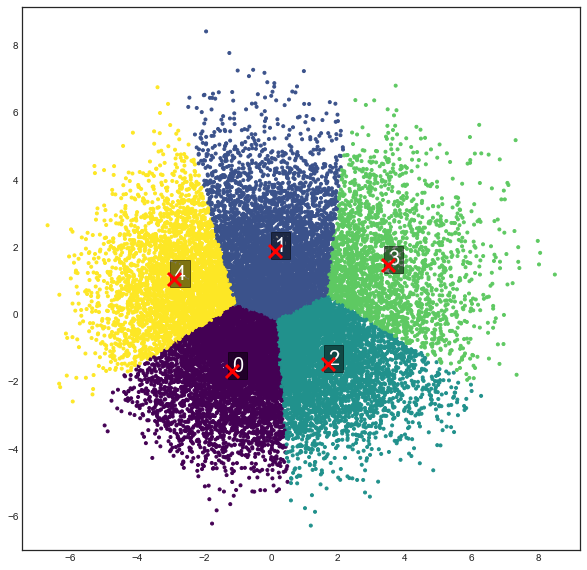

In [151]:
centroids = kmeans.cluster_centers_
clusters = np.unique(kmeans_preds)

# ploting the result of of the clusters
ax, fig = plt.subplots(figsize=(10,10))
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='r', zorder=10)

# ploting the cluster numbers
for i in range(clusters.shape[0]):
    plt.text(centroids[i, 0], centroids[i, 1], clusters[i], fontsize=20, color='white', bbox=dict(facecolor='black', alpha=0.5))
   

plt.scatter(reduced_data[:,0],reduced_data[:,1],c=kmeans_preds,cmap='viridis',marker='.')
plt.show()

In [152]:
pd.Series(kmeans_preds).value_counts()

0    5549
1    5105
2    4746
4    3510
3    2271
dtype: int64

In [153]:
from sklearn.cluster import AgglomerativeClustering

In [154]:
agg_cluster = AgglomerativeClustering(n_clusters=5)
agg_cluster_labels = agg_cluster.fit_predict(reduced_data)


In [155]:
pd.Series(agg_cluster_labels).value_counts()

0    6781
3    5262
1    3933
4    2916
2    2289
dtype: int64

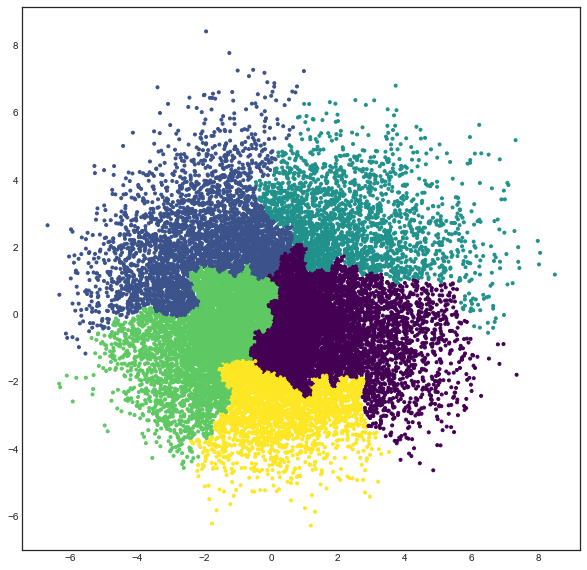

In [156]:
plt.figure(figsize=(10,10)) 
plt.scatter(reduced_data[:,0],reduced_data[:,1],c=agg_cluster_labels,cmap='viridis',marker='.')
plt.show()

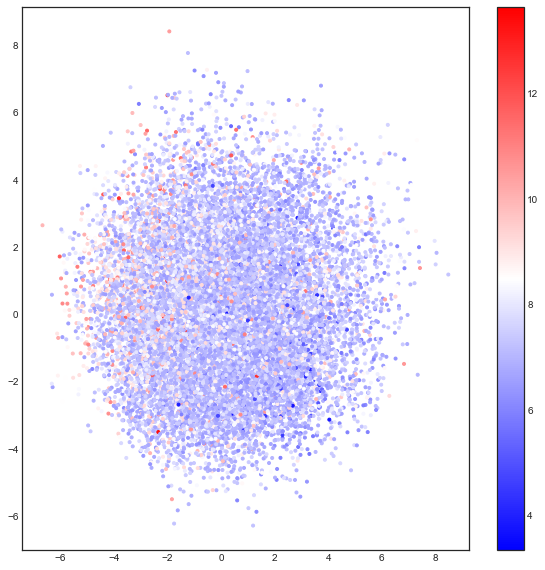

In [157]:

f, ax = plt.subplots(figsize=(10,10))
points = ax.scatter(reduced_data[:,0],reduced_data[:,1], c=y_train_scaled['shares'].values, marker='.', cmap='bwr')
f.colorbar(points)

## Dividing the dataset into 5 clusters 

In [158]:
cluster_0_X_train        = X_train_out_scaled[kmeans_preds == 0]
cluster_0_y_train_scaled = y_train_scaled[kmeans_preds == 0]
print("Cluster 0: ",cluster_0_X_train.shape)
print("Cluster 0: ",cluster_0_y_train_scaled.shape)

cluster_1_X_train        = X_train_out_scaled[kmeans_preds == 1]
cluster_1_y_train_scaled = y_train_scaled[kmeans_preds == 1]
print("Cluster 1: ",cluster_1_X_train.shape)
print("Cluster 1: ",cluster_1_y_train_scaled.shape)

cluster_2_X_train        = X_train_out_scaled[kmeans_preds== 2]
cluster_2_y_train_scaled = y_train_scaled[kmeans_preds== 2]
print("Cluster 2: ",cluster_2_X_train.shape)
print("Cluster 2: ",cluster_2_y_train_scaled.shape)

cluster_3_X_train        = X_train_out_scaled[kmeans_preds == 3]
cluster_3_y_train_scaled = y_train_scaled[kmeans_preds == 3]
print("Cluster 3: ",cluster_3_X_train.shape)
print("Cluster 3: ",cluster_3_y_train_scaled.shape)

cluster_4_X_train        = X_train_out_scaled[kmeans_preds == 4]
cluster_4_y_train_scaled = y_train_scaled[kmeans_preds == 4]
print("Cluster 4: ",cluster_4_X_train.shape)
print("Cluster 4: ",cluster_4_y_train_scaled.shape)

Cluster 0:  (5549, 55)
Cluster 0:  (5549, 1)
Cluster 1:  (5105, 55)
Cluster 1:  (5105, 1)
Cluster 2:  (4746, 55)
Cluster 2:  (4746, 1)
Cluster 3:  (2271, 55)
Cluster 3:  (2271, 1)
Cluster 4:  (3510, 55)
Cluster 4:  (3510, 1)


## Building Models on Cluster 0

### Cluster 0 - Model 1 - Linear Regression

In [159]:
c0_pipeline_1_selector = RFE(LinearRegression(), n_features_to_select=30)
c0_pipeline_1 = Pipeline([( "c0_m1_selector" , c0_pipeline_1_selector),
                          ("c0_m1_lr", LinearRegression())])

c0_pipeline_1_params = {'c0_m1_lr__fit_intercept':[True,False]}

c0_grid_pipeline_1 = GridSearchCV(c0_pipeline_1, c0_pipeline_1_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c0_grid_pipeline_1.fit(cluster_0_X_train,cluster_0_y_train_scaled)
c0_grid_pipeline_1.best_params_
c0_model_1 = c0_grid_pipeline_1.best_estimator_
print(c0_grid_pipeline_1.best_score_)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
-0.5833643328116386


### Cluster 0 - Model 2 - Decision Tree Regressor

In [160]:
from sklearn.feature_selection import SelectFromModel
c0_pipeline_2_selector = SelectFromModel(DecisionTreeRegressor())
c0_pipeline_2 = Pipeline([( "c0_m2_selector" , c0_pipeline_2_selector),
                          ("c0_m2_dtr", DecisionTreeRegressor(criterion='mse', random_state=100))])

c0_pipeline_2_params = {"c0_m2_dtr__splitter":["best","random"],
            "c0_m2_dtr__max_depth" : [1,3,5,7],
           "c0_m2_dtr__max_leaf_nodes":[30,60,90] }

c0_grid_pipeline_2 = GridSearchCV(c0_pipeline_2, c0_pipeline_2_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c0_grid_pipeline_2.fit(cluster_0_X_train,cluster_0_y_train_scaled)
c0_grid_pipeline_2.best_params_
c0_model_2 = c0_grid_pipeline_2.best_estimator_
print(c0_grid_pipeline_2.best_score_)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
-0.6155753924926592


### Cluster 0 - Model 3 - Random Forest Regressor

In [161]:
from sklearn.feature_selection import SelectFromModel
c0_pipeline_3_selector = SelectFromModel(RandomForestRegressor(n_estimators=100, max_depth=5))
c0_pipeline_3 = Pipeline([( "c0_m3_selector" , c0_pipeline_3_selector),
                          ("c0_m3_rfr", RandomForestRegressor(criterion='mse', random_state=100, max_features='sqrt',n_jobs=-1,verbose=1))])

c0_pipeline_3_params = {"c0_m3_rfr__n_estimators":[50,100],
            "c0_m3_rfr__max_depth" : [3,5],
           "c0_m3_rfr__max_leaf_nodes":[60, 90],
            "c0_m3_rfr__bootstrap":[True,False]}

c0_grid_pipeline_3 = GridSearchCV(c0_pipeline_3, c0_pipeline_3_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c0_grid_pipeline_3.fit(cluster_0_X_train,cluster_0_y_train_scaled)
c0_grid_pipeline_3.best_params_
c0_model_3 = c0_grid_pipeline_3.best_estimator_
print(c0_grid_pipeline_3.best_score_)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.1s finished


-0.5935509959611163


## Cluster 0 - Model 4 - kNN Regressor

In [162]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neighbors import KNeighborsRegressor

c0_pipeline_4_selector = SelectKBest(f_classif)
c0_pipeline_4 = Pipeline([( "c0_m4_selector" , c0_pipeline_4_selector),
                          ("c0_m4_knn", KNeighborsRegressor())])

c0_pipeline_4_params = {'c0_m4_selector__k':  list(range(20,31,2)),
              'c0_m4_knn__n_neighbors': list(range(40,62,4))}

c0_grid_pipeline_4 = GridSearchCV(c0_pipeline_4, c0_pipeline_4_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c0_grid_pipeline_4.fit(cluster_0_X_train,cluster_0_y_train_scaled)
print(c0_grid_pipeline_4.best_params_)
c0_model_4 = c0_grid_pipeline_4.best_estimator_
print(c0_grid_pipeline_4.best_score_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
{'c0_m4_knn__n_neighbors': 48, 'c0_m4_selector__k': 30}
-0.5945640746023575


## Cluster 0 -Model 5 - XGB Regressor

In [163]:
from xgboost import XGBRegressor
#c0_pipeline_5_selector = SelectFromModel(DecisionTreeRegressor())
c0_pipeline_5 = Pipeline([#( "c0_m5_selector" , c0_pipeline_5_selector),
                          ("c0_m5_xgbr", XGBRegressor(objective="reg:squarederror", verbosity=1, 
                                                      random_state=42, n_jobs=-1))])

c0_pipeline_5_params = {
                        "c0_m5_xgbr__n_estimators": [100, 500],
                        "c0_m5_xgbr__max_depth": [5,7],
                        "c0_m5_xgbr__learning_rate": [0.01,0.1],
                    }

c0_grid_pipeline_5 = GridSearchCV(c0_pipeline_5, c0_pipeline_5_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c0_grid_pipeline_5.fit(cluster_0_X_train,cluster_0_y_train_scaled)
print(c0_grid_pipeline_5.best_params_)
c0_model_5 = c0_grid_pipeline_5.best_estimator_
print(c0_grid_pipeline_5.best_score_)


Fitting 5 folds for each of 8 candidates, totalling 40 fits
{'c0_m5_xgbr__learning_rate': 0.01, 'c0_m5_xgbr__max_depth': 5, 'c0_m5_xgbr__n_estimators': 500}
-0.5718234847345764


### Cluster 1 - Model 1 - Linear Regression

In [164]:
c1_pipeline_1_selector = RFE(LinearRegression(), n_features_to_select=30)
c1_pipeline_1 = Pipeline([( "c1_m1_selector" , c1_pipeline_1_selector),
                          ("c1_m1_lr", LinearRegression())])

c1_pipeline_1_params = {'c1_m1_lr__fit_intercept':[True,False]}

c1_grid_pipeline_1 = GridSearchCV(c1_pipeline_1, c1_pipeline_1_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c1_grid_pipeline_1.fit(cluster_1_X_train,cluster_1_y_train_scaled)
print(c1_grid_pipeline_1.best_params_)
c1_model_1 = c1_grid_pipeline_1.best_estimator_
print(c1_grid_pipeline_1.best_score_)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
{'c1_m1_lr__fit_intercept': True}
-0.6231329180106824


### Cluster 1 - Model 2 - Decision Tree Regressor

In [165]:
from sklearn.feature_selection import SelectFromModel
c1_pipeline_2_selector = SelectFromModel(DecisionTreeRegressor())
c1_pipeline_2 = Pipeline([( "c1_m2_selector" , c1_pipeline_2_selector),
                          ("c1_m2_dtr", DecisionTreeRegressor(criterion='mse', random_state=100))])

c1_pipeline_2_params = {"c1_m2_dtr__splitter":["best","random"],
            "c1_m2_dtr__max_depth" : [1,3,5,7],
           "c1_m2_dtr__max_leaf_nodes":[30,60,90] }

c1_grid_pipeline_2 = GridSearchCV(c1_pipeline_2, c1_pipeline_2_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c1_grid_pipeline_2.fit(cluster_1_X_train,cluster_1_y_train_scaled)
print(c1_grid_pipeline_2.best_params_)
c1_model_2 = c1_grid_pipeline_2.best_estimator_
print(c1_grid_pipeline_2.best_score_)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
{'c1_m2_dtr__max_depth': 3, 'c1_m2_dtr__max_leaf_nodes': 90, 'c1_m2_dtr__splitter': 'best'}
-0.6433847803173561


### Cluster 1 - Model 3 - Random Forest Regressor

In [166]:
from sklearn.feature_selection import SelectFromModel
c1_pipeline_3_selector = SelectFromModel(RandomForestRegressor(n_estimators=100, max_depth=5))
c1_pipeline_3 = Pipeline([( "c1_m3_selector" , c1_pipeline_3_selector),
                          ("c1_m3_rfr", RandomForestRegressor(criterion='mse', random_state=100, max_features='sqrt',n_jobs=-1,verbose=1))])

c1_pipeline_3_params = {"c1_m3_rfr__n_estimators":[50,100],
            "c1_m3_rfr__max_depth" : [3,5],
           "c1_m3_rfr__max_leaf_nodes":[60, 90],
            "c1_m3_rfr__bootstrap":[True,False]}

c1_grid_pipeline_3 = GridSearchCV(c1_pipeline_3, c1_pipeline_3_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c1_grid_pipeline_3.fit(cluster_1_X_train,cluster_1_y_train_scaled)
c1_grid_pipeline_3.best_params_
c1_model_3 = c1_grid_pipeline_3.best_estimator_
print(c1_grid_pipeline_3.best_score_)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s


-0.6345298070047201


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.1s finished


## Cluster 1 - Model 4 - kNN Regressor

In [167]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neighbors import KNeighborsRegressor

c1_pipeline_4_selector = SelectKBest(f_classif)
c1_pipeline_4 = Pipeline([( "c1_m4_selector" , c1_pipeline_4_selector),
                          ("c1_m4_knn", KNeighborsRegressor())])

c1_pipeline_4_params = {'c1_m4_selector__k':  list(range(20,31,2)),
              'c1_m4_knn__n_neighbors': list(range(40,62,4))}

c1_grid_pipeline_4 = GridSearchCV(c1_pipeline_4, c1_pipeline_4_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c1_grid_pipeline_4.fit(cluster_1_X_train,cluster_1_y_train_scaled)
print(c1_grid_pipeline_4.best_params_)
c1_model_4 = c1_grid_pipeline_4.best_estimator_
print(c1_grid_pipeline_4.best_score_)


Fitting 5 folds for each of 36 candidates, totalling 180 fits
{'c1_m4_knn__n_neighbors': 60, 'c1_m4_selector__k': 30}
-0.6398544853921764


## Cluster 1 -Model 5 - XGB Regressor

In [168]:
from xgboost import XGBRegressor
#c0_pipeline_5_selector = SelectFromModel(DecisionTreeRegressor())
c1_pipeline_5 = Pipeline([#( "c0_m5_selector" , c0_pipeline_5_selector),
                          ("c1_m5_xgbr", XGBRegressor(objective="reg:squarederror", verbosity=1, 
                                                      random_state=42, n_jobs=-1))])

c1_pipeline_5_params = {
                        "c1_m5_xgbr__n_estimators": [100, 500],
                        "c1_m5_xgbr__max_depth": [5,7],
                        "c1_m5_xgbr__learning_rate": [0.01,0.1],
                    }

c1_grid_pipeline_5 = GridSearchCV(c1_pipeline_5, c1_pipeline_5_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c1_grid_pipeline_5.fit(cluster_1_X_train,cluster_1_y_train_scaled)
print(c1_grid_pipeline_5.best_params_)
c1_model_5 = c1_grid_pipeline_5.best_estimator_
print(c1_grid_pipeline_5.best_score_)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
{'c1_m5_xgbr__learning_rate': 0.01, 'c1_m5_xgbr__max_depth': 5, 'c1_m5_xgbr__n_estimators': 500}
-0.6127735226627153


### Cluster 2 - Model 1 - Linear Regression

In [169]:
c2_pipeline_1_selector = RFE(LinearRegression(), n_features_to_select=30)
c2_pipeline_1 = Pipeline([( "c2_m1_selector" , c2_pipeline_1_selector),
                          ("c2_m1_lr", LinearRegression())])

c2_pipeline_1_params = {'c2_m1_lr__fit_intercept':[True,False]}

c2_grid_pipeline_1 = GridSearchCV(c2_pipeline_1, c2_pipeline_1_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c2_grid_pipeline_1.fit(cluster_2_X_train,cluster_2_y_train_scaled)
print(c2_grid_pipeline_1.best_params_)
c2_model_1 = c2_grid_pipeline_1.best_estimator_
print(c2_grid_pipeline_1.best_score_)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
{'c2_m1_lr__fit_intercept': True}
-0.554055140002817



### Cluster 2 - Model 2 - Decision Tree Regressor

In [170]:
from sklearn.feature_selection import SelectFromModel
c2_pipeline_2_selector = SelectFromModel(DecisionTreeRegressor())
c2_pipeline_2 = Pipeline([( "c2_m2_selector" , c2_pipeline_2_selector),
                          ("c2_m2_dtr", DecisionTreeRegressor(criterion='mse', random_state=100))])

c2_pipeline_2_params = {"c2_m2_dtr__splitter":["best","random"],
            "c2_m2_dtr__max_depth" : [1,3,5,7],
           "c2_m2_dtr__max_leaf_nodes":[30,60,90] }

c2_grid_pipeline_2 = GridSearchCV(c2_pipeline_2, c2_pipeline_2_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c2_grid_pipeline_2.fit(cluster_2_X_train,cluster_2_y_train_scaled)
print(c2_grid_pipeline_2.best_params_)
c2_model_2 = c2_grid_pipeline_2.best_estimator_
print(c2_grid_pipeline_2.best_score_)


Fitting 5 folds for each of 24 candidates, totalling 120 fits
{'c2_m2_dtr__max_depth': 5, 'c2_m2_dtr__max_leaf_nodes': 60, 'c2_m2_dtr__splitter': 'random'}
-0.5770876618535232


### Cluster 2 - Model 3 - Random Forest Regressor


In [171]:
from sklearn.feature_selection import SelectFromModel
c2_pipeline_3_selector = SelectFromModel(RandomForestRegressor(n_estimators=100, max_depth=5))
c2_pipeline_3 = Pipeline([( "c2_m3_selector" , c2_pipeline_3_selector),
                          ("c2_m3_rfr", RandomForestRegressor(criterion='mse', random_state=100, max_features='sqrt',n_jobs=-1,verbose=1))])

c2_pipeline_3_params = {"c2_m3_rfr__n_estimators":[50,100],
            "c2_m3_rfr__max_depth" : [3,5],
           "c2_m3_rfr__max_leaf_nodes":[60, 90],
            "c2_m3_rfr__bootstrap":[True,False]}

c2_grid_pipeline_3 = GridSearchCV(c2_pipeline_3, c2_pipeline_3_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c2_grid_pipeline_3.fit(cluster_2_X_train,cluster_2_y_train_scaled)
print(c2_grid_pipeline_3.best_params_)
c2_model_3 = c2_grid_pipeline_3.best_estimator_
print(c2_grid_pipeline_3.best_score_)


Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    0.1s finished


{'c2_m3_rfr__bootstrap': True, 'c2_m3_rfr__max_depth': 5, 'c2_m3_rfr__max_leaf_nodes': 60, 'c2_m3_rfr__n_estimators': 50}
-0.558655427828506


## Cluster 2 - Model 4 - kNN Regressor

In [172]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neighbors import KNeighborsRegressor

c2_pipeline_4_selector = SelectKBest(f_classif)
c2_pipeline_4 = Pipeline([( "c2_m4_selector" , c2_pipeline_4_selector),
                          ("c2_m4_knn", KNeighborsRegressor())])

c2_pipeline_4_params = {'c2_m4_selector__k':  list(range(20,31,2)),
              'c2_m4_knn__n_neighbors': list(range(40,62,4))}

c2_grid_pipeline_4 = GridSearchCV(c2_pipeline_4, c2_pipeline_4_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c2_grid_pipeline_4.fit(cluster_2_X_train,cluster_2_y_train_scaled)
print(c2_grid_pipeline_4.best_params_)
c2_model_4 = c2_grid_pipeline_4.best_estimator_
print(c2_grid_pipeline_4.best_score_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
{'c2_m4_knn__n_neighbors': 56, 'c2_m4_selector__k': 30}
-0.5631868587116715


## Cluster 2 -Model 5 - XGB Regressor

In [173]:
from xgboost import XGBRegressor
#c0_pipeline_5_selector = SelectFromModel(DecisionTreeRegressor())
c2_pipeline_5 = Pipeline([#( "c0_m5_selector" , c0_pipeline_5_selector),
                          ("c2_m5_xgbr", XGBRegressor(objective="reg:squarederror", verbosity=1, 
                                                      random_state=42, n_jobs=-1))])

c2_pipeline_5_params = {
                        "c2_m5_xgbr__n_estimators": [100, 500],
                        "c2_m5_xgbr__max_depth": [5,7],
                        "c2_m5_xgbr__learning_rate": [0.01,0.1],
                    }

c2_grid_pipeline_5 = GridSearchCV(c2_pipeline_5, c2_pipeline_5_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c2_grid_pipeline_5.fit(cluster_2_X_train,cluster_2_y_train_scaled)
print(c2_grid_pipeline_5.best_params_)
c2_model_5 = c2_grid_pipeline_5.best_estimator_
print(c2_grid_pipeline_5.best_score_)


Fitting 5 folds for each of 8 candidates, totalling 40 fits
{'c2_m5_xgbr__learning_rate': 0.01, 'c2_m5_xgbr__max_depth': 5, 'c2_m5_xgbr__n_estimators': 500}
-0.5393572248269296


### Cluster 3 - Model 1 - Linear Regression

In [174]:
c3_pipeline_1_selector = RFE(LinearRegression(), n_features_to_select=30)
c3_pipeline_1 = Pipeline([( "c3_m1_selector" , c3_pipeline_1_selector),
                          ("c3_m1_lr", LinearRegression())])

c3_pipeline_1_params = {'c3_m1_lr__fit_intercept':[True,False]}

c3_grid_pipeline_1 = GridSearchCV(c3_pipeline_1, c3_pipeline_1_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c3_grid_pipeline_1.fit(cluster_3_X_train,cluster_3_y_train_scaled)
c3_grid_pipeline_1.best_params_
c3_model_1 = c3_grid_pipeline_1.best_estimator_
print(c3_grid_pipeline_1.best_score_)


Fitting 5 folds for each of 2 candidates, totalling 10 fits
-0.6185808953168993



### Cluster 3 - Model 2 - Decision Tree Regressor

In [175]:
from sklearn.feature_selection import SelectFromModel
c3_pipeline_2_selector = SelectFromModel(DecisionTreeRegressor())
c3_pipeline_2 = Pipeline([( "c3_m2_selector" , c3_pipeline_2_selector),
                          ("c3_m2_dtr", DecisionTreeRegressor(criterion='mse', random_state=100))])

c3_pipeline_2_params = {"c3_m2_dtr__splitter":["best","random"],
            "c3_m2_dtr__max_depth" : [1,3,5,7],
           "c3_m2_dtr__max_leaf_nodes":[30,60,90] }

c3_grid_pipeline_2 = GridSearchCV(c3_pipeline_2, c3_pipeline_2_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c3_grid_pipeline_2.fit(cluster_3_X_train,cluster_3_y_train_scaled)
c3_grid_pipeline_2.best_params_
c3_model_2 = c3_grid_pipeline_2.best_estimator_
print(c3_grid_pipeline_2.best_score_)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
-0.6404926365589294


### Cluster 3- Model 3 - Random Forest Regressor

In [176]:
from sklearn.feature_selection import SelectFromModel
c3_pipeline_3_selector = SelectFromModel(RandomForestRegressor(n_estimators=100, max_depth=5))
c3_pipeline_3 = Pipeline([( "c3_m3_selector" , c3_pipeline_3_selector),
                          ("c3_m3_rfr", RandomForestRegressor(criterion='mse', random_state=100, max_features='sqrt',n_jobs=-1,verbose=1))])

c3_pipeline_3_params = {"c3_m3_rfr__n_estimators":[50,100],
            "c3_m3_rfr__max_depth" : [3,5],
           "c3_m3_rfr__max_leaf_nodes":[60, 90],
            "c3_m3_rfr__bootstrap":[True,False]}

c3_grid_pipeline_3 = GridSearchCV(c3_pipeline_3, c3_pipeline_3_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c3_grid_pipeline_3.fit(cluster_3_X_train,cluster_3_y_train_scaled)
print(c3_grid_pipeline_3.best_params_)
c3_model_3 = c3_grid_pipeline_3.best_estimator_
print(c3_grid_pipeline_3.best_score_)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.1s finished


{'c3_m3_rfr__bootstrap': False, 'c3_m3_rfr__max_depth': 5, 'c3_m3_rfr__max_leaf_nodes': 60, 'c3_m3_rfr__n_estimators': 100}
-0.6226304165322458


## Cluster 3 - Model 4 - kNN Regressor

In [177]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neighbors import KNeighborsRegressor

c3_pipeline_4_selector = SelectKBest(f_classif)
c3_pipeline_4 = Pipeline([( "c3_m4_selector" , c3_pipeline_4_selector),
                          ("c3_m4_knn", KNeighborsRegressor())])

c3_pipeline_4_params = {'c3_m4_selector__k':  list(range(20,31,2)),
              'c3_m4_knn__n_neighbors': list(range(40,62,4))}

c3_grid_pipeline_4 = GridSearchCV(c3_pipeline_4, c3_pipeline_4_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c3_grid_pipeline_4.fit(cluster_3_X_train,cluster_3_y_train_scaled)
print(c3_grid_pipeline_4.best_params_)
c3_model_4 = c3_grid_pipeline_4.best_estimator_
print(c3_grid_pipeline_4.best_score_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
{'c3_m4_knn__n_neighbors': 48, 'c3_m4_selector__k': 30}
-0.6309786371685663


## Cluster 3 -Model 5 - XGB Regressor

In [178]:

from xgboost import XGBRegressor
#c0_pipeline_5_selector = SelectFromModel(DecisionTreeRegressor())
c3_pipeline_5 = Pipeline([#( "c0_m5_selector" , c0_pipeline_5_selector),
                          ("c3_m5_xgbr", XGBRegressor(objective="reg:squarederror", verbosity=1, 
                                                      random_state=42, n_jobs=-1))])

c3_pipeline_5_params = {
                        "c3_m5_xgbr__n_estimators": [100, 500],
                        "c3_m5_xgbr__max_depth": [5,7],
                        "c3_m5_xgbr__learning_rate": [0.01,0.1],
                    }

c3_grid_pipeline_5 = GridSearchCV(c3_pipeline_5, c3_pipeline_5_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c3_grid_pipeline_5.fit(cluster_3_X_train,cluster_3_y_train_scaled)
print(c3_grid_pipeline_5.best_params_)
c3_model_5 = c3_grid_pipeline_5.best_estimator_
print(c3_grid_pipeline_5.best_score_)


Fitting 5 folds for each of 8 candidates, totalling 40 fits
{'c3_m5_xgbr__learning_rate': 0.01, 'c3_m5_xgbr__max_depth': 5, 'c3_m5_xgbr__n_estimators': 500}
-0.6041016164210845


### Cluster 4 - Model 1 - Linear Regression


In [179]:
c4_pipeline_1_selector = RFE(LinearRegression(), n_features_to_select=30)
c4_pipeline_1 = Pipeline([( "c4_m1_selector" , c4_pipeline_1_selector),
                          ("c4_m1_lr", LinearRegression())])

c4_pipeline_1_params = {'c4_m1_lr__fit_intercept':[True,False]}

c4_grid_pipeline_1 = GridSearchCV(c4_pipeline_1, c4_pipeline_1_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c4_grid_pipeline_1.fit(cluster_4_X_train,cluster_4_y_train_scaled)
c4_grid_pipeline_1.best_params_
c4_model_1 = c4_grid_pipeline_1.best_estimator_
print(c4_grid_pipeline_1.best_score_)


Fitting 5 folds for each of 2 candidates, totalling 10 fits
-0.8225904642329814


### Cluster 4 - Model 2 - Decision Tree Regressor

In [180]:
from sklearn.feature_selection import SelectFromModel
c4_pipeline_2_selector = SelectFromModel(DecisionTreeRegressor())
c4_pipeline_2 = Pipeline([( "c4_m2_selector" , c4_pipeline_2_selector),
                          ("c4_m2_dtr", DecisionTreeRegressor(criterion='mse', random_state=100))])

c4_pipeline_2_params = {"c4_m2_dtr__splitter":["best","random"],
            "c4_m2_dtr__max_depth" : [1,3,5,7],
           "c4_m2_dtr__max_leaf_nodes":[30,60,90] }

c4_grid_pipeline_2 = GridSearchCV(c4_pipeline_2, c4_pipeline_2_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c4_grid_pipeline_2.fit(cluster_4_X_train,cluster_4_y_train_scaled)
c4_grid_pipeline_2.best_params_
c4_model_2 = c4_grid_pipeline_2.best_estimator_
print(c4_grid_pipeline_2.best_score_)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
-0.8390599778349003


### Cluster 4 - Model 3 - Random Forest Regressor

In [181]:
from sklearn.feature_selection import SelectFromModel
c4_pipeline_3_selector = SelectFromModel(RandomForestRegressor(n_estimators=100, max_depth=5))
c4_pipeline_3 = Pipeline([( "c4_m3_selector" , c4_pipeline_3_selector),
                          ("c4_m3_rfr", RandomForestRegressor(criterion='mse', random_state=100, max_features='sqrt',n_jobs=-1,verbose=1))])

c4_pipeline_3_params = {"c4_m3_rfr__n_estimators":[50,100],
            "c4_m3_rfr__max_depth" : [3,5],
           "c4_m3_rfr__max_leaf_nodes":[60, 90],
            "c4_m3_rfr__bootstrap":[True,False]}

c4_grid_pipeline_3 = GridSearchCV(c4_pipeline_3, c4_pipeline_3_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c4_grid_pipeline_3.fit(cluster_4_X_train,cluster_4_y_train_scaled)
c4_grid_pipeline_3.best_params_
c4_model_3 = c4_grid_pipeline_3.best_estimator_
print(c4_grid_pipeline_3.best_score_)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.1s finished


-0.8251280445823721



## Cluster 4 - Model 4 - kNN Regressor

In [182]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neighbors import KNeighborsRegressor

c4_pipeline_4_selector = SelectKBest(f_classif)
c4_pipeline_4 = Pipeline([( "c4_m4_selector" , c4_pipeline_4_selector),
                          ("c4_m4_knn", KNeighborsRegressor())])

c4_pipeline_4_params = {'c4_m4_selector__k':  list(range(20,31,2)),
              'c4_m4_knn__n_neighbors': list(range(40,62,4))}

c4_grid_pipeline_4 = GridSearchCV(c4_pipeline_4, c4_pipeline_4_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c4_grid_pipeline_4.fit(cluster_4_X_train,cluster_4_y_train_scaled)
print(c4_grid_pipeline_4.best_params_)
c4_model_4 = c4_grid_pipeline_4.best_estimator_
print(c4_grid_pipeline_4.best_score_)


Fitting 5 folds for each of 36 candidates, totalling 180 fits
{'c4_m4_knn__n_neighbors': 56, 'c4_m4_selector__k': 30}
-0.8351357409231104


## Cluster 4 -Model 5 - XGB Regressor

In [183]:
from xgboost import XGBRegressor
#c0_pipeline_5_selector = SelectFromModel(DecisionTreeRegressor())
c4_pipeline_5 = Pipeline([#( "c0_m5_selector" , c0_pipeline_5_selector),
                          ("c4_m5_xgbr", XGBRegressor(objective="reg:squarederror", verbosity=1, 
                                                      random_state=42, n_jobs=-1))])

c4_pipeline_5_params = {
                        "c4_m5_xgbr__n_estimators": [100, 500],
                        "c4_m5_xgbr__max_depth": [5,7],
                        "c4_m5_xgbr__learning_rate": [0.01,0.1],
                    }

c4_grid_pipeline_5 = GridSearchCV(c4_pipeline_5, c4_pipeline_5_params, scoring= 'neg_mean_absolute_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c4_grid_pipeline_5.fit(cluster_4_X_train,cluster_4_y_train_scaled)
print(c4_grid_pipeline_5.best_params_)
c4_model_5 = c4_grid_pipeline_5.best_estimator_
print(c4_grid_pipeline_5.best_score_)


Fitting 5 folds for each of 8 candidates, totalling 40 fits
{'c4_m5_xgbr__learning_rate': 0.01, 'c4_m5_xgbr__max_depth': 5, 'c4_m5_xgbr__n_estimators': 500}
-0.8151211799906577


In [184]:

def plot_errors(model,X_input, y_actual, title):
    y_train_pred = model.predict(X_input)
    try:
        residu=y_actual.values.ravel()- y_train_pred.ravel() ##can use reshape(-1,1) instead of ravel to covert to (n,)
    except:
        residu=y_actual.values.ravel()- y_train_pred.values

    fig, [ax1, ax2, ax3] = plt.subplots(nrows=1, ncols=3,figsize=(16,4))

    ax1.scatter(y_train_pred,residu)
    ax1.set_xlabel('y_pred')                          # X-label
    ax1.set_ylabel('residual') 
    ax1.set_title('y_pred vs residual')

    sns.distplot((residu), bins = 20,ax=ax2)
    ax2.set_xlabel('Errors')                         # X-label
    ax2.set_title('Density plot of residuals')

    sm.qqplot(residu,line='s',ax=ax3)
    ax3.set_title('QQ Plot')
    plt.suptitle(title)
    plt.show()



### Cluster 0 - Error plots

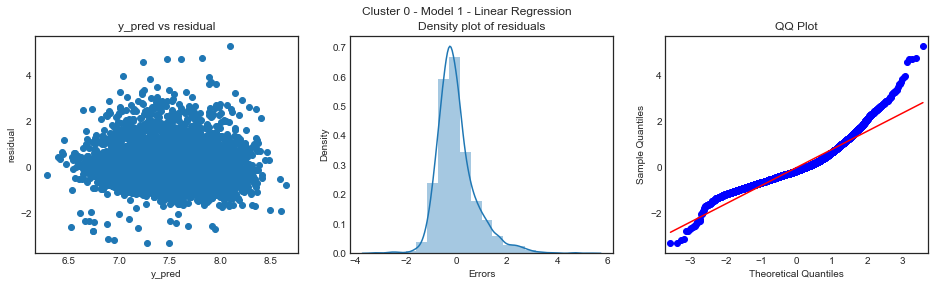

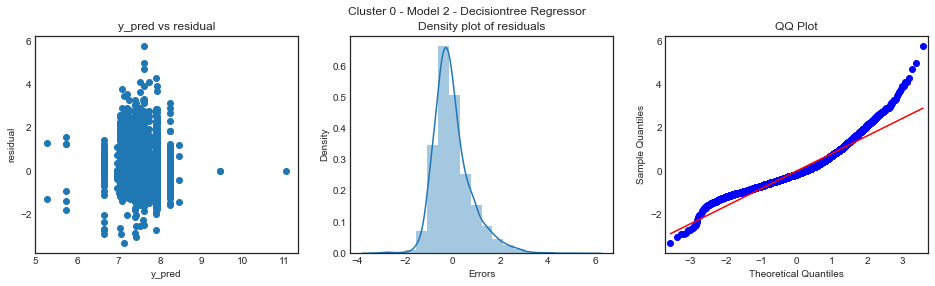

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    1.2s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.2s finished


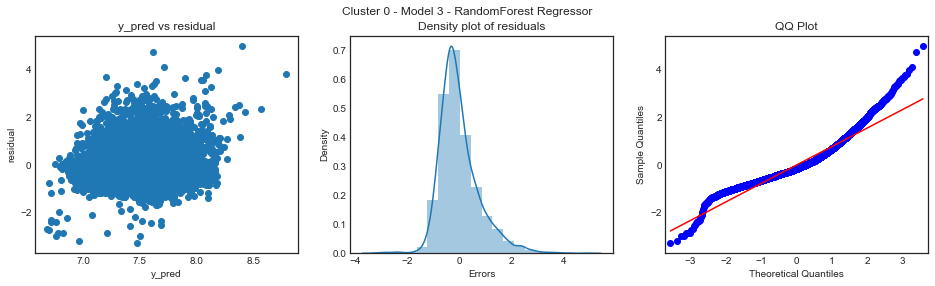

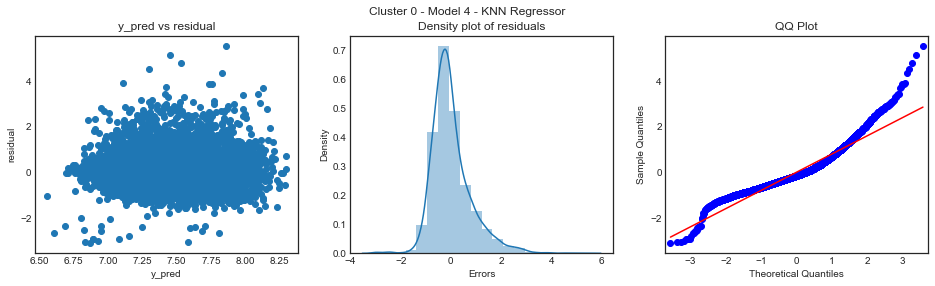

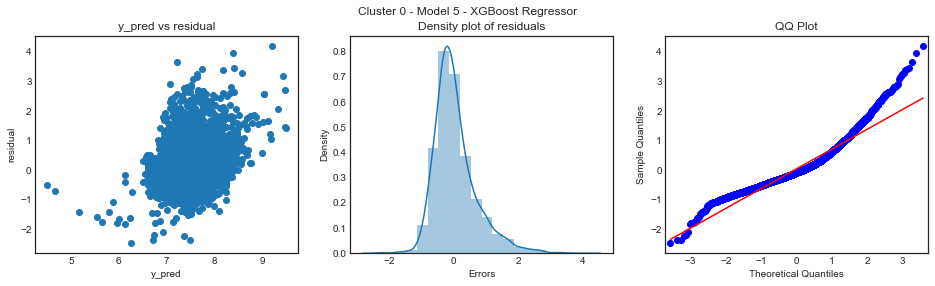

In [185]:
plot_errors(c0_model_1,cluster_0_X_train, cluster_0_y_train_scaled, 'Cluster 0 - Model 1 - Linear Regression')
plot_errors(c0_model_2,cluster_0_X_train, cluster_0_y_train_scaled, 'Cluster 0 - Model 2 - Decisiontree Regressor')
plot_errors(c0_model_3,cluster_0_X_train, cluster_0_y_train_scaled, 'Cluster 0 - Model 3 - RandomForest Regressor')
plot_errors(c0_model_4,cluster_0_X_train, cluster_0_y_train_scaled, 'Cluster 0 - Model 4 - KNN Regressor')
plot_errors(c0_model_5,cluster_0_X_train, cluster_0_y_train_scaled, 'Cluster 0 - Model 5 - XGBoost Regressor')

### Residual plots for cluster-0

In [186]:

def residual_errors(model,X_input, y_actual):
    y_train_pred = model.predict(X_input)
    residual_results=pd.DataFrame()
    residual_results['Actual'] =y_actual.values.ravel()
    residual_results['predicted'] = y_train_pred.ravel()
    residual_results['residual'] = residual_results['Actual'] - residual_results['predicted']
    residual_results['shares']= np.exp(y_actual.values.ravel())
    residual_results['predicted_shares'] = np.exp(y_train_pred)
    residual_results.index = X_input.index
    return residual_results

In [187]:
residual_results_c0_m1 = residual_errors(c0_model_1,cluster_0_X_train, cluster_0_y_train_scaled)
residual_results_c0_m2 = residual_errors(c0_model_2,cluster_0_X_train, cluster_0_y_train_scaled)
residual_results_c0_m3 = residual_errors(c0_model_3,cluster_0_X_train, cluster_0_y_train_scaled)
residual_results_c0_m4 = residual_errors(c0_model_4,cluster_0_X_train, cluster_0_y_train_scaled)
residual_results_c0_m5 = residual_errors(c0_model_5,cluster_0_X_train, cluster_0_y_train_scaled)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [188]:
print("Residual results for cluster 0 model 1 ")
print(residual_results_c0_m1.head())
print("\n")
print("Residual results for cluster 0 model 2 ")
print(residual_results_c0_m2.head())
print("\n")
print("Residual results for cluster 0 model 3 ")
print(residual_results_c0_m3.head())
print("\n")
print("Residual results for cluster 0 model 4 ")
print(residual_results_c0_m4.head())
print("\n")
print("Residual results for cluster 0 model 5 ")
print(residual_results_c0_m5.head())

Residual results for cluster 0 model 1 
         Actual  predicted  residual   shares  predicted_shares
id                                                             
28922  6.689599   7.864783 -1.175183    804.0       2603.944304
2679   9.472705   7.716165  1.756540  13000.0       2244.335778
26552  6.291569   6.946817 -0.655248    540.0       1039.834985
7073   7.244228   7.276602 -0.032375   1400.0       1446.066433
25878  9.210340   7.460181  1.750159  10000.0       1737.462467


Residual results for cluster 0 model 2 
         Actual  predicted  residual   shares  predicted_shares
id                                                             
28922  6.689599   7.600128 -0.910528    804.0       1998.450916
2679   9.472705   7.410690  2.062015  13000.0       1653.566989
26552  6.291569   7.248430 -0.956861    540.0       1405.895749
7073   7.244228   7.083725  0.160503   1400.0       1192.401510
25878  9.210340   7.620773  1.589567  10000.0       2040.138995


Residual results for

### Regression results for cluster  0

In [189]:
def regression_metrics(df, model):
    print("Regression results in log space        : ", model, "\n")
    regression_results(df['Actual'].values, df['predicted'].values)
    print("\n")
    print("Regression results for actual shares   : ", model, "\n")
    regression_results(df['shares'].values, df['predicted_shares'].values)

In [190]:
regression_metrics(residual_results_c0_m1, 'Cluster 0 - Model 1 - Linear Regression')
print("\n")
regression_metrics(residual_results_c0_m2, 'Cluster 0 - Model 2 - Decisiontree Regressor')
print("\n")
regression_metrics(residual_results_c0_m3, 'Cluster 0 - Model 3 - RandomForest Regressor')
print("\n")
regression_metrics(residual_results_c0_m4, 'Cluster 0 - Model 4 - KNN Regressor')
print("\n")
regression_metrics(residual_results_c0_m5, 'Cluster 0 - Model 5 -XGBoost Regressor')

Regression results in log space        :  Cluster 0 - Model 1 - Linear Regression 

explained_variance:  0.1727
r2:  0.1727
MAE:  0.5758
MSE:  0.6281
RMSE:  0.7925


Regression results for actual shares   :  Cluster 0 - Model 1 - Linear Regression 

explained_variance:  0.0113
r2:  -0.0001
MAE:  2066.9584
MSE:  145143204.2214
RMSE:  12047.5393


Regression results in log space        :  Cluster 0 - Model 2 - Decisiontree Regressor 

explained_variance:  0.1293
r2:  0.1293
MAE:  0.6018
MSE:  0.6611
RMSE:  0.8131


Regression results for actual shares   :  Cluster 0 - Model 2 - Decisiontree Regressor 

explained_variance:  0.0123
r2:  0.0005
MAE:  2097.9729
MSE:  145055134.4436
RMSE:  12043.8837


Regression results in log space        :  Cluster 0 - Model 3 - RandomForest Regressor 

explained_variance:  0.2045
r2:  0.2045
MAE:  0.5743
MSE:  0.604
RMSE:  0.7771


Regression results for actual shares   :  Cluster 0 - Model 3 - RandomForest Regressor 

explained_variance:  0.0198
r2:  0.0

### Error plots for cluster 1

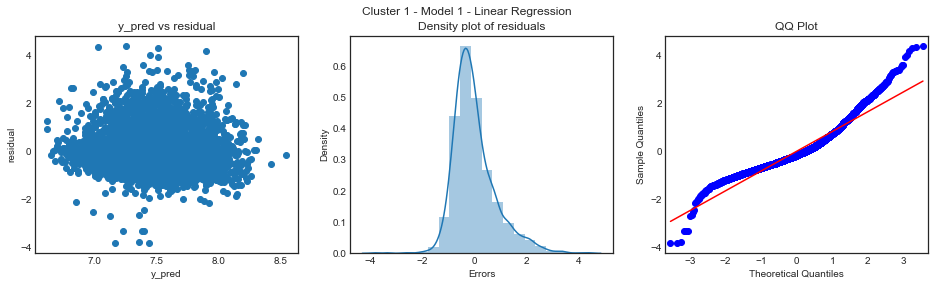

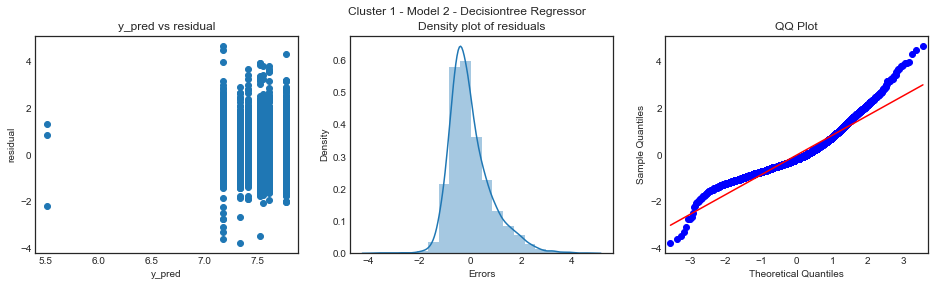

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


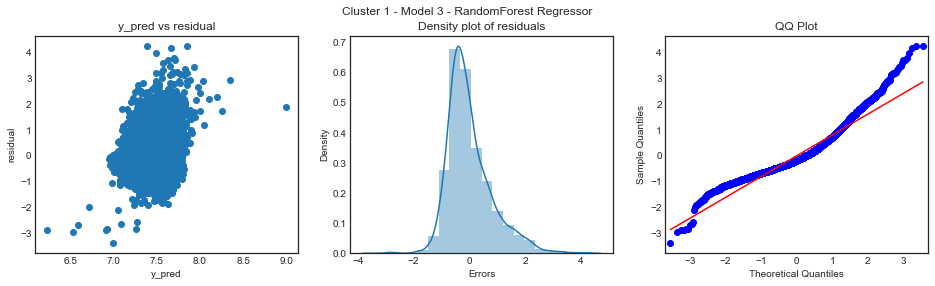

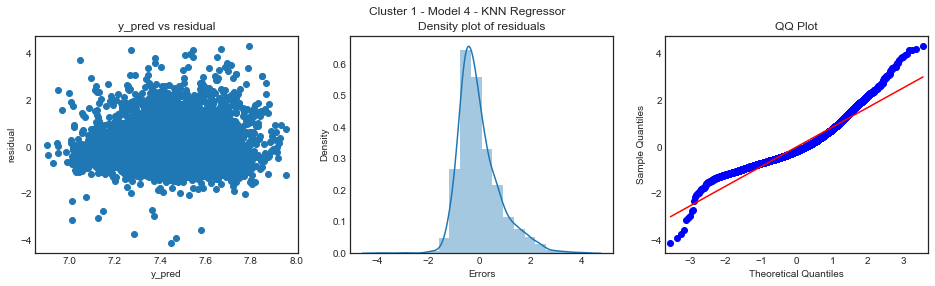

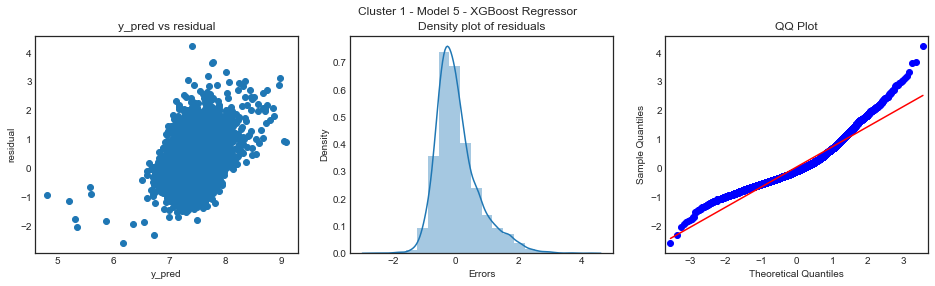

In [191]:
plot_errors(c1_model_1,cluster_1_X_train, cluster_1_y_train_scaled, 'Cluster 1 - Model 1 - Linear Regression')
plot_errors(c1_model_2,cluster_1_X_train, cluster_1_y_train_scaled, 'Cluster 1 - Model 2 - Decisiontree Regressor')
plot_errors(c1_model_3,cluster_1_X_train, cluster_1_y_train_scaled, 'Cluster 1 - Model 3 - RandomForest Regressor')
plot_errors(c1_model_4,cluster_1_X_train, cluster_1_y_train_scaled, 'Cluster 1 - Model 4 - KNN Regressor')
plot_errors(c1_model_5,cluster_1_X_train, cluster_1_y_train_scaled, 'Cluster 1 - Model 5 - XGBoost Regressor')


### Residual results for cluster 1

In [192]:
residual_results_c1_m1 = residual_errors(c1_model_1,cluster_1_X_train, cluster_1_y_train_scaled)
residual_results_c1_m2 = residual_errors(c1_model_2,cluster_1_X_train, cluster_1_y_train_scaled)
residual_results_c1_m3 = residual_errors(c1_model_3,cluster_1_X_train, cluster_1_y_train_scaled)
residual_results_c1_m4 = residual_errors(c1_model_4,cluster_1_X_train, cluster_1_y_train_scaled)
residual_results_c1_m5 = residual_errors(c1_model_5,cluster_1_X_train, cluster_1_y_train_scaled)


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [193]:
print("Residual results for cluster 1 model 1 ")
print(residual_results_c1_m1.head())
print("\n")
print("Residual results for cluster 1 model 2 ")
print(residual_results_c1_m2.head())
print("\n")
print("Residual results for cluster 1 model 3 ")
print(residual_results_c1_m3.head())
print("\n")
print("Residual results for cluster 1 model 4 ")
print(residual_results_c1_m4.head())
print("\n")
print("Residual results for cluster 1 model 5 ")
print(residual_results_c1_m5.head())


Residual results for cluster 1 model 1 
         Actual  predicted  residual  shares  predicted_shares
id                                                            
3394   7.377759   7.256102  0.121657  1600.0       1416.722789
10207  7.090077   7.161721 -0.071645  1200.0       1289.128237
19427  7.170120   7.283191 -0.113072  1300.0       1455.625916
20236  7.495542   7.145122  0.350420  1800.0       1267.906166
3168   6.854355   7.185851 -0.331497   948.0       1320.612741


Residual results for cluster 1 model 2 
         Actual  predicted  residual  shares  predicted_shares
id                                                            
3394   7.377759   7.522830 -0.145071  1600.0       1849.794505
10207  7.090077   7.406169 -0.316092  1200.0       1646.108155
19427  7.170120   7.765214 -0.595095  1300.0       2357.163984
20236  7.495542   7.171706  0.323836  1800.0       1302.063765
3168   6.854355   7.522830 -0.668475   948.0       1849.794505


Residual results for cluster 1 mod

### Regression results for cluster 1

In [194]:
regression_metrics(residual_results_c1_m1, 'Cluster 1 - Model 1 - Linear Regression')
print("\n")
regression_metrics(residual_results_c1_m2, 'Cluster 1 - Model 2 - Decisiontree Regressor')
print("\n")
regression_metrics(residual_results_c1_m3, 'Cluster 1 - Model 3 - RandomForest Regressor')
print("\n")
regression_metrics(residual_results_c1_m4, 'Cluster 1 - Model 4 - KNN Regressor')
print("\n")
regression_metrics(residual_results_c1_m5, 'Cluster 1 - Model 5 -XGBoost Regressor')

Regression results in log space        :  Cluster 1 - Model 1 - Linear Regression 

explained_variance:  0.1031
r2:  0.1031
MAE:  0.6136
MSE:  0.6842
RMSE:  0.8271


Regression results for actual shares   :  Cluster 1 - Model 1 - Linear Regression 

explained_variance:  0.019
r2:  -0.013
MAE:  1991.7567
MSE:  45163687.304
RMSE:  6720.3934


Regression results in log space        :  Cluster 1 - Model 2 - Decisiontree Regressor 

explained_variance:  0.06
r2:  0.06
MAE:  0.6359
MSE:  0.7171
RMSE:  0.8468


Regression results for actual shares   :  Cluster 1 - Model 2 - Decisiontree Regressor 

explained_variance:  0.01
r2:  -0.0237
MAE:  2023.2453
MSE:  45637925.344
RMSE:  6755.5848


Regression results in log space        :  Cluster 1 - Model 3 - RandomForest Regressor 

explained_variance:  0.1418
r2:  0.1418
MAE:  0.6089
MSE:  0.6546
RMSE:  0.8091


Regression results for actual shares   :  Cluster 1 - Model 3 - RandomForest Regressor 

explained_variance:  0.0277
r2:  -0.0067
MAE:  1

### Error plots for cluster 2

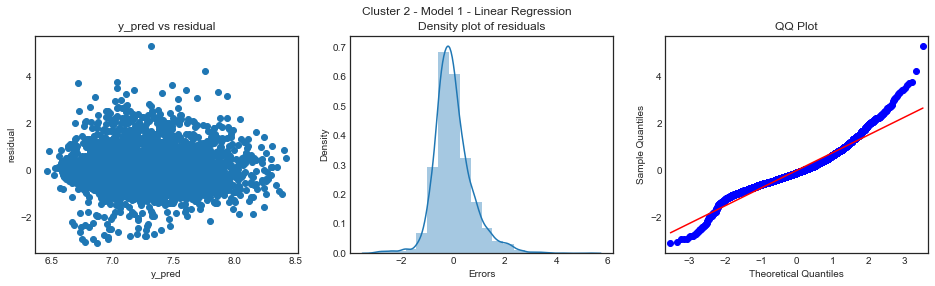

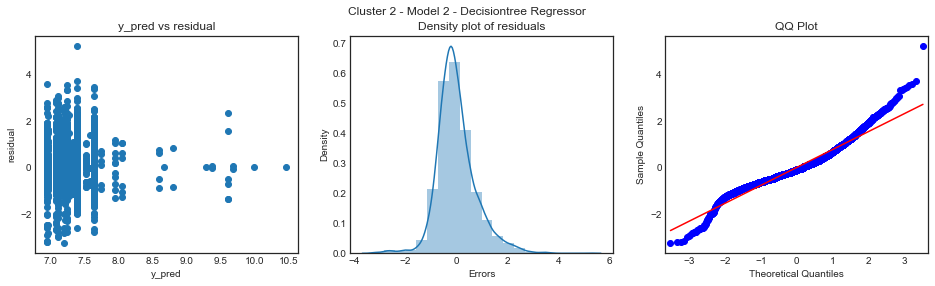

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  50 out of  50 | elapsed:    0.0s finished


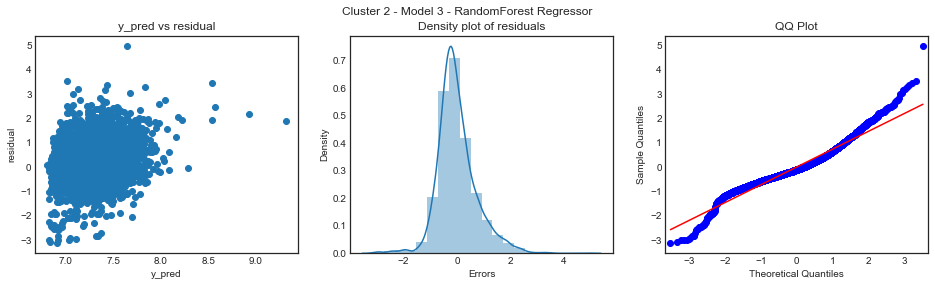

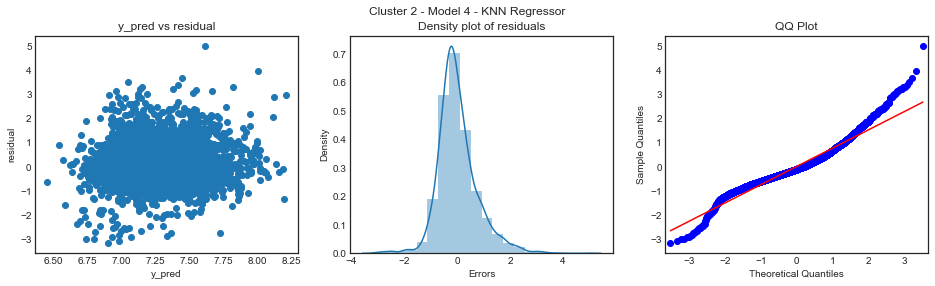

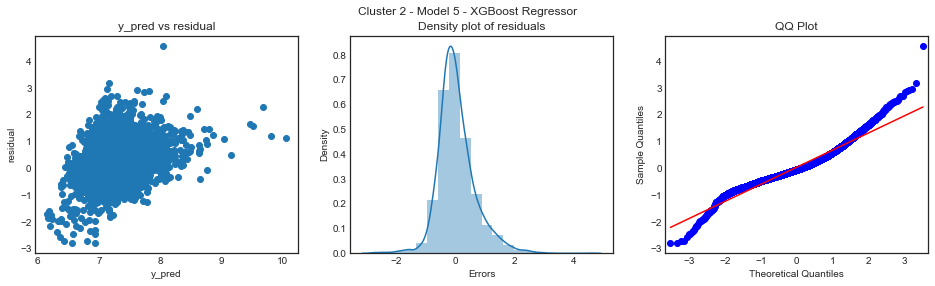

In [195]:
plot_errors(c2_model_1,cluster_2_X_train, cluster_2_y_train_scaled, 'Cluster 2 - Model 1 - Linear Regression')
plot_errors(c2_model_2,cluster_2_X_train, cluster_2_y_train_scaled, 'Cluster 2 - Model 2 - Decisiontree Regressor')
plot_errors(c2_model_3,cluster_2_X_train, cluster_2_y_train_scaled, 'Cluster 2 - Model 3 - RandomForest Regressor')
plot_errors(c2_model_4,cluster_2_X_train, cluster_2_y_train_scaled, 'Cluster 2 - Model 4 - KNN Regressor')
plot_errors(c2_model_5,cluster_2_X_train, cluster_2_y_train_scaled, 'Cluster 2 - Model 5 - XGBoost Regressor')


In [196]:
residual_results_c2_m1 = residual_errors(c2_model_1,cluster_2_X_train, cluster_2_y_train_scaled)
residual_results_c2_m2 = residual_errors(c2_model_2,cluster_2_X_train, cluster_2_y_train_scaled)
residual_results_c2_m3 = residual_errors(c2_model_3,cluster_2_X_train, cluster_2_y_train_scaled)
residual_results_c2_m4 = residual_errors(c2_model_4,cluster_2_X_train, cluster_2_y_train_scaled)
residual_results_c2_m5 = residual_errors(c2_model_5,cluster_2_X_train, cluster_2_y_train_scaled)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  50 out of  50 | elapsed:    0.0s finished


In [197]:
print("Residual results for cluster 2 model 1 ")
print(residual_results_c2_m1.head())
print("\n")
print("Residual results for cluster 2 model 2 ")
print(residual_results_c2_m2.head())
print("\n")
print("Residual results for cluster 2 model 3 ")
print(residual_results_c2_m3.head())
print("\n")
print("Residual results for cluster 2 model 4 ")
print(residual_results_c2_m4.head())
print("\n")
print("Residual results for cluster 2 model 5 ")
print(residual_results_c2_m5.head())


Residual results for cluster 2 model 1 
         Actual  predicted  residual  shares  predicted_shares
id                                                            
17705  7.170120   6.954529  0.215590  1300.0       1047.885168
1416   7.170120   7.128081  0.042038  1300.0       1246.483024
26616  7.377759   7.713221 -0.335462  1600.0       2237.738750
12515  7.549609   7.197009  0.352600  1900.0       1335.430533
25528  7.377759   7.060678  0.317081  1600.0       1165.235402


Residual results for cluster 2 model 2 
         Actual  predicted  residual  shares  predicted_shares
id                                                            
17705  7.170120   7.246781 -0.076662  1300.0       1403.579920
1416   7.170120   7.085345  0.084775  1300.0       1194.334802
26616  7.377759   7.646828 -0.269069  1600.0       2093.993358
12515  7.549609   6.953546  0.596063  1900.0       1046.855364
25528  7.377759   6.953546  0.424213  1600.0       1046.855364


Residual results for cluster 2 mod

### Regression results for cluster 2

In [198]:
regression_metrics(residual_results_c2_m1, 'Cluster 2 - Model 1 - Linear Regression')
print("\n")
regression_metrics(residual_results_c2_m2, 'Cluster 2 - Model 2 - Decisiontree Regressor')
print("\n")
regression_metrics(residual_results_c2_m3, 'Cluster 2 - Model 3 - RandomForest Regressor')
print("\n")
regression_metrics(residual_results_c2_m4, 'Cluster 2 - Model 4 - KNN Regressor')
print("\n")
regression_metrics(residual_results_c2_m5, 'Cluster 2 - Model 5 -XGBoost Regressor')

Regression results in log space        :  Cluster 2 - Model 1 - Linear Regression 

explained_variance:  0.1488
r2:  0.1488
MAE:  0.5469
MSE:  0.5683
RMSE:  0.7538


Regression results for actual shares   :  Cluster 2 - Model 1 - Linear Regression 

explained_variance:  0.0168
r2:  0.0013
MAE:  1356.5081
MSE:  37322321.6112
RMSE:  6109.1998


Regression results in log space        :  Cluster 2 - Model 2 - Decisiontree Regressor 

explained_variance:  0.1108
r2:  0.1108
MAE:  0.5641
MSE:  0.5937
RMSE:  0.7705


Regression results for actual shares   :  Cluster 2 - Model 2 - Decisiontree Regressor 

explained_variance:  0.0519
r2:  0.0363
MAE:  1361.7185
MSE:  36012937.0238
RMSE:  6001.078


Regression results in log space        :  Cluster 2 - Model 3 - RandomForest Regressor 

explained_variance:  0.1985
r2:  0.1985
MAE:  0.5362
MSE:  0.5351
RMSE:  0.7315


Regression results for actual shares   :  Cluster 2 - Model 3 - RandomForest Regressor 

explained_variance:  0.0424
r2:  0.0252
M

### Error plots for cluster 3

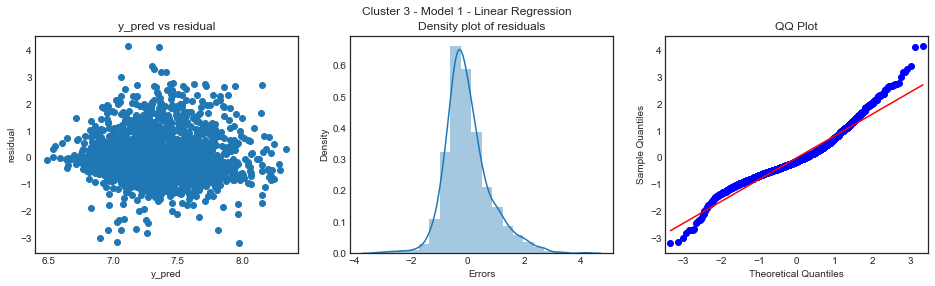

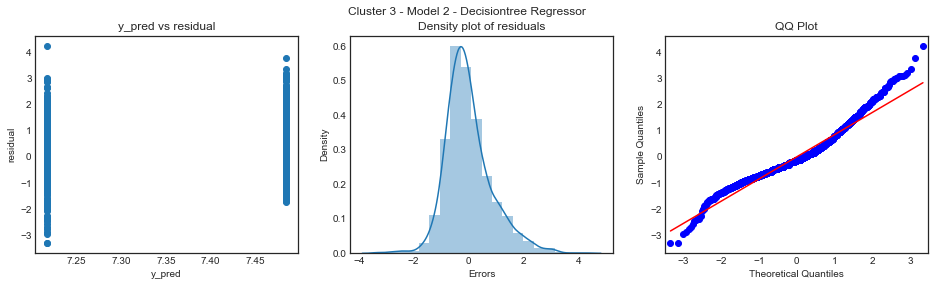

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


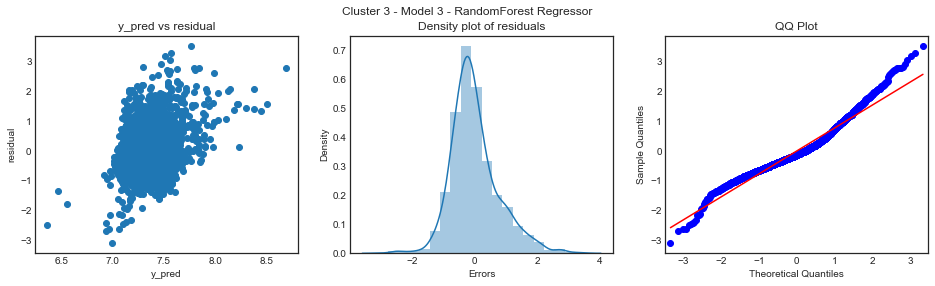

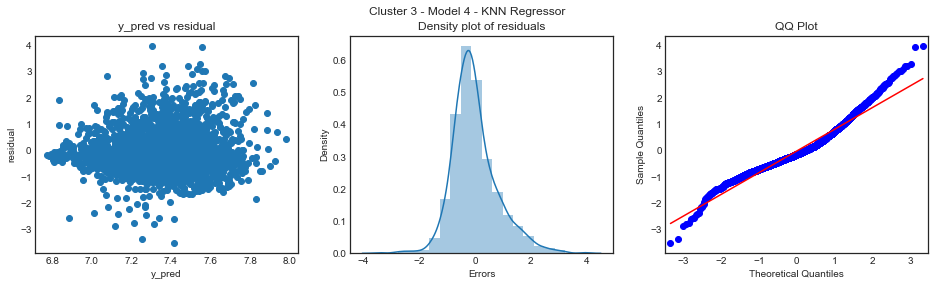

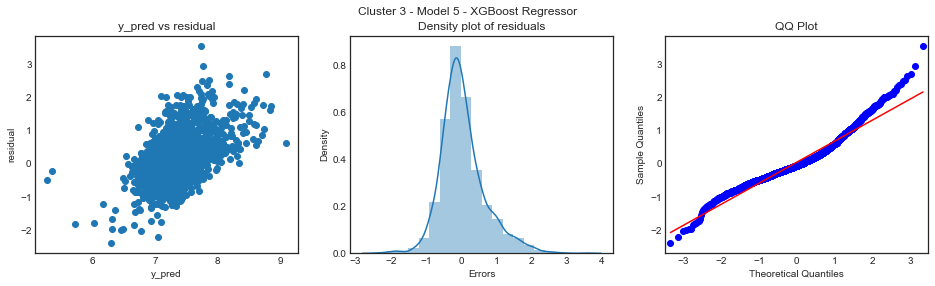

In [199]:
plot_errors(c3_model_1,cluster_3_X_train, cluster_3_y_train_scaled, 'Cluster 3 - Model 1 - Linear Regression')
plot_errors(c3_model_2,cluster_3_X_train, cluster_3_y_train_scaled, 'Cluster 3 - Model 2 - Decisiontree Regressor')
plot_errors(c3_model_3,cluster_3_X_train, cluster_3_y_train_scaled, 'Cluster 3 - Model 3 - RandomForest Regressor')
plot_errors(c3_model_4,cluster_3_X_train, cluster_3_y_train_scaled, 'Cluster 3 - Model 4 - KNN Regressor')
plot_errors(c3_model_5,cluster_3_X_train, cluster_3_y_train_scaled, 'Cluster 3 - Model 5 - XGBoost Regressor')


In [200]:
residual_results_c3_m1 = residual_errors(c3_model_1,cluster_3_X_train, cluster_3_y_train_scaled)
residual_results_c3_m2 = residual_errors(c3_model_2,cluster_3_X_train, cluster_3_y_train_scaled)
residual_results_c3_m3 = residual_errors(c3_model_3,cluster_3_X_train, cluster_3_y_train_scaled)
residual_results_c3_m4 = residual_errors(c3_model_4,cluster_3_X_train, cluster_3_y_train_scaled)
residual_results_c3_m5 = residual_errors(c3_model_5,cluster_3_X_train, cluster_3_y_train_scaled)


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [201]:
print("Residual results for cluster 3 model 1 ")
print(residual_results_c3_m1.head())
print("\n")
print("Residual results for cluster 3 model 2 ")
print(residual_results_c3_m2.head())
print("\n")
print("Residual results for cluster 3 model 3 ")
print(residual_results_c3_m3.head())
print("\n")
print("Residual results for cluster 3 model 4 ")
print(residual_results_c3_m4.head())
print("\n")
print("Residual results for cluster 3 model 5 ")
print(residual_results_c3_m5.head())

Residual results for cluster 3 model 1 
         Actual  predicted  residual  shares  predicted_shares
id                                                            
1672   6.891626   7.737977 -0.846351   984.0       2293.826262
29531  8.948976   7.769491  1.179485  7700.0       2367.265505
22786  8.188689   7.180791  1.007898  3600.0       1313.947346
4287   7.170120   6.940707  0.229413  1300.0       1033.500648
11917  5.981414   6.918508 -0.937094   396.0       1010.810476


Residual results for cluster 3 model 2 
         Actual  predicted  residual  shares  predicted_shares
id                                                            
1672   6.891626   7.484338 -0.592712   984.0       1779.945546
29531  8.948976   7.216858  1.732118  7700.0       1362.201682
22786  8.188689   7.484338  0.704351  3600.0       1779.945546
4287   7.170120   7.216858 -0.046738  1300.0       1362.201682
11917  5.981414   7.216858 -1.235443   396.0       1362.201682


Residual results for cluster 3 mod

### Regression results for cluster 3

In [202]:
regression_metrics(residual_results_c3_m1, 'Cluster 3 - Model 1 - Linear Regression')
print("\n")
regression_metrics(residual_results_c3_m2, 'Cluster 3 - Model 2 - Decisiontree Regressor')
print("\n")
regression_metrics(residual_results_c3_m3, 'Cluster 3 - Model 3 - RandomForest Regressor')
print("\n")
regression_metrics(residual_results_c3_m4, 'Cluster 3 - Model 4 - KNN Regressor')
print("\n")
regression_metrics(residual_results_c3_m5, 'Cluster 3 - Model 5 -XGBoost Regressor')

Regression results in log space        :  Cluster 3 - Model 1 - Linear Regression 

explained_variance:  0.1084
r2:  0.1084
MAE:  0.605
MSE:  0.6693
RMSE:  0.8181


Regression results for actual shares   :  Cluster 3 - Model 1 - Linear Regression 

explained_variance:  0.0275
r2:  -0.0119
MAE:  1626.5194
MSE:  22375504.3711
RMSE:  4730.2753


Regression results in log space        :  Cluster 3 - Model 2 - Decisiontree Regressor 

explained_variance:  0.0237
r2:  0.0237
MAE:  0.6408
MSE:  0.7329
RMSE:  0.8561


Regression results for actual shares   :  Cluster 3 - Model 2 - Decisiontree Regressor 

explained_variance:  0.0073
r2:  -0.0366
MAE:  1675.0888
MSE:  22921167.2376
RMSE:  4787.6056


Regression results in log space        :  Cluster 3 - Model 3 - RandomForest Regressor 

explained_variance:  0.203
r2:  0.203
MAE:  0.5784
MSE:  0.5983
RMSE:  0.7735


Regression results for actual shares   :  Cluster 3 - Model 3 - RandomForest Regressor 

explained_variance:  0.0732
r2:  0.0311
M

###  Error plots for cluster 4

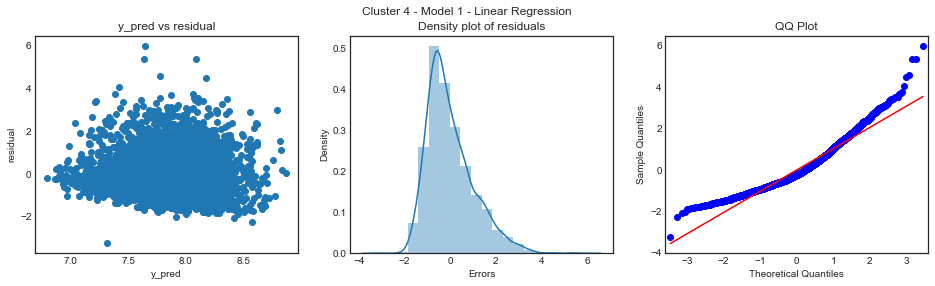

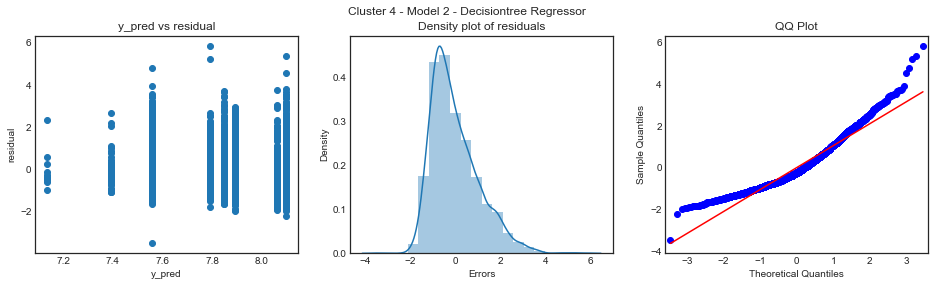

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


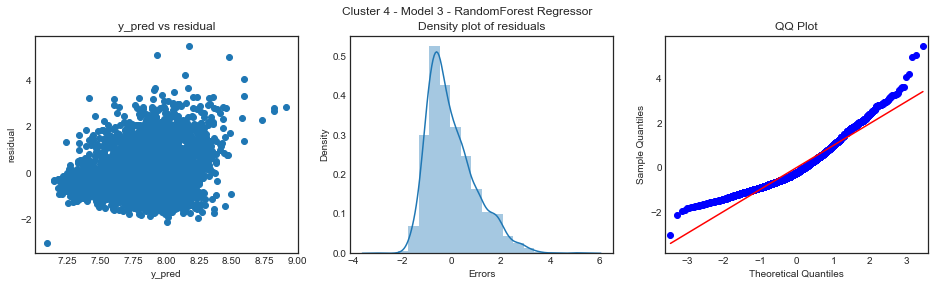

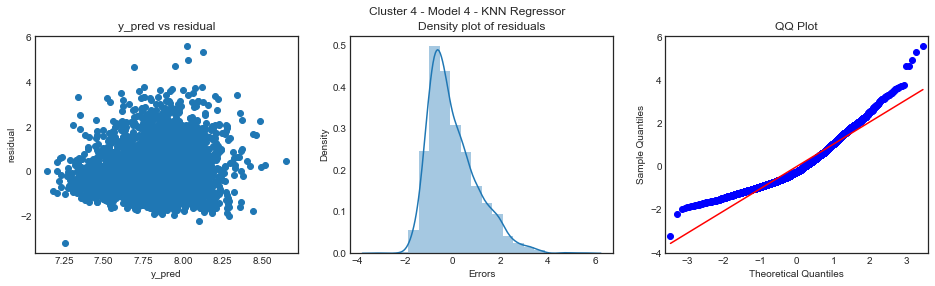

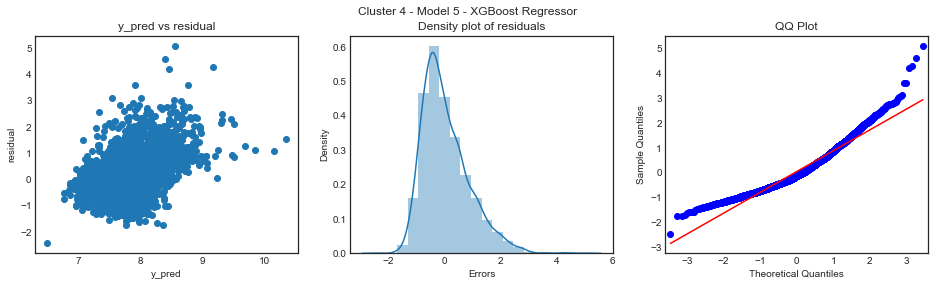

In [203]:
plot_errors(c4_model_1,cluster_4_X_train, cluster_4_y_train_scaled, 'Cluster 4 - Model 1 - Linear Regression')
plot_errors(c4_model_2,cluster_4_X_train, cluster_4_y_train_scaled, 'Cluster 4 - Model 2 - Decisiontree Regressor')
plot_errors(c4_model_3,cluster_4_X_train, cluster_4_y_train_scaled, 'Cluster 4 - Model 3 - RandomForest Regressor')
plot_errors(c4_model_4,cluster_4_X_train, cluster_4_y_train_scaled, 'Cluster 4 - Model 4 - KNN Regressor')
plot_errors(c4_model_5,cluster_4_X_train, cluster_4_y_train_scaled, 'Cluster 4 - Model 5 - XGBoost Regressor')

### Residual results for cluster 4

In [204]:

residual_results_c4_m1 = residual_errors(c4_model_1,cluster_4_X_train, cluster_4_y_train_scaled)
residual_results_c4_m2 = residual_errors(c4_model_2,cluster_4_X_train, cluster_4_y_train_scaled)
residual_results_c4_m3 = residual_errors(c4_model_3,cluster_4_X_train, cluster_4_y_train_scaled)
residual_results_c4_m4 = residual_errors(c4_model_4,cluster_4_X_train, cluster_4_y_train_scaled)
residual_results_c4_m5 = residual_errors(c4_model_5,cluster_4_X_train, cluster_4_y_train_scaled)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [205]:
print("Residual results for cluster 4 model 1 ")
print(residual_results_c4_m1.head())
print("\n")
print("Residual results for cluster 4 model 2 ")
print(residual_results_c4_m2.head())
print("\n")
print("Residual results for cluster 4 model 3 ")
print(residual_results_c4_m3.head())
print("\n")
print("Residual results for cluster 4 model 4 ")
print(residual_results_c4_m4.head())
print("\n")
print("Residual results for cluster 4 model 5 ")
print(residual_results_c4_m5.head())


Residual results for cluster 4 model 1 
         Actual  predicted  residual   shares  predicted_shares
id                                                             
12722  6.565265   7.010125 -0.444860    710.0       1107.793301
19161  9.717158   8.530191  1.186967  16600.0       5065.414569
5877   7.377759   7.437010 -0.059251   1600.0       1697.666574
27343  8.342840   7.778365  0.564475   4200.0       2388.366917
10313  7.377759   8.182705 -0.804946   1600.0       3578.522039


Residual results for cluster 4 model 2 
         Actual  predicted  residual   shares  predicted_shares
id                                                             
12722  6.565265   7.558100 -0.992836    710.0       1916.202194
19161  9.717158   8.095606  1.621552  16600.0       3280.024227
5877   7.377759   7.558100 -0.180342   1600.0       1916.202194
27343  8.342840   7.846271  0.496568   4200.0       2556.185408
10313  7.377759   8.095606 -0.717847   1600.0       3280.024227


Residual results for

### Regression results for cluster 4

In [206]:
regression_metrics(residual_results_c4_m1, 'Cluster 4 - Model 1 - Linear Regression')
print("\n")
regression_metrics(residual_results_c4_m2, 'Cluster 4 - Model 2 - Decisiontree Regressor')
print("\n")
regression_metrics(residual_results_c4_m3, 'Cluster 4 - Model 3 - RandomForest Regressor')
print("\n")
regression_metrics(residual_results_c4_m4, 'Cluster 4 - Model 4 - KNN Regressor')
print("\n")
regression_metrics(residual_results_c4_m5, 'Cluster 4 - Model 5 -XGBoost Regressor')

Regression results in log space        :  Cluster 4 - Model 1 - Linear Regression 

explained_variance:  0.0919
r2:  0.0919
MAE:  0.8077
MSE:  1.059
RMSE:  1.0291


Regression results for actual shares   :  Cluster 4 - Model 1 - Linear Regression 

explained_variance:  0.0052
r2:  -0.0148
MAE:  4722.8515
MSE:  546412804.3239
RMSE:  23375.4744


Regression results in log space        :  Cluster 4 - Model 2 - Decisiontree Regressor 

explained_variance:  0.042
r2:  0.042
MAE:  0.8376
MSE:  1.1173
RMSE:  1.057


Regression results for actual shares   :  Cluster 4 - Model 2 - Decisiontree Regressor 

explained_variance:  0.003
r2:  -0.0179
MAE:  4785.3311
MSE:  548080251.9767
RMSE:  23411.1139


Regression results in log space        :  Cluster 4 - Model 3 - RandomForest Regressor 

explained_variance:  0.1588
r2:  0.1588
MAE:  0.7846
MSE:  0.9811
RMSE:  0.9905


Regression results for actual shares   :  Cluster 4 - Model 3 - RandomForest Regressor 

explained_variance:  0.0127
r2:  -0.008

# Step 8: Making Predictions on Test Dataset

In [207]:
print(X_test.shape)
print(y_test.shape)

(5947, 58)
(5947, 1)


In [208]:
X_test[impute_cols] = imp.transform(X_test[impute_cols])

In [209]:
X_test_out_scaled=X_test.copy()

In [210]:
X_test_out_scaled[scale_num_cols] = pt.fit_transform(X_test_out_scaled[scale_num_cols])     

In [211]:
y_test_scaled=np.log(y_test)

In [212]:
X_test_out_scaled=X_test_out_scaled[X_train_out_scaled.columns]

In [213]:
X_test_out_scaled.shape

(5947, 55)

In [214]:
y_test_scaled.shape

(5947, 1)

In [215]:
reduced_data_test = pca_for_clusters.transform(X_test_out_scaled.iloc[:,:-2])


In [216]:
kmeans_test_preds = kmeans.predict(reduced_data_test)

In [217]:
pd.Series(kmeans_test_preds).value_counts()

0    1523
1    1500
2    1416
4     971
3     537
dtype: int64

In [218]:
cluster_0_X_test        = X_test_out_scaled[kmeans_test_preds == 0]
cluster_0_y_test_scaled = y_test_scaled[kmeans_test_preds == 0]
print("Cluster 0: ",cluster_0_X_test.shape)
print("Cluster 0: ",cluster_0_y_test_scaled.shape)

cluster_1_X_test        = X_test_out_scaled[kmeans_test_preds == 1]
cluster_1_y_test_scaled = y_test_scaled[kmeans_test_preds == 1]
print("Cluster 1: ",cluster_1_X_test.shape)
print("Cluster 1: ",cluster_1_y_test_scaled.shape)

cluster_2_X_test        = X_test_out_scaled[kmeans_test_preds == 2]
cluster_2_y_test_scaled = y_test_scaled[kmeans_test_preds == 2]
print("Cluster 2: ",cluster_2_X_test.shape)
print("Cluster 2: ",cluster_2_y_test_scaled.shape)

cluster_3_X_test        = X_test_out_scaled[kmeans_test_preds == 3]
cluster_3_y_test_scaled = y_test_scaled[kmeans_test_preds == 3]
print("Cluster 3: ",cluster_3_X_test.shape)
print("Cluster 3: ",cluster_3_y_test_scaled.shape)

cluster_4_X_test        = X_test_out_scaled[kmeans_test_preds == 4]
cluster_4_y_test_scaled = y_test_scaled[kmeans_test_preds == 4]
print("Cluster 4: ",cluster_4_X_test.shape)
print("Cluster 4: ",cluster_4_y_test_scaled.shape)

Cluster 0:  (1523, 55)
Cluster 0:  (1523, 1)
Cluster 1:  (1500, 55)
Cluster 1:  (1500, 1)
Cluster 2:  (1416, 55)
Cluster 2:  (1416, 1)
Cluster 3:  (537, 55)
Cluster 3:  (537, 1)
Cluster 4:  (971, 55)
Cluster 4:  (971, 1)


### Error plots for Cluster 0 on test data


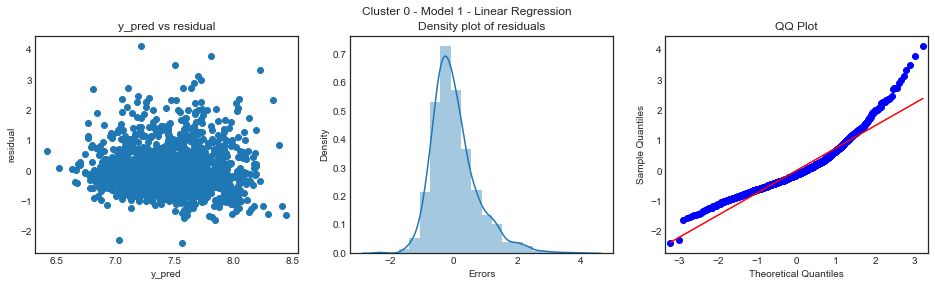

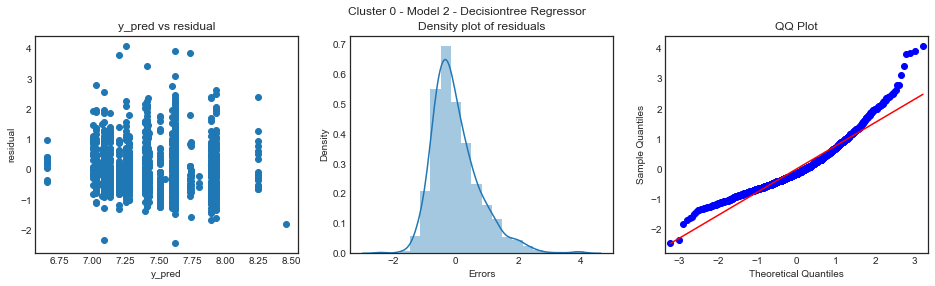

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


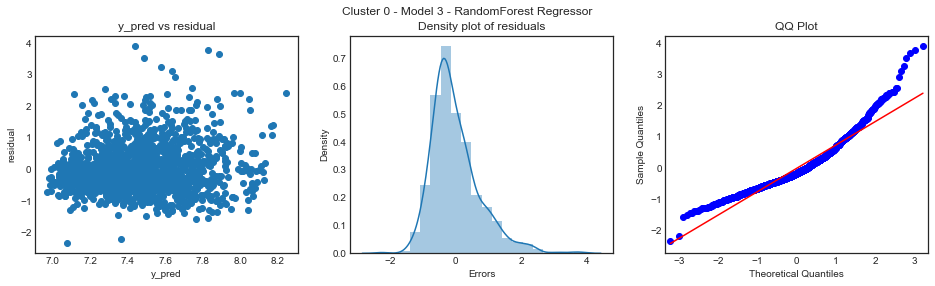

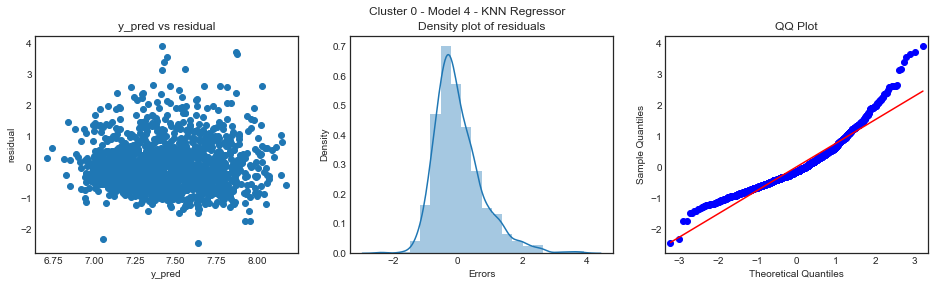

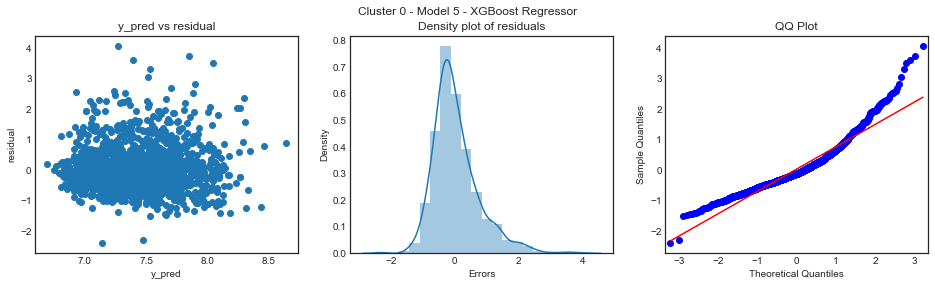

In [219]:
plot_errors(c0_model_1,cluster_0_X_test, cluster_0_y_test_scaled, 'Cluster 0 - Model 1 - Linear Regression')
plot_errors(c0_model_2,cluster_0_X_test, cluster_0_y_test_scaled, 'Cluster 0 - Model 2 - Decisiontree Regressor')
plot_errors(c0_model_3,cluster_0_X_test, cluster_0_y_test_scaled, 'Cluster 0 - Model 3 - RandomForest Regressor')
plot_errors(c0_model_4,cluster_0_X_test, cluster_0_y_test_scaled, 'Cluster 0 - Model 4 - KNN Regressor')
plot_errors(c0_model_5,cluster_0_X_test, cluster_0_y_test_scaled, 'Cluster 0 - Model 5 - XGBoost Regressor')


In [220]:
test_residual_results_c0_m1 = residual_errors(c0_model_1,cluster_0_X_test, cluster_0_y_test_scaled)
test_residual_results_c0_m2 = residual_errors(c0_model_2,cluster_0_X_test, cluster_0_y_test_scaled)
test_residual_results_c0_m3 = residual_errors(c0_model_3,cluster_0_X_test, cluster_0_y_test_scaled)
test_residual_results_c0_m4 = residual_errors(c0_model_4,cluster_0_X_test, cluster_0_y_test_scaled)
test_residual_results_c0_m5 = residual_errors(c0_model_5,cluster_0_X_test, cluster_0_y_test_scaled)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


### Regression metrics for Cluster 0 on test data 

In [221]:
regression_metrics(test_residual_results_c0_m1, 'Cluster 0 - Model 1 - Linear Regression')
print("\n")
regression_metrics(test_residual_results_c0_m2, 'Cluster 0 - Model 2 - Decisiontree Regressor')
print("\n")
regression_metrics(test_residual_results_c0_m3, 'Cluster 0 - Model 3 - RandomForest Regressor')
print("\n")
regression_metrics(test_residual_results_c0_m4, 'Cluster 0 - Model 4 - KNN Regressor')
print("\n")
regression_metrics(test_residual_results_c0_m5, 'Cluster 0 - Model 5 -XGBoost Regressor')

Regression results in log space        :  Cluster 0 - Model 1 - Linear Regression 

explained_variance:  0.183
r2:  0.182
MAE:  0.5449
MSE:  0.5449
RMSE:  0.7381


Regression results for actual shares   :  Cluster 0 - Model 1 - Linear Regression 

explained_variance:  0.0366
r2:  0.0067
MAE:  1719.2599
MSE:  34906791.0106
RMSE:  5908.1969


Regression results in log space        :  Cluster 0 - Model 2 - Decisiontree Regressor 

explained_variance:  0.1086
r2:  0.1084
MAE:  0.5821
MSE:  0.5939
RMSE:  0.7707


Regression results for actual shares   :  Cluster 0 - Model 2 - Decisiontree Regressor 

explained_variance:  0.0212
r2:  -0.0085
MAE:  1780.6551
MSE:  35440475.418
RMSE:  5953.1904


Regression results in log space        :  Cluster 0 - Model 3 - RandomForest Regressor 

explained_variance:  0.1602
r2:  0.16
MAE:  0.5673
MSE:  0.5595
RMSE:  0.748


Regression results for actual shares   :  Cluster 0 - Model 3 - RandomForest Regressor 

explained_variance:  0.0306
r2:  0.0019
MAE: 

### Error plots for Cluster 1 on test data


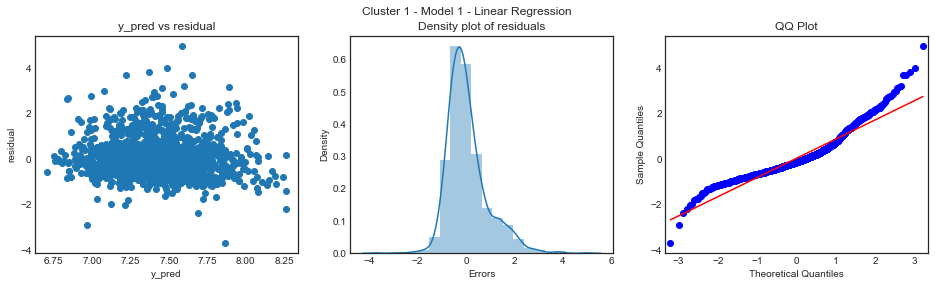

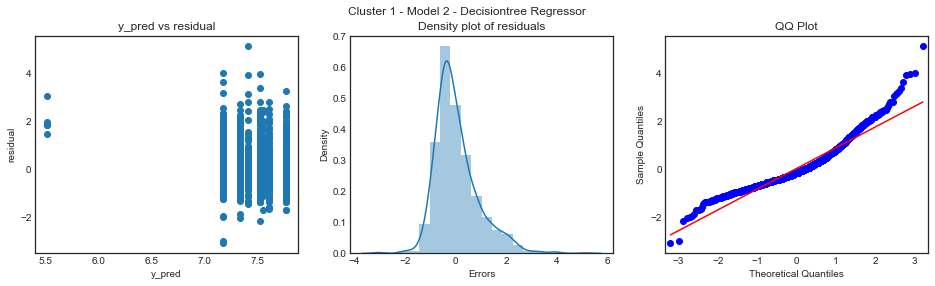

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


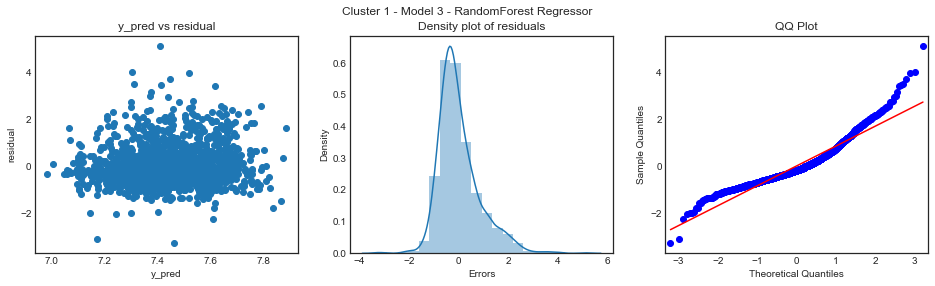

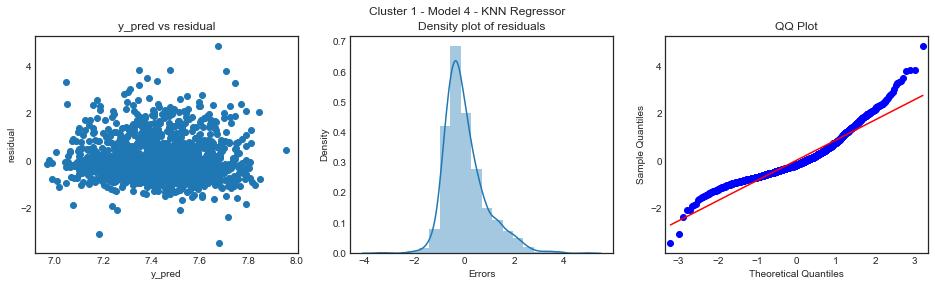

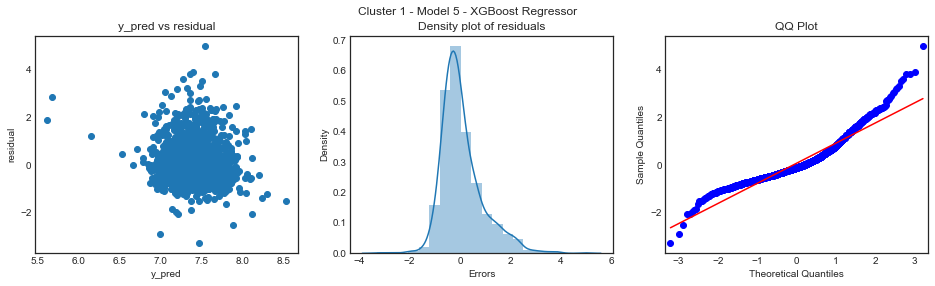

In [222]:
plot_errors(c1_model_1,cluster_1_X_test, cluster_1_y_test_scaled, 'Cluster 1 - Model 1 - Linear Regression')
plot_errors(c1_model_2,cluster_1_X_test, cluster_1_y_test_scaled, 'Cluster 1 - Model 2 - Decisiontree Regressor')
plot_errors(c1_model_3,cluster_1_X_test, cluster_1_y_test_scaled, 'Cluster 1 - Model 3 - RandomForest Regressor')
plot_errors(c1_model_4,cluster_1_X_test, cluster_1_y_test_scaled, 'Cluster 1 - Model 4 - KNN Regressor')
plot_errors(c1_model_5,cluster_1_X_test, cluster_1_y_test_scaled, 'Cluster 1 - Model 5 - XGBoost Regressor')


### Regression metrics for Cluster 1 on test data 

In [223]:
test_residual_results_c1_m1 = residual_errors(c1_model_1,cluster_1_X_test, cluster_1_y_test_scaled)
test_residual_results_c1_m2 = residual_errors(c1_model_2,cluster_1_X_test, cluster_1_y_test_scaled)
test_residual_results_c1_m3 = residual_errors(c1_model_3,cluster_1_X_test, cluster_1_y_test_scaled)
test_residual_results_c1_m4 = residual_errors(c1_model_4,cluster_1_X_test, cluster_1_y_test_scaled)
test_residual_results_c1_m5 = residual_errors(c1_model_5,cluster_1_X_test, cluster_1_y_test_scaled)

regression_metrics(test_residual_results_c1_m1, 'Cluster 1 - Model 1 - Linear Regression')
print("\n")
regression_metrics(test_residual_results_c1_m2, 'Cluster 1 - Model 2 - Decisiontree Regressor')
print("\n")
regression_metrics(test_residual_results_c1_m3, 'Cluster 1 - Model 3 - RandomForest Regressor')
print("\n")
regression_metrics(test_residual_results_c1_m4, 'Cluster 1 - Model 4 - KNN Regressor')
print("\n")
regression_metrics(test_residual_results_c1_m5, 'Cluster 1 - Model 5 -XGBoost Regressor')

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Regression results in log space        :  Cluster 1 - Model 1 - Linear Regression 

explained_variance:  0.0775
r2:  0.0748
MAE:  0.6135
MSE:  0.7121
RMSE:  0.8438


Regression results for actual shares   :  Cluster 1 - Model 1 - Linear Regression 

explained_variance:  0.0075
r2:  -0.0154
MAE:  2122.5729
MSE:  87614327.0331
RMSE:  9360.2525


Regression results in log space        :  Cluster 1 - Model 2 - Decisiontree Regressor 

explained_variance:  0.0292
r2:  0.0275
MAE:  0.642
MSE:  0.7484
RMSE:  0.8651


Regression results for actual shares   :  Cluster 1 - Model 2 - Decisiontree Regressor 

explained_variance:  0.0037
r2:  -0.0193
MAE:  2156.7329
MSE:  87947469.8195
RMSE:  9378.0312


Regression results in log space        :  Cluster 1 - Model 3 - RandomForest Regressor 

explained_variance:  0.0642
r2:  0.0635
MAE:  0.6283
MSE:  0.7207
RMSE:  0.8489


Regression results for actual shares   :  Cluster 1 - Model 3 - RandomForest Regressor 

explained_variance:  0.0038
r2:  -0.019

### Error plots for Cluster 2 on test data

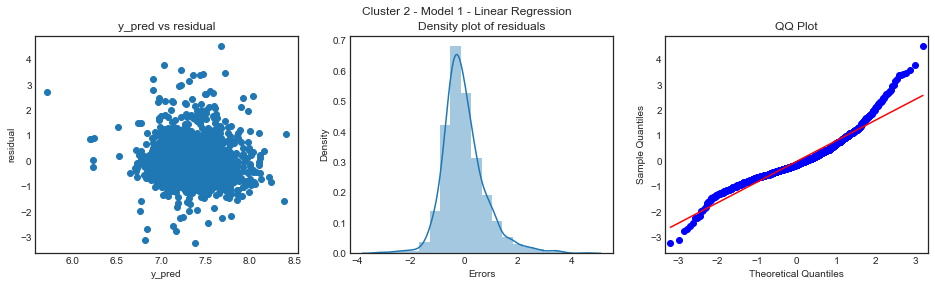

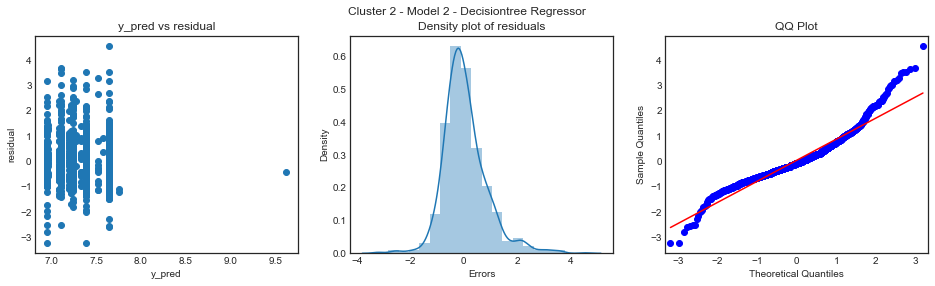

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  50 out of  50 | elapsed:    0.0s finished


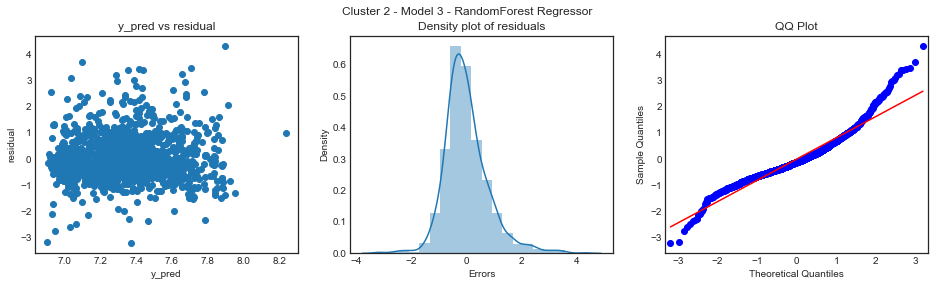

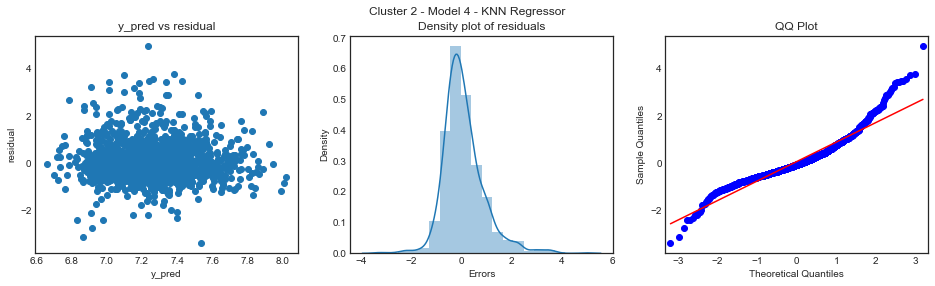

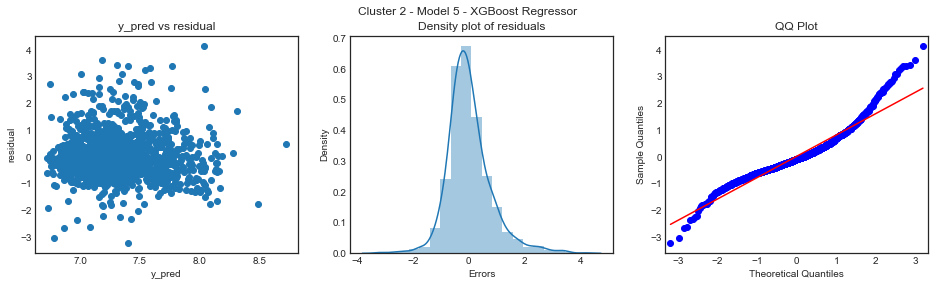

In [224]:
plot_errors(c2_model_1,cluster_2_X_test, cluster_2_y_test_scaled, 'Cluster 2 - Model 1 - Linear Regression')
plot_errors(c2_model_2,cluster_2_X_test, cluster_2_y_test_scaled, 'Cluster 2 - Model 2 - Decisiontree Regressor')
plot_errors(c2_model_3,cluster_2_X_test, cluster_2_y_test_scaled, 'Cluster 2 - Model 3 - RandomForest Regressor')
plot_errors(c2_model_4,cluster_2_X_test, cluster_2_y_test_scaled, 'Cluster 2 - Model 4 - KNN Regressor')
plot_errors(c2_model_5,cluster_2_X_test, cluster_2_y_test_scaled, 'Cluster 2 - Model 5 - XGBoost Regressor')

### Regression metrics for Cluster 2 on test data 

In [225]:

test_residual_results_c2_m1 = residual_errors(c2_model_1,cluster_2_X_test, cluster_2_y_test_scaled)
test_residual_results_c2_m2 = residual_errors(c2_model_2,cluster_2_X_test, cluster_2_y_test_scaled)
test_residual_results_c2_m3 = residual_errors(c2_model_3,cluster_2_X_test, cluster_2_y_test_scaled)
test_residual_results_c2_m4 = residual_errors(c2_model_4,cluster_2_X_test, cluster_2_y_test_scaled)
test_residual_results_c2_m5 = residual_errors(c2_model_5,cluster_2_X_test, cluster_2_y_test_scaled)


regression_metrics(test_residual_results_c2_m1, 'Cluster 2 - Model 1 - Linear Regression')
print("\n")
regression_metrics(test_residual_results_c2_m2, 'Cluster 2 - Model 2 - Decisiontree Regressor')
print("\n")
regression_metrics(test_residual_results_c2_m3, 'Cluster 2 - Model 3 - RandomForest Regressor')
print("\n")
regression_metrics(test_residual_results_c2_m4, 'Cluster 2 - Model 4 - KNN Regressor')
print("\n")
regression_metrics(test_residual_results_c2_m5, 'Cluster 2 - Model 5 -XGBoost Regressor')

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  50 out of  50 | elapsed:    0.0s finished


Regression results in log space        :  Cluster 2 - Model 1 - Linear Regression 

explained_variance:  0.0987
r2:  0.0986
MAE:  0.5886
MSE:  0.6587
RMSE:  0.8116


Regression results for actual shares   :  Cluster 2 - Model 1 - Linear Regression 

explained_variance:  0.0131
r2:  -0.0077
MAE:  1699.8752
MSE:  50222736.4126
RMSE:  7086.8002


Regression results in log space        :  Cluster 2 - Model 2 - Decisiontree Regressor 

explained_variance:  0.0565
r2:  0.0536
MAE:  0.5989
MSE:  0.6916
RMSE:  0.8316


Regression results for actual shares   :  Cluster 2 - Model 2 - Decisiontree Regressor 

explained_variance:  0.0092
r2:  -0.0161
MAE:  1709.3398
MSE:  50642707.1698
RMSE:  7116.369


Regression results in log space        :  Cluster 2 - Model 3 - RandomForest Regressor 

explained_variance:  0.1033
r2:  0.1033
MAE:  0.5906
MSE:  0.6553
RMSE:  0.8095


Regression results for actual shares   :  Cluster 2 - Model 3 - RandomForest Regressor 

explained_variance:  0.0161
r2:  -0.006

### Error plots for Cluster 3 on test data

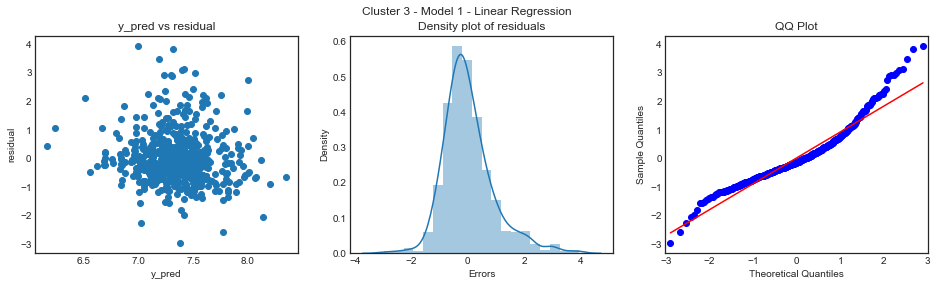

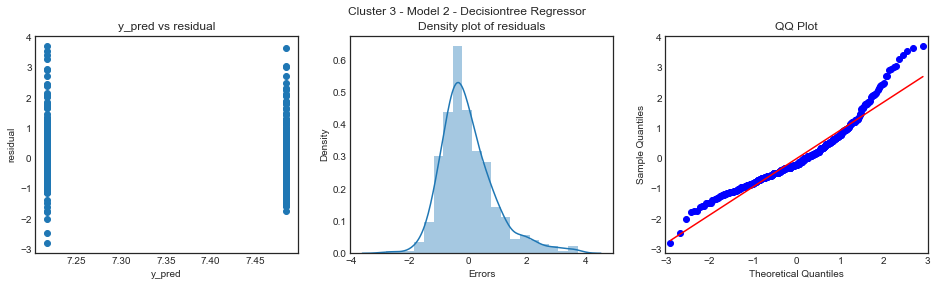

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


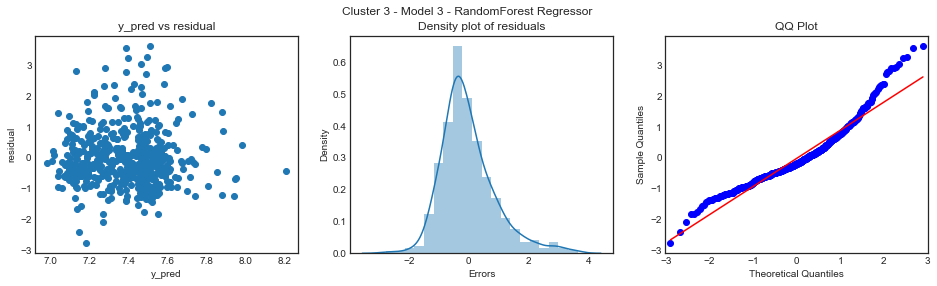

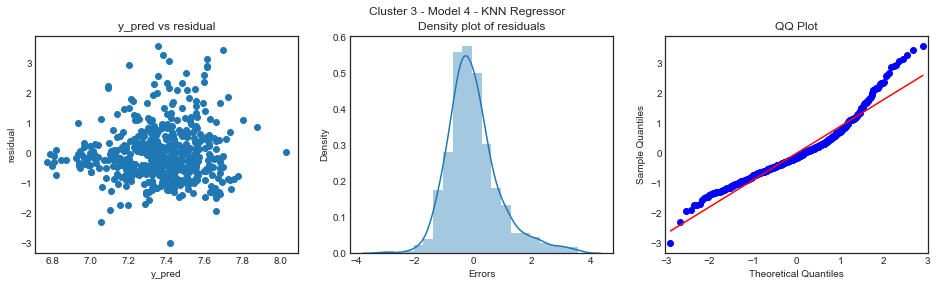

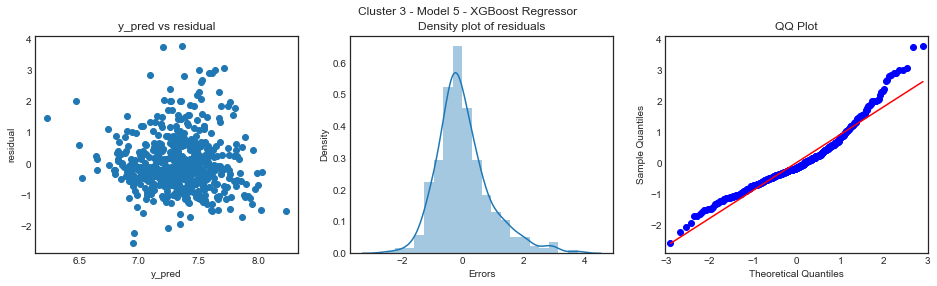

In [226]:
plot_errors(c3_model_1,cluster_3_X_test, cluster_3_y_test_scaled, 'Cluster 3 - Model 1 - Linear Regression')
plot_errors(c3_model_2,cluster_3_X_test, cluster_3_y_test_scaled, 'Cluster 3 - Model 2 - Decisiontree Regressor')
plot_errors(c3_model_3,cluster_3_X_test, cluster_3_y_test_scaled, 'Cluster 3 - Model 3 - RandomForest Regressor')
plot_errors(c3_model_4,cluster_3_X_test, cluster_3_y_test_scaled, 'Cluster 3 - Model 4 - KNN Regressor')
plot_errors(c3_model_5,cluster_3_X_test, cluster_3_y_test_scaled, 'Cluster 3 - Model 5 - XGBoost Regressor')

### Regression metrics for Cluster 3 on test data 


In [227]:
test_residual_results_c3_m1 = residual_errors(c3_model_1,cluster_3_X_test, cluster_3_y_test_scaled)
test_residual_results_c3_m2 = residual_errors(c3_model_2,cluster_3_X_test, cluster_3_y_test_scaled)
test_residual_results_c3_m3 = residual_errors(c3_model_3,cluster_3_X_test, cluster_3_y_test_scaled)
test_residual_results_c3_m4 = residual_errors(c3_model_4,cluster_3_X_test, cluster_3_y_test_scaled)
test_residual_results_c3_m5 = residual_errors(c3_model_5,cluster_3_X_test, cluster_3_y_test_scaled)


regression_metrics(test_residual_results_c3_m1, 'Cluster 3 - Model 1 - Linear Regression')
print("\n")
regression_metrics(test_residual_results_c3_m2, 'Cluster 3 - Model 2 - Decisiontree Regressor')
print("\n")
regression_metrics(test_residual_results_c3_m3, 'Cluster 3 - Model 3 - RandomForest Regressor')
print("\n")
regression_metrics(test_residual_results_c3_m4, 'Cluster 3 - Model 4 - KNN Regressor')
print("\n")
regression_metrics(test_residual_results_c3_m5, 'Cluster 3 - Model 5 -XGBoost Regressor')

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Regression results in log space        :  Cluster 3 - Model 1 - Linear Regression 

explained_variance:  0.0518
r2:  0.0512
MAE:  0.6585
MSE:  0.8187
RMSE:  0.9048


Regression results for actual shares   :  Cluster 3 - Model 1 - Linear Regression 

explained_variance:  0.0088
r2:  -0.0381
MAE:  2063.8638
MSE:  39058842.9652
RMSE:  6249.7074


Regression results in log space        :  Cluster 3 - Model 2 - Decisiontree Regressor 

explained_variance:  -0.0103
r2:  -0.0103
MAE:  0.6963
MSE:  0.8718
RMSE:  0.9337


Regression results for actual shares   :  Cluster 3 - Model 2 - Decisiontree Regressor 

explained_variance:  -0.0025
r2:  -0.0503
MAE:  2111.3624
MSE:  39517855.0573
RMSE:  6286.3229


Regression results in log space        :  Cluster 3 - Model 3 - RandomForest Regressor 

explained_variance:  0.0384
r2:  0.0381
MAE:  0.6824
MSE:  0.83
RMSE:  0.9111


Regression results for actual shares   :  Cluster 3 - Model 3 - RandomForest Regressor 

explained_variance:  0.0081
r2:  -0.0

### Error plots for Cluster 4 on test data


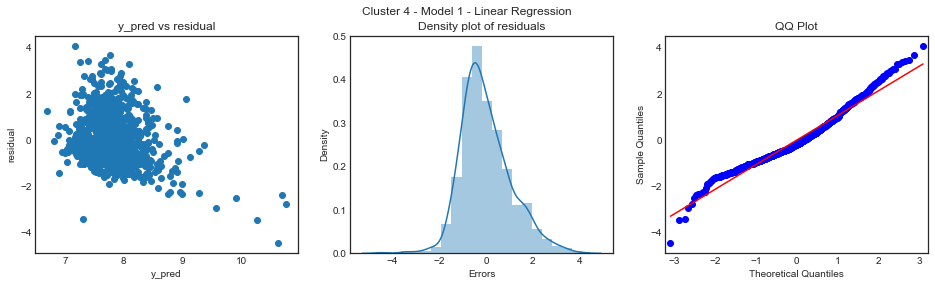

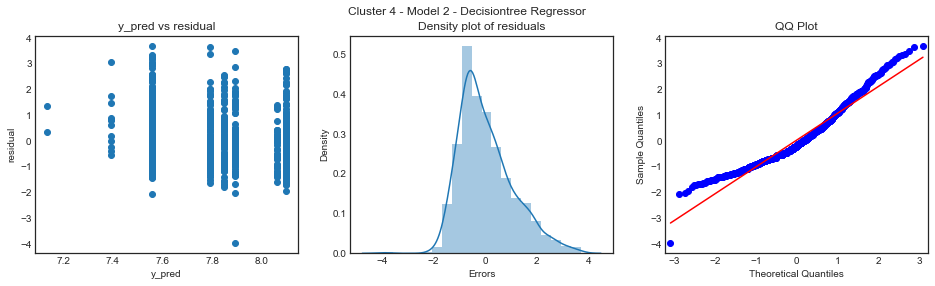

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


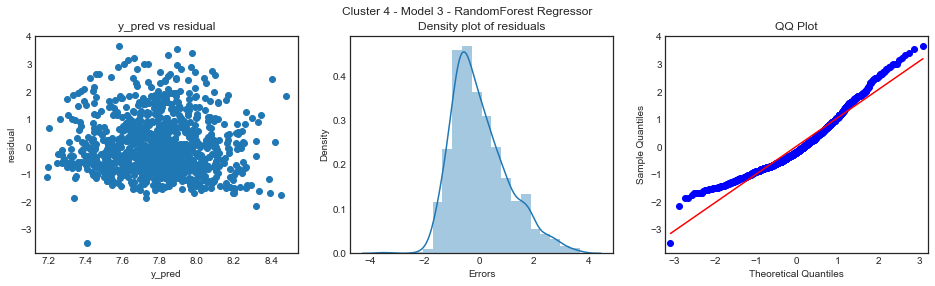

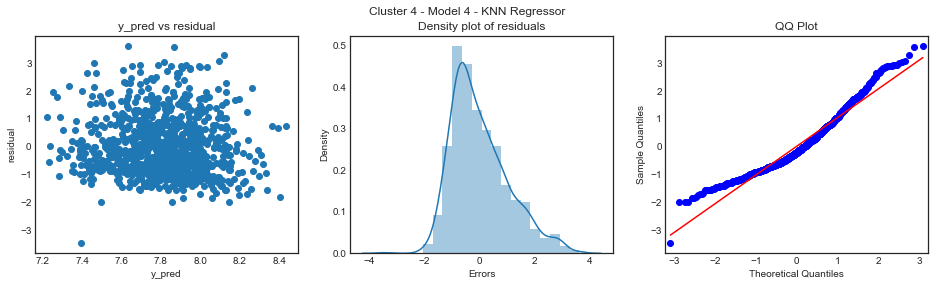

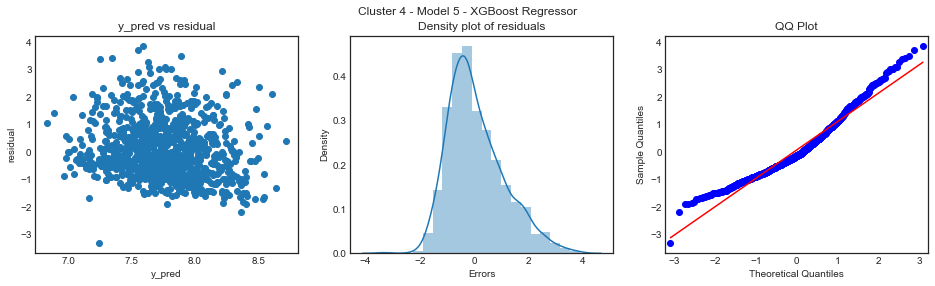

In [228]:
plot_errors(c4_model_1,cluster_4_X_test, cluster_4_y_test_scaled, 'Cluster 4 - Model 1 - Linear Regression')
plot_errors(c4_model_2,cluster_4_X_test, cluster_4_y_test_scaled, 'Cluster 4 - Model 2 - Decisiontree Regressor')
plot_errors(c4_model_3,cluster_4_X_test, cluster_4_y_test_scaled, 'Cluster 4 - Model 3 - RandomForest Regressor')
plot_errors(c4_model_4,cluster_4_X_test, cluster_4_y_test_scaled, 'Cluster 4 - Model 4 - KNN Regressor')
plot_errors(c4_model_5,cluster_4_X_test, cluster_4_y_test_scaled, 'Cluster 4 - Model 5 - XGBoost Regressor')

### Regression metrics for Cluster 4 on test data 


In [229]:
test_residual_results_c4_m1 = residual_errors(c4_model_1,cluster_4_X_test, cluster_4_y_test_scaled)
test_residual_results_c4_m2 = residual_errors(c4_model_2,cluster_4_X_test, cluster_4_y_test_scaled)
test_residual_results_c4_m3 = residual_errors(c4_model_3,cluster_4_X_test, cluster_4_y_test_scaled)
test_residual_results_c4_m4 = residual_errors(c4_model_4,cluster_4_X_test, cluster_4_y_test_scaled)
test_residual_results_c4_m5 = residual_errors(c4_model_5,cluster_4_X_test, cluster_4_y_test_scaled)


regression_metrics(test_residual_results_c4_m1, 'Cluster 4 - Model 1 - Linear Regression')
print("\n")
regression_metrics(test_residual_results_c4_m2, 'Cluster 4 - Model 2 - Decisiontree Regressor')
print("\n")
regression_metrics(test_residual_results_c4_m3, 'Cluster 4 - Model 3 - RandomForest Regressor')
print("\n")
regression_metrics(test_residual_results_c4_m4, 'Cluster 4 - Model 4 - KNN Regressor')
print("\n")
regression_metrics(test_residual_results_c4_m5, 'Cluster 4 - Model 5 -XGBoost Regressor')

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


Regression results in log space        :  Cluster 4 - Model 1 - Linear Regression 

explained_variance:  -0.0446
r2:  -0.0447
MAE:  0.8292
MSE:  1.1415
RMSE:  1.0684


Regression results for actual shares   :  Cluster 4 - Model 1 - Linear Regression 

explained_variance:  -0.092
r2:  -0.1489
MAE:  4003.632
MSE:  92563443.339
RMSE:  9620.9897


Regression results in log space        :  Cluster 4 - Model 2 - Decisiontree Regressor 

explained_variance:  -0.0003
r2:  -0.0013
MAE:  0.8245
MSE:  1.0941
RMSE:  1.046


Regression results for actual shares   :  Cluster 4 - Model 2 - Decisiontree Regressor 

explained_variance:  0.0017
r2:  -0.0751
MAE:  3795.9804
MSE:  86612087.5713
RMSE:  9306.5615


Regression results in log space        :  Cluster 4 - Model 3 - RandomForest Regressor 

explained_variance:  0.0301
r2:  0.029
MAE:  0.8133
MSE:  1.0609
RMSE:  1.03


Regression results for actual shares   :  Cluster 4 - Model 3 - RandomForest Regressor 

explained_variance:  0.0095
r2:  -0.0672

## Linear Regression Model


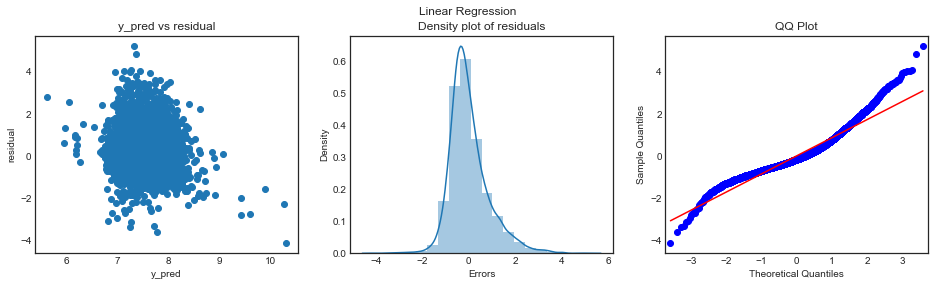

In [230]:
plot_errors(lm_3, sm.add_constant(X_test_out_scaled)[X_train_3.columns], y_test_scaled, 'Linear Regression')

In [231]:
test_residual_results_lr = residual_errors(lm_3, sm.add_constant(X_test_out_scaled)[X_train_3.columns], y_test_scaled)

In [232]:
test_residual_results_lr['predicted_shares'] = np.exp(test_residual_results_lr['predicted'].values)

In [233]:
regression_metrics(test_residual_results_lr, 'Linear Regression')

Regression results in log space        :  Linear Regression 

explained_variance:  0.1043
r2:  0.1041
MAE:  0.6327
MSE:  0.7363
RMSE:  0.8581


Regression results for actual shares   :  Linear Regression 

explained_variance:  0.0086
r2:  -0.0219
MAE:  2204.9424
MSE:  61128879.1532
RMSE:  7818.496


In [234]:
test_residual_results_lr.head()

,Actual,predicted,residual,shares,predicted_shares
id,,,,,
7812,7.003065,7.649001,-0.645935,1100.0,2098.547829
5143,6.740519,6.973227,-0.232708,846.0,1067.662595
17162,7.003065,7.427092,-0.424027,1100.0,1680.912877
7573,8.039157,7.635410,0.403747,3100.0,2070.219623
27622,8.101678,7.466232,0.635445,3300.0,1748.008446


## Lasso Regression with polynomial features

In [235]:
X_test_scaled_polynomial= poly.transform(X_test_out_scaled)

In [236]:
X_test_scaled_polynomial = pd.DataFrame(X_test_scaled_polynomial, columns = poly.get_feature_names(X_train_out_scaled.columns))

In [237]:
X_test_scaled_polynomial.shape

(5947, 1596)

In [238]:
X_test_scaled_polynomial.head()

1  n_tokens_title  n_tokens_content  n_unique_tokens  \
0  1.0       -0.146021         -0.606500        -0.480602   
1  1.0       -0.627921         -0.333914         0.230680   
2  1.0       -0.146021          0.436984        -0.883593   
3  1.0        0.322098         -0.537107         0.006558   
4  1.0       -1.125454          0.497131        -0.814938   

   n_non_stop_unique_tokens  num_hrefs  num_self_hrefs  num_imgs  num_videos  \
0                 -1.409618   1.041374        0.660940 -1.685402   -0.739097   
1                 -0.072972  -0.115914       -1.948851 -0.223375   -0.739097   
2                 -1.148709  -1.270326       -0.144718  1.633371    1.093968   
3                 -0.099368   0.158694        1.384228 -0.223375   -0.739097   
4                 -0.960405  -0.115914        1.180465  1.527244   -0.739097   

   average_token_length  num_keywords  data_channel_is_lifestyle  \
0             -0.354277      1.494930                        0.0   
1              0.042574     -1.150154                        0.0   
2             -0.167442     -0.634069                        0.0   
3             -0.502956      1.494930                        0.0   
4             -0.660407     -0.110778                        0.0   

   data_channel_is_entertainment  data_channel_is_bus  data_channel_is_socmed  \
0                            0.0                  0.0                     0.0   
1                            0.0                  0.0                     0.0   
2                            0.0                  0.0                     0.0   
3                            0.0                  0.0                     0.0   
4                            0.0                  0.0                     0.0   

   data_channel_is_tech  data_channel_is_world  kw_min_min  kw_max_min  \
0                   0.0                    0.0    0.912546    0.974905   
1                   0.0                    1.0   -0.798905   -3.500554   
2                   1.0                    0.0   -0.798905   -0.341681   
3                   1.0                    0.0    1.819684   -0.354606   
4                   1.0                    0.0    0.912546    0.283919   

   kw_avg_min  kw_min_max  kw_max_max  kw_avg_max  kw_min_avg  kw_max_avg  \
0    0.322236   -1.122966    0.498962   -0.217783   -1.157861    0.695324   
1   -3.322971    1.138178    0.498962    0.241099    0.919956   -0.691065   
2   -0.745417    0.731480    0.498962    1.685935    0.687461   -0.436466   
3    0.448466   -1.122966   -2.768288   -1.941567   -1.157861   -0.244022   
4    0.333812    0.671683    0.498962   -0.446672    0.868184   -0.774378   

   kw_avg_avg  self_reference_min_shares  self_reference_max_shares  \
0    0.901130                   0.304136                  -0.101501   
1   -0.366375                  -1.746643                  -1.774152   
2   -0.055802                   0.382186                  -0.039223   
3   -0.683514                   0.073767                   0.067115   
4   -0.470730                   0.246425                   1.147900   

   self_reference_avg_sharess  weekday_is_monday  weekday_is_tuesday  \
0                    0.016432                0.0                 1.0   
1                   -1.756580                0.0                 0.0   
2                    0.086022                0.0                 0.0   
3                    0.177503                0.0                 0.0   
4                    0.846779                0.0                 0.0   

   weekday_is_wednesday  weekday_is_thursday  weekday_is_friday  \
0                   0.0                  0.0                0.0   
1                   0.0                  0.0                1.0   
2                   1.0                  0.0                0.0   
3                   0.0                  1.0                0.0   
4                   0.0                  0.0                1.0   

   weekday_is_saturday  weekday_is_sunday    LDA_00    LDA_01    LDA_02  \
0              

In [239]:
lasso_best

Lasso(alpha=0.01)

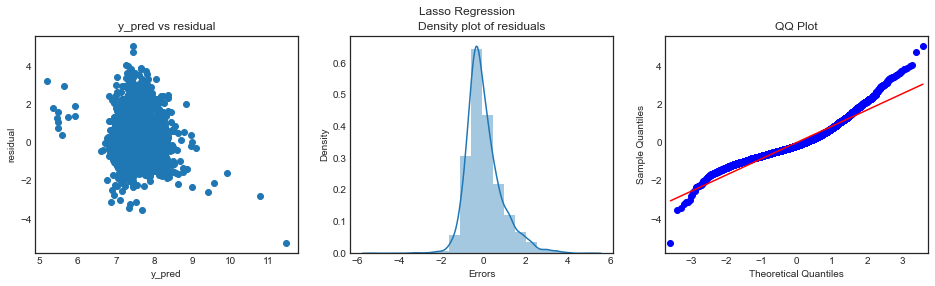

In [240]:
plot_errors(lasso_best, X_test_scaled_polynomial, y_test_scaled, 'Lasso Regression')

In [241]:
test_residual_results_lasso = residual_errors(lasso_best, X_test_scaled_polynomial, y_test_scaled)

In [242]:
regression_metrics(test_residual_results_lasso, 'Linear Regression')

Regression results in log space        :  Linear Regression 

explained_variance:  0.1108
r2:  0.1105
MAE:  0.6313
MSE:  0.731
RMSE:  0.855


Regression results for actual shares   :  Linear Regression 

explained_variance:  -0.0152
r2:  -0.0457
MAE:  2211.1001
MSE:  62555836.3574
RMSE:  7909.2248


# Step 9: Alternative models /PCA

# Step 10: Final Submission

### Stacking/ Blending in Clusters

### Cluster 0 

In [243]:
cluster_0_test_stack = pd.DataFrame()
cluster_0_test_stack['m1']    = test_residual_results_c0_m1['predicted']
cluster_0_test_stack['m2']    = test_residual_results_c0_m2['predicted']
cluster_0_test_stack['m3']    = test_residual_results_c0_m3['predicted']
cluster_0_test_stack['m4']    = test_residual_results_c0_m4['predicted']
cluster_0_test_stack['m5']    = test_residual_results_c0_m5['predicted']
cluster_0_test_stack['Actual'] = test_residual_results_c0_m1['Actual']

In [244]:
cluster_0_test_stack.head()

,m1,m2,m3,m4,m5,Actual
id,,,,,,
7812,7.967014,7.393447,7.638176,7.609068,7.668400,7.003065
17162,7.271460,7.410690,7.478410,7.383539,7.330697,7.003065
27622,7.433557,7.410690,7.462241,7.612894,7.395176,8.101678
23829,7.413860,7.410690,7.329461,7.279102,7.235356,7.003065
1768,7.376640,7.248430,7.433392,7.357654,7.258118,8.699515


In [245]:
from sklearn.linear_model import ElasticNet

In [246]:
c0_stack_pipeline = Pipeline([("c0_elasticnet", ElasticNet(random_state=0))])

c0_stack_pipeline_params = {'c0_elasticnet__l1_ratio':[0,0.2,0.5,0.8,1],
                            'c0_elasticnet__alpha':[0.001,0.01,0.1,],
                           'c0_elasticnet__fit_intercept':[True,False]}

c0_stack_grid_pipeline = GridSearchCV(c0_stack_pipeline, c0_stack_pipeline_params, scoring= 'neg_mean_squared_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c0_stack_grid_pipeline.fit(cluster_0_test_stack[['m1','m2','m3','m4','m5']],cluster_0_test_stack['Actual'])
print(c0_stack_grid_pipeline.best_params_)
c0_stack_model = c0_stack_grid_pipeline.best_estimator_
print(c0_stack_grid_pipeline.best_score_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
{'c0_elasticnet__alpha': 0.01, 'c0_elasticnet__fit_intercept': True, 'c0_elasticnet__l1_ratio': 0}
-0.5331633829543535


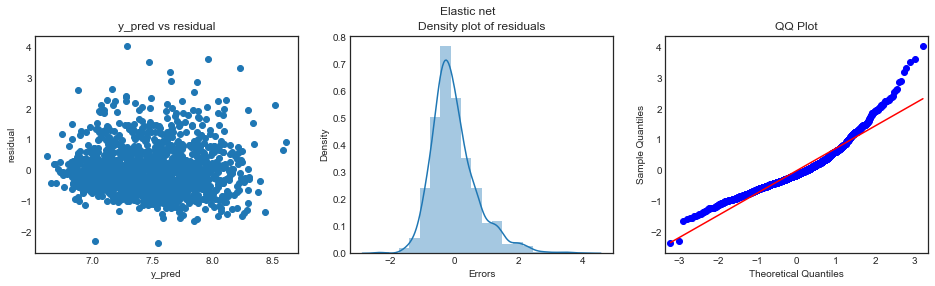

In [247]:
plot_errors(c0_stack_model, cluster_0_test_stack[['m1','m2','m3','m4','m5']], cluster_0_test_stack['Actual'], 'Elastic net')

In [248]:
test_residual_results_stack_c0 = residual_errors(c0_stack_model, cluster_0_test_stack[['m1','m2','m3','m4','m5']], cluster_0_test_stack['Actual'])

In [249]:
regression_metrics(test_residual_results_stack_c0, 'Stacking cluster 0')

Regression results in log space        :  Stacking cluster 0 

explained_variance:  0.2063
r2:  0.2063
MAE:  0.539
MSE:  0.5287
RMSE:  0.7271


Regression results for actual shares   :  Stacking cluster 0 

explained_variance:  0.0453
r2:  0.019
MAE:  1708.0774
MSE:  34473761.18
RMSE:  5871.436


### cluster 1

In [250]:
cluster_1_test_stack = pd.DataFrame()
cluster_1_test_stack['m1']    = test_residual_results_c1_m1['predicted']
cluster_1_test_stack['m2']    = test_residual_results_c1_m2['predicted']
cluster_1_test_stack['m3']    = test_residual_results_c1_m3['predicted']
cluster_1_test_stack['m4']    = test_residual_results_c1_m4['predicted']
cluster_1_test_stack['m5']    = test_residual_results_c1_m5['predicted']
cluster_1_test_stack['Actual'] = test_residual_results_c1_m1['Actual']

In [251]:
cluster_1_test_stack.head()


,m1,m2,m3,m4,m5,Actual
id,,,,,,
26779,7.449107,7.334797,7.573734,7.662489,8.045534,9.071078
14461,7.996062,7.334797,7.464753,7.738238,7.786949,7.863267
28997,7.288359,7.334797,7.409611,7.279535,7.301172,6.859615
23852,7.407921,7.765214,7.649794,7.477279,7.786570,7.549609
18361,7.453240,7.334797,7.360035,7.381794,7.374318,8.748305


In [252]:
c1_stack_pipeline = Pipeline([("c1_elasticnet", ElasticNet(random_state=0))])

c1_stack_pipeline_params = {'c1_elasticnet__l1_ratio':[0,0.2,0.5,0.8,1],
                            'c1_elasticnet__alpha':[0.001,0.01,0.1,],
                           'c1_elasticnet__fit_intercept':[True,False]}

c1_stack_grid_pipeline = GridSearchCV(c1_stack_pipeline, c1_stack_pipeline_params, scoring= 'neg_mean_squared_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c1_stack_grid_pipeline.fit(cluster_1_test_stack[['m1','m2','m3','m4','m5']],cluster_1_test_stack['Actual'])
print(c1_stack_grid_pipeline.best_params_)
c1_stack_model = c1_stack_grid_pipeline.best_estimator_
print(c1_stack_grid_pipeline.best_score_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
{'c1_elasticnet__alpha': 0.01, 'c1_elasticnet__fit_intercept': True, 'c1_elasticnet__l1_ratio': 0}
-0.7031944507717182


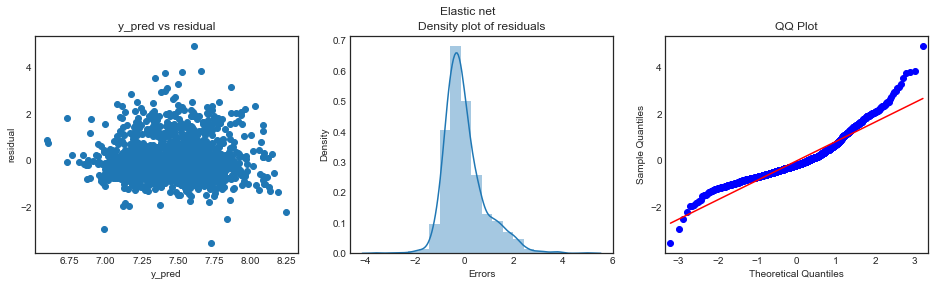

In [253]:
plot_errors(c1_stack_model, cluster_1_test_stack[['m1','m2','m3','m4','m5']], cluster_1_test_stack['Actual'], 'Elastic net')

In [254]:
test_residual_results_stack_c1 = residual_errors(c1_stack_model, cluster_1_test_stack[['m1','m2','m3','m4','m5']], cluster_1_test_stack['Actual'])



In [255]:

regression_metrics(test_residual_results_stack_c1, 'Stacking cluster 1')

Regression results in log space        :  Stacking cluster 1 

explained_variance:  0.0922
r2:  0.0922
MAE:  0.6171
MSE:  0.6986
RMSE:  0.8358


Regression results for actual shares   :  Stacking cluster 1 

explained_variance:  0.008
r2:  -0.0126
MAE:  2125.2726
MSE:  87371009.8352
RMSE:  9347.2461


### cluster 2


In [256]:
cluster_2_test_stack = pd.DataFrame()
cluster_2_test_stack['m1']    = test_residual_results_c2_m1['predicted']
cluster_2_test_stack['m2']    = test_residual_results_c2_m2['predicted']
cluster_2_test_stack['m3']    = test_residual_results_c2_m3['predicted']
cluster_2_test_stack['m4']    = test_residual_results_c2_m4['predicted']
cluster_2_test_stack['m5']    = test_residual_results_c2_m5['predicted']
cluster_2_test_stack['Actual'] = test_residual_results_c2_m1['Actual']

In [257]:
cluster_2_test_stack.head()

,m1,m2,m3,m4,m5,Actual
id,,,,,,
5143,7.019704,6.953546,6.987840,6.895456,6.872266,6.740519
26154,7.130721,7.085345,6.989019,6.962687,6.942667,6.678342
11150,6.990327,6.953546,7.029520,7.021630,6.901373,6.625392
15583,7.063844,7.108372,7.028965,7.125637,6.899844,6.444131
8253,7.402480,7.328895,7.470357,7.275877,7.363642,6.352629


In [258]:
c2_stack_pipeline = Pipeline([("c2_elasticnet", ElasticNet(random_state=0))])

c2_stack_pipeline_params = {'c2_elasticnet__l1_ratio':[0,0.2,0.5,0.8,1],
                            'c2_elasticnet__alpha':[0.001,0.01,0.1,],
                           'c2_elasticnet__fit_intercept':[True,False]}

c2_stack_grid_pipeline = GridSearchCV(c2_stack_pipeline, c2_stack_pipeline_params, scoring= 'neg_mean_squared_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c2_stack_grid_pipeline.fit(cluster_2_test_stack[['m1','m2','m3','m4','m5']],cluster_2_test_stack['Actual'])
print(c2_stack_grid_pipeline.best_params_)
c2_stack_model = c2_stack_grid_pipeline.best_estimator_
print(c2_stack_grid_pipeline.best_score_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
{'c2_elasticnet__alpha': 0.01, 'c2_elasticnet__fit_intercept': True, 'c2_elasticnet__l1_ratio': 0}
-0.6377697637618768


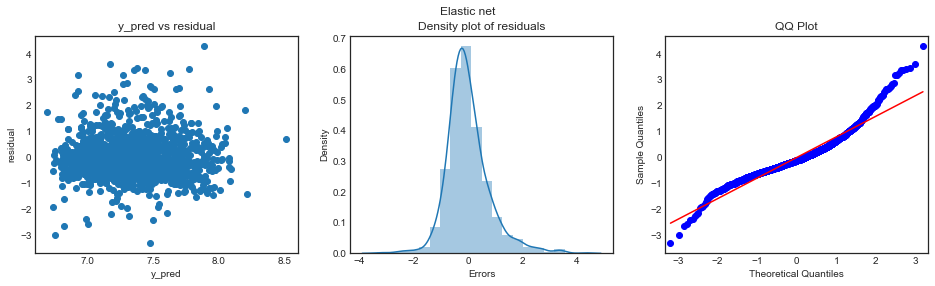

In [259]:
plot_errors(c2_stack_model, cluster_2_test_stack[['m1','m2','m3','m4','m5']], cluster_2_test_stack['Actual'], 'Elastic net')



In [260]:
test_residual_results_stack_c2 = residual_errors(c2_stack_model, cluster_2_test_stack[['m1','m2','m3','m4','m5']], cluster_2_test_stack['Actual'])

In [261]:

regression_metrics(test_residual_results_stack_c2, 'Stacking cluster 2')

Regression results in log space        :  Stacking cluster 2 

explained_variance:  0.1346
r2:  0.1346
MAE:  0.5722
MSE:  0.6324
RMSE:  0.7952


Regression results for actual shares   :  Stacking cluster 2 

explained_variance:  0.0184
r2:  -0.0026
MAE:  1673.568
MSE:  49969562.7446
RMSE:  7068.9152


### cluster 3

In [262]:
cluster_3_test_stack = pd.DataFrame()
cluster_3_test_stack['m1']    = test_residual_results_c3_m1['predicted']
cluster_3_test_stack['m2']    = test_residual_results_c3_m2['predicted']
cluster_3_test_stack['m3']    = test_residual_results_c3_m3['predicted']
cluster_3_test_stack['m4']    = test_residual_results_c3_m4['predicted']
cluster_3_test_stack['m5']    = test_residual_results_c3_m5['predicted']
cluster_3_test_stack['Actual'] = test_residual_results_c3_m1['Actual']

In [263]:

cluster_3_test_stack.head()

,m1,m2,m3,m4,m5,Actual
id,,,,,,
7573,7.384658,7.484338,7.472912,7.508765,7.505184,8.039157
7837,7.316731,7.484338,7.258416,7.334759,7.169065,7.377759
1428,8.140176,7.216858,7.519461,7.483255,7.610046,6.100319
12658,7.332871,7.216858,7.290732,7.464790,7.327768,7.740664
15991,7.551335,7.484338,7.495850,7.428079,7.444756,7.170120


In [264]:
c3_stack_pipeline = Pipeline([("c3_elasticnet", ElasticNet(random_state=0))])

c3_stack_pipeline_params = {'c3_elasticnet__l1_ratio':[0,0.2,0.5,0.8,1],
                            'c3_elasticnet__alpha':[0.001,0.01,0.1,],
                           'c3_elasticnet__fit_intercept':[True,False]}

c3_stack_grid_pipeline = GridSearchCV(c3_stack_pipeline, c3_stack_pipeline_params, scoring= 'neg_mean_squared_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c3_stack_grid_pipeline.fit(cluster_3_test_stack[['m1','m2','m3','m4','m5']],cluster_3_test_stack['Actual'])
print(c3_stack_grid_pipeline.best_params_)
c3_stack_model = c3_stack_grid_pipeline.best_estimator_
print(c3_stack_grid_pipeline.best_score_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
{'c3_elasticnet__alpha': 0.001, 'c3_elasticnet__fit_intercept': True, 'c3_elasticnet__l1_ratio': 0.5}
-0.7946114790508294


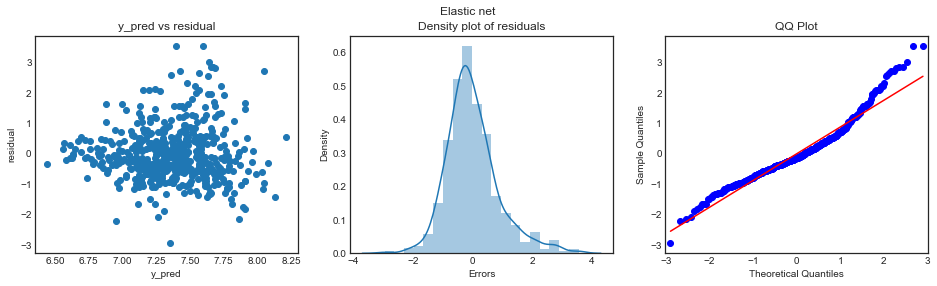

In [265]:
plot_errors(c3_stack_model, cluster_3_test_stack[['m1','m2','m3','m4','m5']], cluster_3_test_stack['Actual'], 'Elastic net')

In [266]:
test_residual_results_stack_c3 = residual_errors(c3_stack_model, cluster_3_test_stack[['m1','m2','m3','m4','m5']], cluster_3_test_stack['Actual'])



In [267]:

regression_metrics(test_residual_results_stack_c3, 'Stacking cluster 3')

Regression results in log space        :  Stacking cluster 3 

explained_variance:  0.1081
r2:  0.1081
MAE:  0.6502
MSE:  0.7696
RMSE:  0.8773


Regression results for actual shares   :  Stacking cluster 3 

explained_variance:  0.0273
r2:  -0.017
MAE:  2055.0015
MSE:  38263028.4693
RMSE:  6185.7116


### cluster 4

In [268]:
cluster_4_test_stack = pd.DataFrame()
cluster_4_test_stack['m1']    = test_residual_results_c4_m1['predicted']
cluster_4_test_stack['m2']    = test_residual_results_c4_m2['predicted']
cluster_4_test_stack['m3']    = test_residual_results_c4_m3['predicted']
cluster_4_test_stack['m4']    = test_residual_results_c4_m4['predicted']
cluster_4_test_stack['m5']    = test_residual_results_c4_m5['predicted']
cluster_4_test_stack['Actual'] = test_residual_results_c4_m1['Actual']


In [269]:

cluster_4_test_stack.head()


,m1,m2,m3,m4,m5,Actual
id,,,,,,
2933,7.822025,7.558100,7.739441,7.904623,7.609733,6.656727
15691,8.456587,8.095606,8.208023,7.894014,8.207311,7.549609
16919,7.506033,7.558100,7.617501,7.819325,7.381501,7.438384
17994,7.295533,7.558100,7.519514,7.727610,7.613980,7.740664
8465,7.718843,8.095606,7.845988,7.791781,7.738005,8.665613


In [270]:
c4_stack_pipeline = Pipeline([("c4_elasticnet", ElasticNet(random_state=0))])

c4_stack_pipeline_params = {'c4_elasticnet__l1_ratio':[0,0.2,0.5,0.8,1],
                            'c4_elasticnet__alpha':[0.001,0.01,0.1,],
                           'c4_elasticnet__fit_intercept':[True,False]}

c4_stack_grid_pipeline = GridSearchCV(c4_stack_pipeline, c4_stack_pipeline_params, scoring= 'neg_mean_squared_error', 
                        cv = 5, 
                        return_train_score=True,
                        n_jobs=-1,
                        verbose = 1)
# fit
c4_stack_grid_pipeline.fit(cluster_4_test_stack[['m1','m2','m3','m4','m5']],cluster_4_test_stack['Actual'])
print(c4_stack_grid_pipeline.best_params_)
c4_stack_model = c4_stack_grid_pipeline.best_estimator_
print(c4_stack_grid_pipeline.best_score_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
{'c4_elasticnet__alpha': 0.1, 'c4_elasticnet__fit_intercept': False, 'c4_elasticnet__l1_ratio': 0}
-1.065807575401534


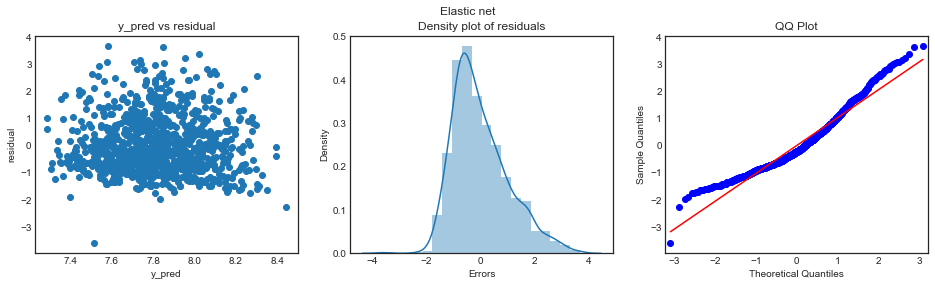

In [271]:
plot_errors(c4_stack_model, cluster_4_test_stack[['m1','m2','m3','m4','m5']], cluster_4_test_stack['Actual'], 'Elastic net')



In [272]:
test_residual_results_stack_c4 = residual_errors(c4_stack_model, cluster_4_test_stack[['m1','m2','m3','m4','m5']], cluster_4_test_stack['Actual'])



In [273]:
regression_metrics(test_residual_results_stack_c4, 'Stacking cluster 4')

Regression results in log space        :  Stacking cluster 4 

explained_variance:  0.0306
r2:  0.0306
MAE:  0.8187
MSE:  1.0592
RMSE:  1.0292


Regression results for actual shares   :  Stacking cluster 4 

explained_variance:  0.008
r2:  -0.0642
MAE:  3785.4322
MSE:  85736775.5179
RMSE:  9259.4155


## Applying models on unseen data

In [274]:
unseen.shape

(9911, 60)

In [275]:
X_unseen = unseen.copy()
X_unseen = X_unseen.set_index('id')
X_unseen.head()

,url,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
29733,http://mashable.com/2014/12/05/2014-cant-unsee/,10.0,564.0,0.505618,1.0,0.637394,21.0,1.0,0.0,3.0,4.723404,5.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,442.0,128.000000,23700.0,843300.0,340780.000000,2154.061235,3702.951220,2994.958581,2300.0,2300.0,2300.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.040000,0.040069,0.839887,0.040038,0.040006,0.442277,0.053681,0.037234,0.019504,0.65625,0.343750,0.269218,0.062500,0.6,-0.263636,-0.700000,-0.10,1.0,0.0,0.5,0.0
29734,http://mashable.com/2014/01/02/twitter-new-yea...,12.0,1127.0,0.431298,1.0,0.621622,10.0,6.0,11.0,0.0,4.360248,8.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,733.0,254.875000,6300.0,843300.0,140325.000000,1671.078652,4040.166667,2704.175559,3500.0,6300.0,4900.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.025053,0.025040,0.025003,0.025000,0.899904,0.425115,0.159958,0.042591,0.014197,0.75000,0.250000,0.420924,0.033333,1.0,-0.243341,-0.714286,NaN,0.0,0.0,0.5,0.0
29735,http://mashable.com/2014/06/11/gopro-value-3-b...,10.0,400.0,0.564232,1.0,0.698795,1.0,0.0,1.0,1.0,4.765000,7.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,784.0,283.285714,6800.0,843300.0,166071.428571,1828.500000,3575.518291,2645.535689,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.028572,0.885666,0.028572,0.028620,0.028572,0.548466,0.011693,0.047500,0.032500,0.59375,0.406250,0.312286,0.136364,0.5,-0.354808,-0.800000,-0.15,0.0,0.0,0.5,0.0
29736,http://mashable.com/2014/10/08/spanish-ebola-d...,12.0,798.0,0.435279,1.0,0.613054,2.0,2.0,3.0,1.0,3.984962,9.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,796.0,284.222222,1800.0,843300.0,325322.222222,1059.333333,7735.494465,3966.507513,6300.0,6300.0,6300.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.022223,0.495422,0.022223,0.437909,0.022223,0.537687,0.028463,0.047619,0.033835,NaN,0.415385,0.359650,0.136364,1.0,-0.362912,-1.000000,-0.05,0.0,0.0,0.5,0.0
29737,http://mashable.com/2014/02/09/jennifer-lawren...,11.0,1010.0,0.464503,1.0,0.611727,32.0,2.0,1.0,0.0,5.180198,8.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,269.0,91.714286,0.0,843300.0,214137.500000,0.000000,3583.632001,2030.692327,1500.0,NaN,1500.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.025536,0.025047,0.899314,0.025101,0.025002,0.412513,0.104127,0.025743,0.013861,0.65000,0.350000,0.375991,0.100000,0.8,-0.264286,-0.500000,NaN,0.0,0.0,0.5,0.0


In [276]:
X_unseen[impute_cols] = imp.transform(X_unseen[impute_cols])


In [277]:
X_unseen_out_scaled = X_unseen.copy()

In [278]:
X_unseen_out_scaled[scale_num_cols] = pt.fit_transform(X_unseen_out_scaled[scale_num_cols])     
X_unseen_out_scaled=X_unseen_out_scaled[X_train_out_scaled.columns]
X_unseen_out_scaled.shape


(9911, 55)

In [279]:
reduced_data_unseen = pca_for_clusters.transform(X_unseen_out_scaled.iloc[:,:-2])


In [280]:
kmeans_unseen_preds = kmeans.predict(reduced_data_unseen)
pd.Series(kmeans_unseen_preds).value_counts()


0    2621
1    2422
2    2357
4    1568
3     943
dtype: int64

In [281]:
cluster_0_X_unseen        = X_unseen_out_scaled[kmeans_unseen_preds == 0]
print("Cluster 0: ",cluster_0_X_unseen.shape)
cluster_1_X_unseen        = X_unseen_out_scaled[kmeans_unseen_preds == 1]
print("Cluster 1: ",cluster_1_X_unseen.shape)
cluster_2_X_unseen        = X_unseen_out_scaled[kmeans_unseen_preds == 2]
print("Cluster 2: ",cluster_2_X_unseen.shape)
cluster_3_X_unseen        = X_unseen_out_scaled[kmeans_unseen_preds == 3]
print("Cluster 3: ",cluster_3_X_unseen.shape)
cluster_4_X_unseen        = X_unseen_out_scaled[kmeans_unseen_preds == 4]
print("Cluster 4: ",cluster_4_X_unseen.shape)

Cluster 0:  (2621, 55)
Cluster 1:  (2422, 55)
Cluster 2:  (2357, 55)
Cluster 3:  (943, 55)
Cluster 4:  (1568, 55)


In [282]:
cluster_0_unseen_results = pd.DataFrame()
cluster_0_unseen_results['m1'] = c0_model_1.predict(cluster_0_X_unseen).ravel()
cluster_0_unseen_results['m2'] = c0_model_2.predict(cluster_0_X_unseen).ravel()
cluster_0_unseen_results['m3'] = c0_model_3.predict(cluster_0_X_unseen).ravel()
cluster_0_unseen_results['m4'] = c0_model_4.predict(cluster_0_X_unseen).ravel()
cluster_0_unseen_results['m5'] = c0_model_5.predict(cluster_0_X_unseen).ravel()
cluster_0_unseen_results.index = cluster_0_X_unseen.index

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [283]:
cluster_0_unseen_results.head()

,m1,m2,m3,m4,m5
id,,,,,
29733,7.417980,7.274351,7.352007,7.162610,7.272981
29734,7.567468,7.620773,7.614828,7.593288,7.583348
29738,6.934651,7.083725,7.147967,7.231143,6.992296
29739,7.239852,7.422595,7.405362,7.258778,7.440486
29747,7.193416,7.393447,7.497681,7.268455,7.326710


In [284]:
cluster_1_unseen_results = pd.DataFrame()
cluster_1_unseen_results['m1'] = c1_model_1.predict(cluster_1_X_unseen).ravel()
cluster_1_unseen_results['m2'] = c1_model_2.predict(cluster_1_X_unseen).ravel()
cluster_1_unseen_results['m3'] = c1_model_3.predict(cluster_1_X_unseen).ravel()
cluster_1_unseen_results['m4'] = c1_model_4.predict(cluster_1_X_unseen).ravel()
cluster_1_unseen_results['m5'] = c1_model_5.predict(cluster_1_X_unseen).ravel()
cluster_1_unseen_results.index = cluster_1_X_unseen.index

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [285]:
cluster_1_unseen_results.head()

,m1,m2,m3,m4,m5
id,,,,,
29740,7.590659,7.765214,7.694810,7.349576,7.587009
29741,7.182824,7.608598,7.404469,7.286263,7.315904
29743,7.208718,7.334797,7.322540,7.319556,7.131884
29746,6.906420,7.334797,7.293538,7.073954,7.169316
29748,7.701848,7.608598,7.463956,7.419185,7.700867


In [286]:
cluster_2_unseen_results = pd.DataFrame()
cluster_2_unseen_results['m1'] = c2_model_1.predict(cluster_2_X_unseen).ravel()
cluster_2_unseen_results['m2'] = c2_model_2.predict(cluster_2_X_unseen).ravel()
cluster_2_unseen_results['m3'] = c2_model_3.predict(cluster_2_X_unseen).ravel()
cluster_2_unseen_results['m4'] = c2_model_4.predict(cluster_2_X_unseen).ravel()
cluster_2_unseen_results['m5'] = c2_model_5.predict(cluster_2_X_unseen).ravel()
cluster_2_unseen_results.index = cluster_2_X_unseen.index


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  50 out of  50 | elapsed:    0.0s finished


In [287]:
cluster_2_unseen_results.head()

,m1,m2,m3,m4,m5
id,,,,,
29735,7.110039,7.246781,7.276458,7.081066,7.163649
29737,7.299494,7.108372,7.103384,7.108374,7.085708
29742,7.043822,6.953546,6.981162,7.128293,6.796319
29744,7.438445,7.391324,7.566536,7.524924,7.496277
29745,6.997720,7.085345,7.135420,6.861817,7.057690


In [288]:
cluster_3_unseen_results = pd.DataFrame()
cluster_3_unseen_results['m1'] = c3_model_1.predict(cluster_3_X_unseen).ravel()
cluster_3_unseen_results['m2'] = c3_model_2.predict(cluster_3_X_unseen).ravel()
cluster_3_unseen_results['m3'] = c3_model_3.predict(cluster_3_X_unseen).ravel()
cluster_3_unseen_results['m4'] = c3_model_4.predict(cluster_3_X_unseen).ravel()
cluster_3_unseen_results['m5'] = c3_model_5.predict(cluster_3_X_unseen).ravel()
cluster_3_unseen_results.index = cluster_3_X_unseen.index




[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [289]:
cluster_3_unseen_results.head()

,m1,m2,m3,m4,m5
id,,,,,
29751,7.422629,7.216858,7.126179,7.093660,7.186678
29758,6.968424,7.216858,7.278426,7.155966,7.376813
29765,7.057997,7.484338,7.571923,7.423403,7.200591
29768,7.956055,7.216858,7.500096,7.623260,7.886149
29778,7.984296,7.216858,7.154183,7.447841,7.339993


In [290]:
cluster_4_unseen_results = pd.DataFrame()
cluster_4_unseen_results['m1'] = c4_model_1.predict(cluster_4_X_unseen).ravel()
cluster_4_unseen_results['m2'] = c4_model_2.predict(cluster_4_X_unseen).ravel()
cluster_4_unseen_results['m3'] = c4_model_3.predict(cluster_4_X_unseen).ravel()
cluster_4_unseen_results['m4'] = c4_model_4.predict(cluster_4_X_unseen).ravel()
cluster_4_unseen_results['m5'] = c4_model_5.predict(cluster_4_X_unseen).ravel()
cluster_4_unseen_results.index = cluster_4_X_unseen.index

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.0s finished


In [291]:
cluster_4_unseen_results.head()

,m1,m2,m3,m4,m5
id,,,,,
29736,7.324951,7.5581,7.593733,7.593668,7.573715
29755,7.797142,7.5581,7.837565,8.080063,7.826358
29759,7.725807,7.5581,7.649440,7.579361,7.595411
29761,7.563804,7.5581,7.868519,7.942378,7.771269
29767,7.407554,7.5581,7.599227,7.519311,7.453436


In [292]:
cluster_0_unseen_results['stack_elasticnet'] = c0_stack_model.predict(cluster_0_unseen_results[['m1','m2','m3','m4','m5']])
cluster_1_unseen_results['stack_elasticnet'] = c1_stack_model.predict(cluster_1_unseen_results[['m1','m2','m3','m4','m5']])
cluster_2_unseen_results['stack_elasticnet'] = c2_stack_model.predict(cluster_2_unseen_results[['m1','m2','m3','m4','m5']])
cluster_3_unseen_results['stack_elasticnet'] = c3_stack_model.predict(cluster_3_unseen_results[['m1','m2','m3','m4','m5']])
cluster_4_unseen_results['stack_elasticnet'] = c4_stack_model.predict(cluster_4_unseen_results[['m1','m2','m3','m4','m5']])

In [293]:
unseen_stacking_results = pd.DataFrame()

In [294]:
unseen_stacking_results = unseen_stacking_results.append(cluster_0_unseen_results)
unseen_stacking_results = unseen_stacking_results.append(cluster_1_unseen_results)
unseen_stacking_results = unseen_stacking_results.append(cluster_2_unseen_results)
unseen_stacking_results = unseen_stacking_results.append(cluster_3_unseen_results)
unseen_stacking_results = unseen_stacking_results.append(cluster_4_unseen_results)

In [297]:
print(unseen_stacking_results.shape)
unseen_stacking_results.sort_index(inplace=True)

(9911, 6)


In [298]:
unseen_stacking_results.head()

,m1,m2,m3,m4,m5,stack_elasticnet
id,,,,,,
29733,7.417980,7.274351,7.352007,7.162610,7.272981,7.317953
29734,7.567468,7.620773,7.614828,7.593288,7.583348,7.655044
29735,7.110039,7.246781,7.276458,7.081066,7.163649,7.150178
29736,7.324951,7.558100,7.593733,7.593668,7.573715,7.592436
29737,7.299494,7.108372,7.103384,7.108374,7.085708,7.126906


In [299]:
submission_1_stacking = pd.DataFrame()
submission_1_stacking['id'] = unseen_stacking_results.index
submission_1_stacking['shares'] = np.exp(unseen_stacking_results.stack_elasticnet.values)
submission_1_stacking.head()
submission_1_stacking.to_csv("submission_1_stacking.csv", index=False)

### Linear Regression submission 

In [300]:
linear_results =pd.DataFrame()
linear_results['lr']=  lm_3.predict(sm.add_constant(X_unseen_out_scaled)[X_train_3.columns])

In [301]:
submission_2_lr = pd.DataFrame()
submission_2_lr['id'] = X_unseen_out_scaled.index
submission_2_lr['shares'] = np.exp(linear_results.lr.values)

In [302]:
submission_2_lr.head()

,id,shares
0,29733,1724.912958
1,29734,1829.396411
2,29735,1003.102817
3,29736,1697.895806
4,29737,1715.081063


In [303]:
submission_2_lr.to_csv("submission_2_lr.csv", index=False)

### lasso regression with polynomial features submission

In [304]:
X_unseen_scaled_polynomial= poly.transform(X_unseen_out_scaled)

X_unseen_scaled_polynomial = pd.DataFrame(X_unseen_scaled_polynomial, columns = poly.get_feature_names(X_train_out_scaled.columns))



In [305]:
lasso_results =pd.DataFrame()
lasso_results['lasso']=  lasso_best.predict(X_unseen_scaled_polynomial)

In [306]:
submission_3_lasso = pd.DataFrame()
submission_3_lasso['id'] = X_unseen_out_scaled.index
submission_3_lasso['shares'] = np.exp(lasso_results.lasso.values)

In [307]:
submission_3_lasso.head()

,id,shares
0,29733,1606.267608
1,29734,1839.336051
2,29735,1169.387036
3,29736,1653.564423
4,29737,1374.749681


In [308]:
submission_3_lasso.to_csv("submission_3_lasso.csv", index=False)

# Conclusion

- We've built three different models - a plain Linear regression, Lasso regression with polynomial features, and 2 layers stacking model on cluster with Linear regression, knn regression, decision tree regression, random forest regression and xgboost regression with elastic net regression in second layer of stacking.
- The stacking model seems to be better with a lower RMSE value compared to othes. 
- The most important variables to predict the popularity of the mashable article are:

     - **`kw_avg_avg`**
     - **`kw_min_avg`**
     - **`data_channel_is_entertainment`**
     - **`self_reference_min_shares`**
     - **`weekday_is_saturday`**
     - **`num_videos`**
     - **`num_hrefs`**
     - **`weekday_is_sunday`**
     - **`data_channel_is_tech`**
     - **`kw_avg_max`**
     - **`global_subjectivity`**
     - **`num_self_hrefs`**
     - **`data_channel_is_socmed`**
     - **`kw_max_max`**
     - **`data_channel_is_world`**
     - **`n_unique_tokens`**
     - **`LDA_00`**
     - **`self_reference_max_shares`**
     - **`min_positive_polarity`**
     - **`data_channel_is_lifestyle`**
     - **`weekday_is_tuesday`**
     - **`weekday_is_wednesday`**
     - **`weekday_is_thursday`**
     - **`weekday_is_friday`**


